#### Ski Resort Project University of Zürich 2020
## The test notebook for case3_Hoch-Ybrig 1050-1820 m
## setup 1: 9000 experiments 200 scenarios & 45 Policies

This notebook is used for the visualization of the "ema_workbench Ski_Resort" project. The outputs of ema_workbench experiments which have been saved after executing the python codes (XLR_Framework.py) are loaded and various visualization techniques are used and maps are produced.

### *Reading the libraries*

Main libraries are imported here, although there a few libraries that are imported later.

In [1]:
import os
import os.path
import random
from operator import add
from datetime import datetime, date, timedelta

import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns

import shutil
import ema_workbench
import time

from scipy.integrate import simps
from numpy import trapz
from decimal import Decimal, ROUND_DOWN, ROUND_UP

C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\ema_workbench\em_framework\optimization.py:48: ImportWarning: platypus based optimization not available
  warnings.warn("platypus based optimization not available", ImportWarning)


### *Seting up the display extent*

In [2]:
pd.set_option('display.max_columns',69)
pd.set_option('display.max_rows',119)

## XLRM Framework

## Step 5: Model deployment

### Loading the outputs

In this section using the load_results class of ema_workbench we load the saved results of python experiments (.tar.gz)

In [3]:
from ema_workbench import load_results, ema_logging
from ema_workbench.analysis.pairs_plotting import (pairs_lines, pairs_scatter,
                                                   pairs_density)
ema_logging.log_to_stderr(level=ema_logging.DEFAULT_LEVEL)

# load the data
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case1_sattel-hochstuckli\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case2_Atzmaening\setup1'
root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case3_hoch-ybrig\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case4_villars-diablerets_elevations_b1339\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case4_villars-diablerets_elevations_b1822\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case4_villars-diablerets_elevations_b2000\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case4_villars-diablerets_elevations_b2500\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case5_champex\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case6_davos_elevations_b1564\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case6_davos_elevations_b2141\setup1'
#root = r'C:\Saeid\Prj100\SA_2\snowModelUZH\case6_davos_elevations_b2584\setup1'

rootOut = os.path.join(root, 'Results_3')
fh = os.path.join(rootOut, '9000_runs.tar.gz')
experiments, outcomes = load_results(fh)

C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\ema_workbench\analysis\prim.py:31: ImportWarning: altair based interactive inspection not available
  "inspection not available"), ImportWarning)
[MainProcess/INFO] results loaded succesfully from C:\Saeid\Prj100\SA_2\snowModelUZH\case3_hoch-ybrig\setup1\Results_3\9000_runs.tar.gz


Check and see if data has been loaded properly or not?

12 parameters:

X2fM, X3iPot, X5temp, X6tempArt, Xfactor1, xClimateModel, xRCP, x1SnowThershold, xGoodDays, scenario, policy, model

In [4]:
print(experiments.shape)
print(list(experiments.keys()))
print(list(outcomes.keys()))

(9000, 12)
['X2fM', 'X3iPot', 'X5temp', 'X6tempArt', 'Xfactor1', 'xClimateModel', 'xRCP', 'x1SnowThershold', 'xGoodDays', 'scenario', 'policy', 'model']
['S_Ave_GoodDay', 'GCM_RCM', 'S_GoodDay', 'S_Ave_ArtSnow', 'S_Ave_Financial', 'S_Ave_Likelihood', 'tipping_points']


#### S_Ave_GoodDay: Seasonal average (1981-2100) of days with Good Snow Conditions for Skiing  (snow depth > 200 - 300 mm) 
#### GCM_RCM: The Climate model which has been used (Should not be presented in the outcomes)
#### Ave_GoodDay: Seasonal (1981-2100) number of days with Good Snow Conditions for Skiing  (snow depth > 200 - 300 mm)
#### S_Ave_ArtSnow: Seasonal average (1981-2100) of number of days with the possibility of Artificial Snow Making (ave TEMP < -2 to -1)
#### S_Ave_Financial: Relative seasonal average (1981-2100) of Financial balance of Ski resort
#### S_Ave_Likelihood: Seasonal average (1981-2100) Likelihood of survival of a Ski resort from tipping points
#### tipping_points: Number of tipping points (1981-2100)

## Step 6: Visualization of the EMA_Workbench Results

 the analysis package of ema_workbench contains a wide range of techniques for visualization and analysis of the results from series of computational experiments. 

### Visualization with ema-workbench - part1

### Pairwise Scatter Plot

[MainProcess/DEBUG] generating pairwise scatter plot


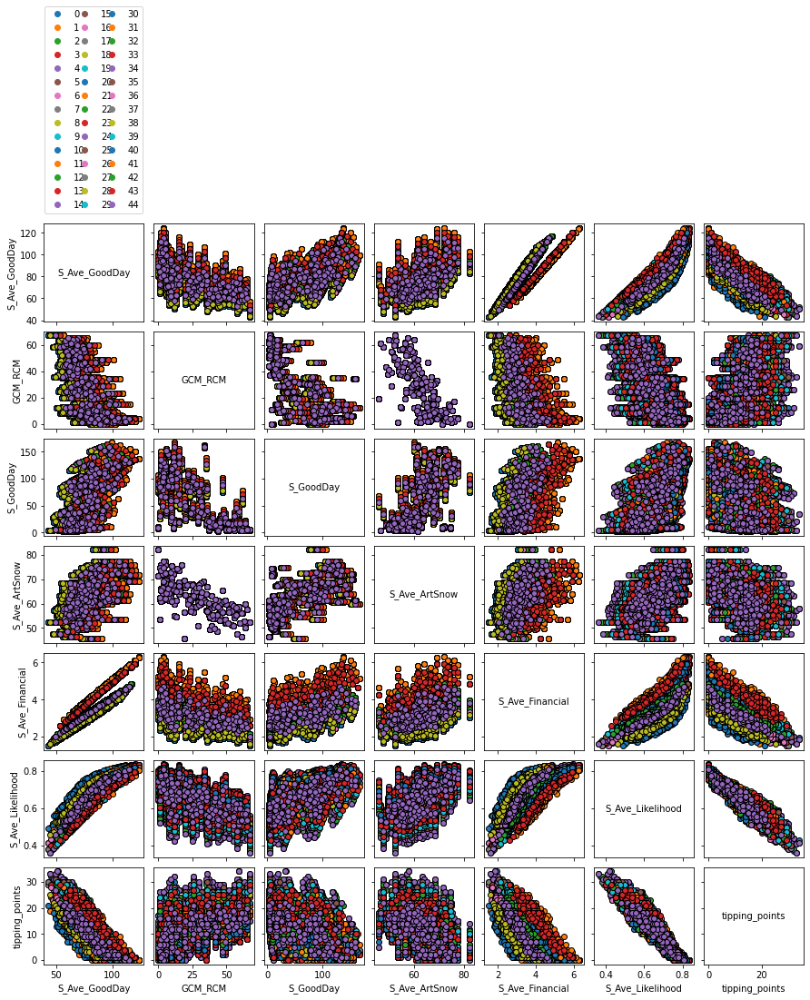

In [5]:
from ema_workbench.analysis import pairs_plotting
fig, axes = pairs_plotting.pairs_scatter(experiments, outcomes, group_by='policy',
                                         legend=True)
fig.set_size_inches(15, 15)

fig.savefig(os.path.join(rootOut, 'SA_All_outputs.svg'), format='svg', dpi=600)
#fig.savefig(os.path.join(rootOut, 'SA_All_outputs.tiff'), format='tiff', dpi=600)


plt.show()

In [10]:
outcomes2 = outcomes
outcomes2 = outcomes2.pop('GCM_RCM')

KeyError: 'GCM_RCM'

In [11]:
print(outcomes2)

{'S_Ave_GoodDay': array([88.13434534, 61.19841879, 61.89092267, ..., 62.93066881,
       72.83756915, 80.7207339 ]), 'S_GoodDay': array([[ 57.43433333,  98.10508333, 147.26375   , ...,  34.39245833,
         57.74233333,  10.125125  ],
       [ 78.55095833,  97.61370833, 122.97120833, ...,   7.895375  ,
          2.79216667,  14.92029167],
       [104.1805    , 141.58675   , 153.47958333, ...,  25.00058333,
         10.400375  ,  27.37354167],
       ...,
       [ 13.17396   , 109.49148   , 135.95304   , ...,  33.59164   ,
         16.03776   ,  25.6252    ],
       [106.59056   , 106.63936   , 122.26256   , ...,   8.9662    ,
         58.84396   ,  18.08916   ],
       [ 25.72912   , 142.01948   , 160.51624   , ...,  78.52724   ,
         59.57384   , 103.79116   ]]), 'S_Ave_ArtSnow': array([72.00381356, 48.58381356, 60.38644068, ..., 63.71525424,
       67.45169492, 74.63220339]), 'S_Ave_Financial': array([3.70169492, 2.57872881, 2.59847458, ..., 2.59788136, 3.00669492,
       3.3206

In [12]:
new_dict = {key:val for key, val in outcomes2.items() if key != 'GCM_RCM'} 

In [13]:
print(list(new_dict.keys()))

['S_Ave_GoodDay', 'S_GoodDay', 'S_Ave_ArtSnow', 'S_Ave_Financial', 'S_Ave_Likelihood', 'tipping_points']


[MainProcess/DEBUG] generating pairwise scatter plot
No handles with labels found to put in legend.


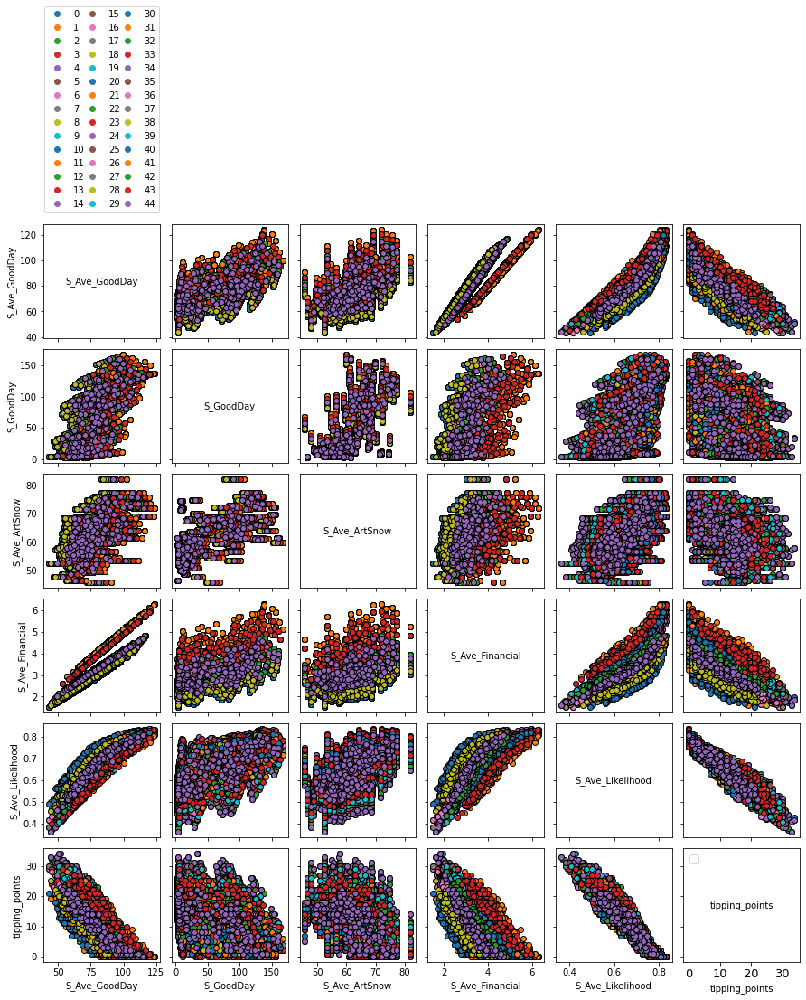

In [14]:
from ema_workbench.analysis import pairs_plotting
fig, axes = pairs_plotting.pairs_scatter(experiments, new_dict, group_by='policy',
                                         legend=True)

plt.yticks(fontsize=13)
plt.xticks(fontsize=13)
plt.legend(fontsize=13)

fig.set_size_inches(15, 15)
fig.savefig(os.path.join(rootOut, 'SA_All_outputs2.svg'), format='svg', dpi=300)
fig.savefig(os.path.join(rootOut, 'SA_All_outputs2.tiff'), format='tiff', dpi=300)
fig.savefig(os.path.join(rootOut, 'SA_All_outputs2_2.tiff'), format='tiff', dpi=150)
fig.savefig(os.path.join(rootOut, 'SA_All_outputs2_2.jpg'), format='jpg', dpi=150)



plt.show()

### Moving the outputs to the folder of results
### Assign the address of outputs folders

In [15]:
import tarfile

shutil.move(os.path.join(root, 'Outputs_py'), os.path.join(rootOut, 'Outputs_py'))
shutil.move(os.path.join(root, 'outSeason'), os.path.join(rootOut, 'outSeason')) 
shutil.move(os.path.join(root, 'outSeason_Likelihood_survival'), os.path.join(rootOut, 'outSeason_Likelihood_survival')) 
shutil.move(os.path.join(root, 'outSeasonArt'), os.path.join(rootOut, 'outSeasonArt')) 
shutil.move(os.path.join(root, 'outSeasonFinancial'), os.path.join(rootOut, 'outSeasonFinancial')) 

rootVisualization = rootOut
with tarfile.open(os.path.join(rootVisualization, '9000_runs.tar.gz'),"r") as zip_ref:
    zip_ref.extractall(os.path.join(rootVisualization, '9000_runs'))

# We have five types of outputs
outDaily = os.path.join(rootVisualization, 'Outputs_py')
outSeasonTippingPoint = os.path.join(rootVisualization, 'outSeason')
outSeason_Likelihood_survival = os.path.join(rootVisualization, 'outSeason_Likelihood_survival')
outSeasonArtificialSnowPossibility = os.path.join(rootVisualization, 'outSeasonArt')
outSeasonFinancial = os.path.join(rootVisualization, 'outSeasonFinancial')
out_ema = os.path.join(rootVisualization, '9000_runs')

In [16]:
df4_ema_experiment = pd.read_csv(os.path.join(out_ema, 'experiments.csv'))
df4_ema_y = pd.read_csv(os.path.join(out_ema, 'S_Ave_GoodDay.csv'), header=None)
df4_ema_y.columns = ["Yout"]
df4_ema_y1 = pd.read_csv(os.path.join(out_ema, 'GCM_RCM.csv'), header=None)
df4_ema_y1.columns = ["Yout1"]
df4_ema_y3 = pd.read_csv(os.path.join(out_ema, 'S_GoodDay.csv'), header=None)
df4_ema_y3.columns = ["Yout3" + "_" + str(i) for i in range(118)]
df4_ema_y4 = pd.read_csv(os.path.join(out_ema, 'S_Ave_ArtSnow.csv'), header=None)
df4_ema_y4.columns = ["Yout4"]
df4_ema_y5 = pd.read_csv(os.path.join(out_ema, 'S_Ave_Financial.csv'), header=None)
df4_ema_y5.columns = ["Yout5"]
df4_ema_y6 = pd.read_csv(os.path.join(out_ema, 'S_Ave_Likelihood.csv'), header=None)
df4_ema_y6.columns = ["Yout6"]
df4_ema_y7 = pd.read_csv(os.path.join(out_ema, 'tipping_points.csv'), header=None)
df4_ema_y7.columns = ["Yout7"]

#### Make a database from the outputs of ema framework by concatinating the every output and experiments table

In [17]:
df_final_ema = pd.concat((df4_ema_experiment, df4_ema_y, df4_ema_y1, df4_ema_y3, df4_ema_y4, df4_ema_y5, df4_ema_y6, df4_ema_y7 ), axis = 1)
df_final_ema.head()

,X2fM,X3iPot,X5temp,X6tempArt,Xfactor1,xClimateModel,xRCP,x1SnowThershold,xGoodDays,scenario,policy,model,Yout,Yout1,Yout3_0,Yout3_1,Yout3_2,Yout3_3,Yout3_4,Yout3_5,Yout3_6,Yout3_7,Yout3_8,Yout3_9,Yout3_10,Yout3_11,Yout3_12,Yout3_13,Yout3_14,Yout3_15,Yout3_16,Yout3_17,Yout3_18,Yout3_19,...,Yout3_88,Yout3_89,Yout3_90,Yout3_91,Yout3_92,Yout3_93,Yout3_94,Yout3_95,Yout3_96,Yout3_97,Yout3_98,Yout3_99,Yout3_100,Yout3_101,Yout3_102,Yout3_103,Yout3_104,Yout3_105,Yout3_106,Yout3_107,Yout3_108,Yout3_109,Yout3_110,Yout3_111,Yout3_112,Yout3_113,Yout3_114,Yout3_115,Yout3_116,Yout3_117,Yout4,Yout5,Yout6,Yout7
0,1.069688,944.174631,5.409598,-1.220357,2.046425,0.959141,1.0,240.0,60.0,0,0,UZHModel,88.134345,11,57.434333,98.105083,147.263750,88.431625,139.280875,78.900250,123.944958,102.506250,44.671958,53.047083,134.630500,81.866125,141.914292,123.204833,86.891750,100.385292,120.623542,107.361000,77.355667,82.295208,...,115.443208,19.062833,129.206583,119.479583,112.959417,115.727167,94.045750,88.010167,13.879708,43.663375,96.619333,93.945833,6.954417,27.096708,114.460125,58.401500,111.089000,140.821875,59.408000,51.823500,124.967875,41.968292,70.089500,85.322000,108.361708,22.498083,83.085583,34.392458,57.742333,10.125125,72.003814,3.701695,0.776240,1.0
1,1.048662,983.739422,4.512921,-1.986318,3.361615,0.211326,3.0,240.0,60.0,1,0,UZHModel,61.198419,43,78.550958,97.613708,122.971208,57.137708,74.836292,150.873958,132.584083,72.326042,138.117458,106.412708,124.644500,111.342833,90.388375,127.449708,70.326500,30.078000,79.711333,118.376542,13.510167,96.918583,...,23.231125,72.185375,53.231583,8.054542,30.094625,70.569958,7.963500,18.296875,8.496833,1.968500,6.923167,38.354125,90.889208,111.300917,13.629833,14.802833,7.367167,7.293875,1.380083,6.197917,5.599417,3.865125,13.609250,3.093583,6.952542,6.507833,40.683750,7.895375,2.792167,14.920292,48.583814,2.578729,0.580181,12.0
2,1.122691,977.980311,4.711553,-1.174757,1.680774,0.322348,3.0,240.0,60.0,2,0,UZHModel,61.890923,46,104.180500,141.586750,153.479583,118.076375,114.915750,127.912458,83.970667,120.416167,153.817125,85.539958,47.748583,139.200750,136.988958,113.893000,109.595125,113.575958,44.670417,96.680792,14.943833,106.423708,...,82.342375,7.589833,46.123167,13.341333,16.173417,94.929583,106.564000,40.105708,4.486000,20.778042,10.246000,21.607125,9.551042,11.700208,16.287500,19.150167,8.486833,2.379292,11.215708,13.975708,9.906958,12.542958,9.633917,70.664500,1.453542,62.113042,7.688625,25.000583,10.400375,27.373542,60.386441,2.598475,0.589929,10.0
3,1.118246,1015.935396,4.807165,-1.693693,2.782654,0.650482,1.0,240.0,60.0,3,0,UZHModel,77.649580,7,59.228917,69.783833,124.771833,103.280292,147.664708,80.608125,121.137250,96.231000,161.853500,117.570708,85.716875,143.184625,141.150250,132.248458,62.749167,10.653708,36.316500,72.778333,86.013250,92.165083,...,68.092792,71.112750,56.904042,31.805458,123.288500,51.120958,37.663833,75.486792,112.384542,35.671625,125.761667,65.891833,43.366750,28.231625,72.522250,124.046417,15.828250,47.366958,27.438167,97.643458,94.554750,29.858625,61.776333,41.983625,92.728000,116.680875,79.679833,17.347875,80.103750,86.784708,66.117458,3.288729,0.742036,2.0
4,1.530131,1059.660563,4.837406,-1.559564,1.989237,0.352432,1.0,240.0,60.0,4,0,UZHModel,83.897664,4,51.208042,96.762500,115.500250,102.415833,90.903833,132.664542,95.433833,130.009625,147.368542,74.296208,149.474250,86.705958,116.019750,106.630375,44.038333,133.483875,97.411542,70.429458,78.328250,47.630208,...,118.924333,153.385000,42.531583,14.296583,113.391250,90.284875,89.767083,129.673208,15.011292,16.186250,65.684750,74.057292,55.427250,73.587792,72.404750,95.237750,29.681958,103.879458,52.049417,104.391583,38.795958,82.250667,89.591000,116.284667,96.461333,126.817167,49.307000,106.941375,87.530375,111.079250,71.695000,3.543220,0.761890,0.0


In [18]:
df_final_ema.to_csv(os.path.join(rootVisualization, 'df_final_ema.csv'), index = False)

In [19]:
# Taking the values
x2 = df_final_ema['X2fM'].values
x3 = df_final_ema['X3iPot'].values
x5 = df_final_ema['X5temp'].values
x6 = df_final_ema['X6tempArt'].values
xRCP = df_final_ema['xRCP'].values
xClimateModel = df_final_ema['xClimateModel'].values
x1SnowThershold = df_final_ema['x1SnowThershold'].values
xGoodDays = df_final_ema['xGoodDays'].values

YY = df_final_ema['Yout'].values
y1 = df_final_ema['Yout1'].values
y3 = df_final_ema['Yout3_95'].values
y4 = df_final_ema['Yout4'].values
y5 = df_final_ema['Yout5'].values
y6 = df_final_ema['Yout6'].values
y7 = df_final_ema['Yout7'].values

In [20]:
outFolder = rootVisualization
outSeasonFolder = os.path.join(outFolder, 'outSeason')
outSeasonFinancial = os.path.join(outFolder, 'outSeasonFinancial')
outSeasonArt = os.path.join(outFolder, 'outSeasonArt')
outSeason_Likelihood_survival = os.path.join(outFolder, 'outSeason_Likelihood_survival')

In [21]:
#### 2020/07/22 ####
all_Files = []
for filename in os.walk(outSeasonFolder):
    all_Files = filename[2]
    
totalFiles_loc = []
for i in range(len(all_Files)):
    totalFiles_loc.append(os.path.join(outSeasonFolder, all_Files[i]))
    
### 2020/08/23
all_Files_fin = []
for filename in os.walk(outSeasonFinancial):
    all_Files_fin = filename[2]
    
totalFiles_loc_fin = []
for i in range(len(all_Files_fin)):
    totalFiles_loc_fin.append(os.path.join(outSeasonFinancial, all_Files_fin[i]))
    
### 2020/08/23
all_Files_Art = []
for filename in os.walk(outSeasonArt):
    all_Files_Art = filename[2]
    
totalFiles_loc_Art = []
for i in range(len(all_Files_Art)):
    totalFiles_loc_Art.append(os.path.join(outSeasonArt, all_Files_Art[i]))

### 2020/08/23
all_Files_Like = []
for filename in os.walk(outSeason_Likelihood_survival):
    all_Files_Like = filename[2]
    
totalFiles_loc_Like = []
for i in range(len(all_Files_Like)):
    totalFiles_loc_Like.append(os.path.join(outSeason_Likelihood_survival, all_Files_Like[i]))


#### Total number of outputs (csv files) in each out folder produced by our framework

In [22]:
print(len(totalFiles_loc))
print(len(totalFiles_loc_fin))
print(len(totalFiles_loc_Art))
print(len(totalFiles_loc_Like))

9000
9000
9000
9000


In [23]:
emptyMatrixGoodDays = [np.empty([119, 69]) for _ in range(len(totalFiles_loc))]
    
for i in range(0, len(totalFiles_loc), 1):
    b = []
    with open(totalFiles_loc[i], 'r') as file:
        outputReaderlines = file.readlines()
        for j in range (len(outputReaderlines)):
            b.append(outputReaderlines[j].replace('\n','').split(','))
    
    emptyMatrixGoodDays[i] = np.array(b)

### 2020/08/23
emptyMatrixfin = [np.empty([119, 69]) for _ in range(len(totalFiles_loc_fin))]

for i in range(0, len(totalFiles_loc_fin), 1):
    b = []
    with open(totalFiles_loc_fin[i], 'r') as file:
        outputReaderlines_fin = file.readlines()
        for j in range (len(outputReaderlines_fin)):
            b.append(outputReaderlines_fin[j].replace('\n','').split(','))
    
    emptyMatrixfin[i] = np.array(b)

### 2020/08/23
emptyMatrixArt = [np.empty([119, 69]) for _ in range(len(totalFiles_loc_Art))]

for i in range(0, len(totalFiles_loc_Art), 1):
    b = []
    with open(totalFiles_loc_Art[i], 'r') as file:
        outputReaderlines_Art = file.readlines()
        for j in range (len(outputReaderlines_Art)):
            b.append(outputReaderlines_Art[j].replace('\n','').split(','))
    
    emptyMatrixArt[i] = np.array(b)
    
### 2020/08/23
emptyMatrixLike = [np.empty([119, 69]) for _ in range(len(totalFiles_loc_Like))]

for i in range(0, len(totalFiles_loc_Like), 1):
    b = []
    with open(totalFiles_loc_Like[i], 'r') as file:
        outputReaderlines_Like = file.readlines()
        for j in range (len(outputReaderlines_Like)):
            b.append(outputReaderlines_Like[j].replace('\n','').split(','))
    
    emptyMatrixLike[i] = np.array(b)

In [24]:
#matrix_GoodDays = np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1)), axis=2)
matrix_GoodDays = np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1)), axis=0)
matrix_fin = np.stack((emptyMatrixfin[i] for i in range (0,len(totalFiles_loc_fin),1)), axis=0)
matrix_Art = np.stack((emptyMatrixArt[i] for i in range (0,len(totalFiles_loc_Art),1)), axis=0)
matrix_Like = np.stack((emptyMatrixLike[i] for i in range (0,len(totalFiles_loc_Like),1)), axis=0)

C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\IPython\core\interactiveshell.py:3337: FutureWarning: arrays to stack must be passed as a "sequence" type such as list or tuple. Support for non-sequence iterables such as generators is deprecated as of NumPy 1.16 and will raise an error in the future.
  if (await self.run_code(code, result,  async_=asy)):


In [25]:
print(matrix_GoodDays.shape)
print(matrix_fin.shape)
print(matrix_Art.shape)
print(matrix_Like.shape)

(9000, 119, 2)
(9000, 119, 2)
(9000, 119, 2)
(9000, 119, 2)


#### Check the header of outputs

In [26]:
print(emptyMatrixGoodDays[1][0,1])
print(emptyMatrixfin[1][0,1])
print(emptyMatrixArt[1][0,1])
print(emptyMatrixLike[1][0,1])

isOverSnow_sc_Ver2_85_7
Money_sc_Ver2_85_7
ArtSnowPossibility_sc_Ver2_85_7
isOverSnow_sc_Ver2_85_7


In [27]:
matrix_GoodDays26= np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1) \
                             if 'RCP26' in emptyMatrixGoodDays[i][0,1] or \
                             '_26_' in emptyMatrixGoodDays[i][0,1] ) , axis=0) 
matrix_GoodDays45= np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1) \
                             if 'RCP45' in emptyMatrixGoodDays[i][0,1] or \
                            '_45_' in emptyMatrixGoodDays[i][0,1] ), axis=0)
matrix_GoodDays85= np.stack((emptyMatrixGoodDays[i] for i in range (0,len(totalFiles_loc),1) \
                             if 'RCP85' in emptyMatrixGoodDays[i][0,1] or \
                            '_85_' in emptyMatrixGoodDays[i][0,1]), axis=0) 

### 2020/08/23
matrix_fin26= np.stack((emptyMatrixfin[i] for i in range (0,len(totalFiles_loc_fin),1) \
                             if 'RCP26' in emptyMatrixfin[i][0,1] or \
                             '_26_' in emptyMatrixfin[i][0,1] ) , axis=0) 
matrix_fin45= np.stack((emptyMatrixfin[i] for i in range (0,len(totalFiles_loc_fin),1) \
                             if 'RCP45' in emptyMatrixfin[i][0,1] or \
                            '_45_' in emptyMatrixfin[i][0,1] ), axis=0)
matrix_fin85= np.stack((emptyMatrixfin[i] for i in range (0,len(totalFiles_loc_fin),1) \
                             if 'RCP85' in emptyMatrixfin[i][0,1] or \
                            '_85_' in emptyMatrixfin[i][0,1]), axis=0) 

### 2020/08/23
matrix_Art26= np.stack((emptyMatrixArt[i] for i in range (0,len(totalFiles_loc_Art),1) \
                             if 'RCP26' in emptyMatrixArt[i][0,1] or \
                             '_26_' in emptyMatrixArt[i][0,1] ) , axis=0) 
matrix_Art45= np.stack((emptyMatrixArt[i] for i in range (0,len(totalFiles_loc_Art),1) \
                             if 'RCP45' in emptyMatrixArt[i][0,1] or \
                            '_45_' in emptyMatrixArt[i][0,1] ), axis=0)
matrix_Art85= np.stack((emptyMatrixArt[i] for i in range (0,len(totalFiles_loc_Art),1) \
                             if 'RCP85' in emptyMatrixArt[i][0,1] or \
                            '_85_' in emptyMatrixArt[i][0,1]), axis=0) 

### 2020/08/23
matrix_Like26= np.stack((emptyMatrixLike[i] for i in range (0,len(totalFiles_loc_Like),1) \
                             if 'RCP26' in emptyMatrixLike[i][0,1] or \
                             '_26_' in emptyMatrixLike[i][0,1] ) , axis=0) 
matrix_Like45= np.stack((emptyMatrixLike[i] for i in range (0,len(totalFiles_loc_Like),1) \
                             if 'RCP45' in emptyMatrixLike[i][0,1] or \
                            '_45_' in emptyMatrixLike[i][0,1] ), axis=0)
matrix_Like85= np.stack((emptyMatrixLike[i] for i in range (0,len(totalFiles_loc_Like),1) \
                             if 'RCP85' in emptyMatrixLike[i][0,1] or \
                            '_85_' in emptyMatrixLike[i][0,1]), axis=0) 

In [28]:
print(type(matrix_GoodDays))
print(matrix_GoodDays.ndim)
print(len(matrix_GoodDays))
print(matrix_GoodDays.size)
print(matrix_GoodDays.dtype)
print(matrix_GoodDays.dtype.name)
print("#########")
print(matrix_GoodDays26.shape)
print(matrix_GoodDays45.shape)
print(matrix_GoodDays85.shape)
print(len(matrix_GoodDays26) + len(matrix_GoodDays45) + len(matrix_GoodDays85))
print("#########")
print(matrix_fin26.shape)
print(matrix_fin45.shape)
print(matrix_fin85.shape)
print(len(matrix_fin26) + len(matrix_fin45) + len(matrix_fin85))
print("#########")
print(matrix_Art26.shape)
print(matrix_Art45.shape)
print(matrix_Art85.shape)
print(len(matrix_Art26) + len(matrix_Art45) + len(matrix_Art85))
print("#########")
print(matrix_Like26.shape)
print(matrix_Like45.shape)
print(matrix_Like85.shape)
print(len(matrix_Like26) + len(matrix_Like45) + len(matrix_Like85))

<class 'numpy.ndarray'>
3
9000
2142000
<U47
str1504
#########
(3015, 119, 2)
(2970, 119, 2)
(3015, 119, 2)
9000
#########
(3015, 119, 2)
(2970, 119, 2)
(3015, 119, 2)
9000
#########
(3015, 119, 2)
(2970, 119, 2)
(3015, 119, 2)
9000
#########
(3015, 119, 2)
(2970, 119, 2)
(3015, 119, 2)
9000


In [29]:
print(matrix_GoodDays[2, 1:, 1:2].shape)
print(matrix_fin[2, 1:, 1:2].shape)
print(matrix_Art[2, 1:, 1:2].shape)
print(matrix_Like[2, 1:, 1:2].shape)

(118, 1)
(118, 1)
(118, 1)
(118, 1)


### Calculate the quantiles for each year of simulation (1981-2100)

In [30]:
q10_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years = np.quantile(matrix_GoodDays[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_fin = np.quantile(matrix_fin[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Art = np.quantile(matrix_Art[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Like = np.quantile(matrix_Like[:, 1:, 1:2].astype(float), 0.9, axis=0)


In [31]:
print(q10_years[0])
print(q25_years[0])
print(q50_years[0])
print(q75_years[0])
print(q90_years[0])
print(q50_years.shape)

#2020/08/23
print(q10_years_fin[0])
print(q25_years_fin[0])
print(q50_years_fin[0])
print(q75_years_fin[0])
print(q90_years_fin[0])
print(q50_years_fin.shape)

print(q10_years_Art[0])
print(q25_years_Art[0])
print(q50_years_Art[0])
print(q75_years_Art[0])
print(q90_years_Art[0])
print(q50_years_Art.shape)

print(q10_years_Like[0])
print(q25_years_Like[0])
print(q50_years_Like[0])
print(q75_years_Like[0])
print(q90_years_Like[0])
print(q50_years_Like.shape)

[43.66849876]
[57.87747759]
[77.70418452]
[101.84957692]
[121.860005]
(118, 1)
[1.619]
[2.2975]
[3.22]
[4.33]
[5.221]
(118, 1)
[50.796]
[55.72]
[64.545]
[74.9875]
[83.747]
(118, 1)
[51.66366667]
[71.68548276]
[98.32013393]
[100.]
[100.]
(118, 1)


#### Set the parameters of making figure

In [ ]:
num_Simulation = 9000
p_Step = 20
alpha_Fade = 0.04

NameError: name 'num_Simulation' is not defined

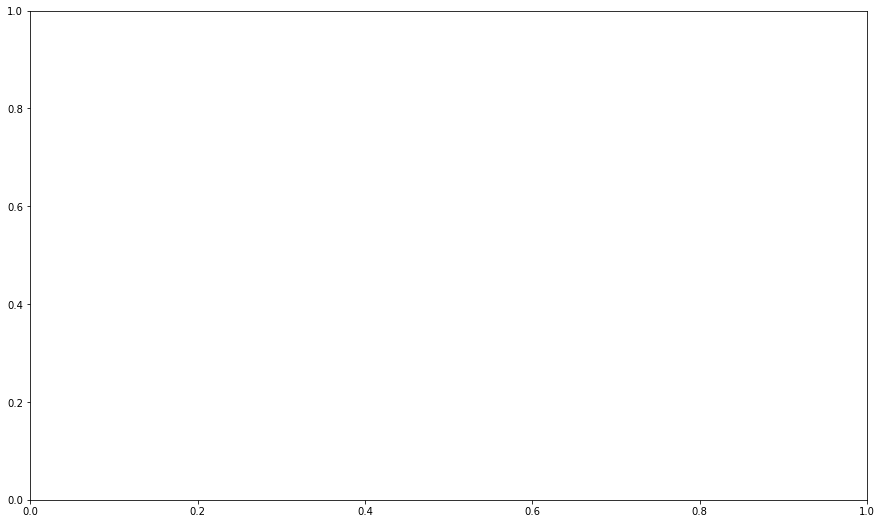

In [32]:
fig1, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, num_Simulation, p_Step):
    a = matrix_GoodDays[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)


axs.axhline(y=100, color='green', alpha=0.8)
axs.axhline(y=70, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years, color='green', linewidth = 2, alpha=1)


axs.set_ylim(bottom=0, top =181)
axs.set_title('Hoch_Ybrigh(1400 m)')
axs.set_xlabel('Years')
axs.set_ylabel('Days With Good Snow Condition')

fig1.savefig(os.path.join(rootVisualization, 'RCP_All_number_of_day_goodSnow.svg'), format='svg', dpi=300)

plt.show()

In [ ]:
fig2, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, num_Simulation, p_Step):
    a = matrix_fin[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='orange', linestyle = '--', alpha=alpha_Fade)


axs.axhline(y=4, color='green', alpha=0.8)
axs.axhline(y=2, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_fin, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_fin, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_fin, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_fin, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_fin, color='green', linewidth = 2, alpha=1)


axs.set_ylim(bottom=-1, top =9)
axs.set_title('Hoch_Ybrigh(1400m)')
axs.set_xlabel('Years')
axs.set_ylabel('Financial Balance')

fig2.savefig(os.path.join(rootVisualization, 'RCP_All_Financial.svg'), format='svg', dpi=300)

plt.show()

In [ ]:
fig3, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, num_Simulation, p_Step):
    a = matrix_Art[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='yellow', linestyle = '--', alpha=alpha_Fade)


axs.axhline(y=90, color='green', alpha=0.8)
axs.axhline(y=50, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_Art, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_Art, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_Art, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_Art, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_Art, color='green', linewidth = 2, alpha=1)


axs.set_ylim(bottom=-1, top =140)
axs.set_title('Hoch_Ybrigh(1400m)')
axs.set_xlabel('Years')
axs.set_ylabel('Possibility of making Artificial Snow over time')

fig3.savefig(os.path.join(rootVisualization, 'RCP_All_ArtSnow.svg'), format='svg', dpi=300)

plt.show()

In [ ]:
fig4, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, num_Simulation, p_Step):
    a = matrix_Like[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='pink', linestyle = '--', alpha=alpha_Fade)


axs.axhline(y=90, color='green', alpha=0.8)
axs.axhline(y=50, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_Like, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_Like, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_Like, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_Like, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_Like, color='green', linewidth = 2, alpha=1)


axs.set_ylim(bottom=-1, top =120)
axs.set_title('Hoch_Ybrigh(1400m)')
axs.set_xlabel('Years')
axs.set_ylabel('Likelihood of Survival from physical tipping points over time')

fig4.savefig(os.path.join(rootVisualization, 'RCP_All_Likelihood.svg'), format='svg', dpi=300)

plt.show()

### Visualization with ema-workbench - part2 

## Scenario Discovery 
### A model driven approach to scenario development

There is ample literature on both CART and PRIM and their relative merits for use in scenario discovery.

S_Ave_GoodDay: Seasonal average (1981-2100) of days with Good Snow Conditions for Skiing  (snow depth > 200 - 300 mm)

GCM_RCM: The Climate model which has been used (Should not be presented in the outcomes)

Ave_GoodDay: Seasonal (1981-2100) number of days with Good Snow Conditions for Skiing  (snow depth > 200 - 300 mm)

S_Ave_ArtSnow: Seasonal average (1981-2100) of number of days with the possibility of Artificial Snow Making (ave TEMP < -2 to -1)

S_Ave_Financial: Relative seasonal average (1981-2100) of Financial balance of Ski resort

S_Ave_Likelihood: Seasonal average (1981-2100) Likelihood of survival of a Ski resort from tipping points

tipping_points: Number of tipping points (1981-2100)

In [33]:
from ema_workbench.analysis import prim

x = experiments
y = outcomes['S_Ave_GoodDay'] < 60
prim_alg = prim.Prim(x, y, threshold=0.6)
box1 = prim_alg.find_box()

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] 9000 points remaining, containing 1135 cases of interest
[MainProcess/DEBUG] peeling completed
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting X6tempArt
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting completed
[MainProcess/INFO] mean: 0.9333333333333333, mass: 0.05, coverage: 0.3700440528634361, density: 0.9333333333333333 restricted_dimensions: 4


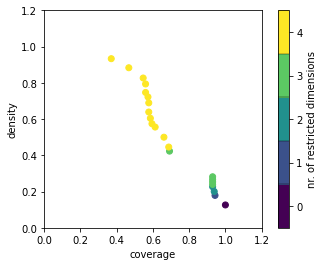

<Figure size 432x288 with 0 Axes>

In [34]:
#import mpld3
#fig, axs = plt.subplots()
#fig5, axs = plt.subplots(figsize=(15,9))
box1.show_tradeoff()
plt.show()
plt.savefig(os.path.join(rootVisualization, 'coverage_density_1.png'))
            
#mpld3.display()
#fig5.savefig(os.path.join(rootVisualization, 'box.svg'), format='svg', dpi=600)

coverage    0.577093
density     0.689474
id                15
mass        0.105556
mean        0.689474
res_dim            4
Name: 15, dtype: object

                                              box 15  \
                                                 min   
X5temp                                       4.50587   
X6tempArt                                   -1.99823   
xRCP                                             2.5   
x1SnowThershold  {290.0, 260.0, 300.0, 270.0, 280.0}   

                                                      \
                                                 max   
X5temp                                       5.48392   
X6tempArt                                   -1.08057   
xRCP                                               3   
x1SnowThershold  {290.0, 260.0, 300.0, 270.0, 280.0}   

                                                 
                                      qp values  
X5temp           [-1.0, 1.0697310866346658e-56]  
X6tempArt         [-1.0, 

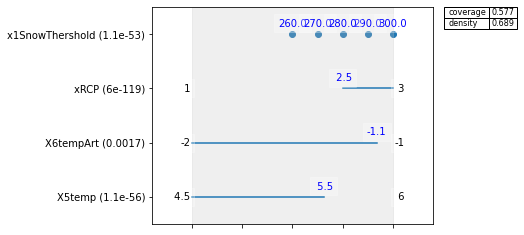

In [35]:
# Saeed : explore the inspect effect
box1.inspect(15)
box1.inspect(15, style='graph')
plt.show()

x1SnowThershold [290.0, 260.0, 300.0, 270.0, 280.0, 200.0, 240.0, 250.0, 220.0]


C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\ema_workbench\analysis\scenario_discovery_util.py:404: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(labels)


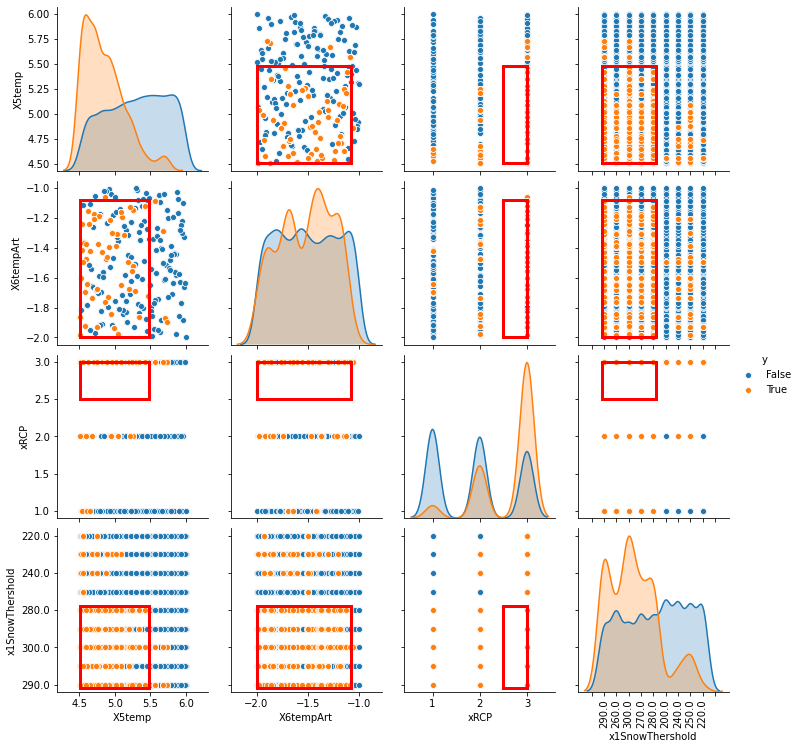

In [36]:
# fig, axs = plt.subplots()
axs1 = box1.show_pairs_scatter(15)
plt.show()
axs1.savefig(os.path.join(rootVisualization, 'multi_graphs_gooddays_70.svg'), format='svg', dpi=600)
axs1.savefig(os.path.join(rootVisualization, 'multi_graphs_gooddays_70.tiff'), format='tiff', dpi=300)
axs1.savefig(os.path.join(rootVisualization, 'multi_graphs_gooddays_2_70.tiff'), format='tiff', dpi=150)

In [37]:
box2 = prim_alg.find_box()

[MainProcess/INFO] 8550 points remaining, containing 715 cases of interest
[MainProcess/DEBUG] peeling completed
[MainProcess/DEBUG] pasting X2fM
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting X6tempArt
[MainProcess/DEBUG] pasting Xfactor1
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting completed
[MainProcess/INFO] box does not meet threshold criteria, value is 0.44565217391304346, returning dump box


In [38]:
#import mpld3
box2.show_tradeoff()
plt.show()
#mpld3.display()
#fig.savefig(os.path.join(rootVisualization, 'box2.svg'), format='svg', dpi=600)

ZeroDivisionError: division by zero

<Figure size 432x288 with 2 Axes>

In [39]:
# Saeed : explore the inspect effect
box2.inspect(15)
box2.inspect(15, style='graph')
plt.show()

IndexError: single positional indexer is out-of-bounds

In [40]:
# fig, axs = plt.subplots()
axs2 = box2.show_pairs_scatter(15)
plt.show()
axs2.savefig(os.path.join(rootVisualization, 'multi_graphs_gooddays_2_.svg'), format='svg', dpi=300)

IndexError: list index out of range

### Artifical snow analysis

In [41]:
x = experiments
y = outcomes['S_Ave_ArtSnow'] < 60
prim_alg = prim.Prim(x, y, threshold=0.8)
box3 = prim_alg.find_box()

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] 9000 points remaining, containing 3465 cases of interest
[MainProcess/DEBUG] peeling completed
[MainProcess/DEBUG] pasting X6tempArt
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting completed
[MainProcess/INFO] mean: 1.0, mass: 0.26, coverage: 0.6753246753246753, density: 1.0 restricted_dimensions: 2


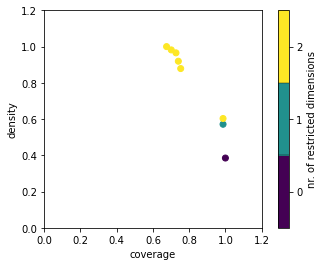

In [42]:
box3.show_tradeoff()
plt.show()
#fig.savefig(os.path.join(rootVisualization, 'box_Artificial.svg'), format='svg', dpi=600)

coverage     0.74026
density     0.919355
id                 4
mass            0.31
mean        0.919355
res_dim            2
Name: 4, dtype: object

              box 4                                         
                min       max                      qp values
X6tempArt -1.998229 -1.134985  [-1.0, 4.318220826068238e-19]
xRCP       2.500000  3.000000                    [0.0, -1.0]



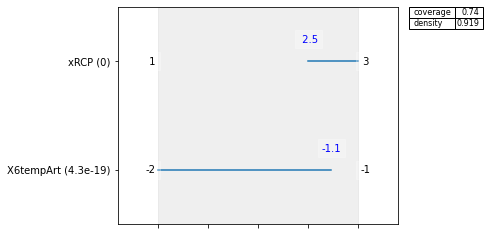

In [43]:
# Saeed : explore the inspect effect
box3.inspect(4)
box3.inspect(4, style='graph')
plt.show()

C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)


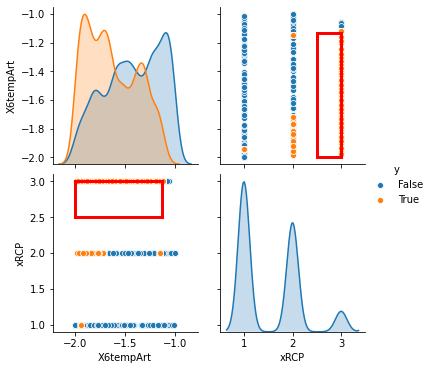

In [44]:
#fig, axs = plt.subplots()
axs4 = box3.show_pairs_scatter(4)
plt.show()
axs4.savefig(os.path.join(rootVisualization, 'multi_graphs_Artificial_40.svg'), format='tiff', dpi=300)

### Likelihood of Survival analysis

In [45]:
x = experiments
y = outcomes['S_Ave_Likelihood'] < 0.5
prim_alg = prim.Prim(x, y, threshold=0.7)
box4 = prim_alg.find_box()

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] 9000 points remaining, containing 665 cases of interest
[MainProcess/DEBUG] peeling completed
[MainProcess/DEBUG] pasting X5temp
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting xGoodDays
[MainProcess/DEBUG] pasting policy
[MainProcess/DEBUG] pasting completed
[MainProcess/INFO] mean: 0.7710084033613446, mass: 0.05288888888888889, coverage: 0.5518796992481203, density: 0.7710084033613446 restricted_dimensions: 5


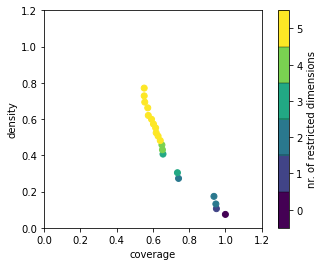

In [46]:
box4.show_tradeoff()
plt.show()
#fig.savefig(os.path.join(rootVisualization, 'box_liklihood.svg'), format='svg', dpi=600)

coverage     0.628571
density      0.506053
id                 10
mass        0.0917778
mean         0.506053
res_dim             5
Name: 10, dtype: object

                                                            box 10  \
                                                               min   
X5temp                                                     4.50587   
xRCP                                                           2.5   
xGoodDays                                            {90.0, 100.0}   
x1SnowThershold  {290.0, 260.0, 300.0, 270.0, 240.0, 280.0, 250.0}   
policy           {0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13,...   

                                                                    \
                                                               max   
X5temp                                                     5.83342   
xRCP                                                             3   
xGoodDays                                            {90.0, 100.0}   
x1

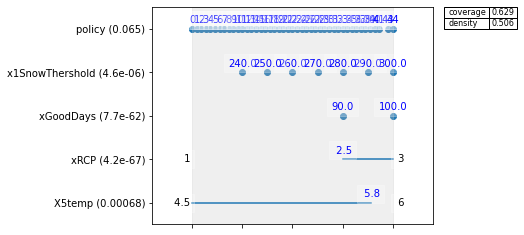

In [47]:
# Saeed : explore the inspect effect
box4.inspect(10)
box4.inspect(10, style='graph')
plt.show()

x1SnowThershold [290.0, 260.0, 300.0, 270.0, 240.0, 280.0, 250.0, 200.0, 220.0]
xGoodDays [90.0, 100.0, 80.0, 60.0, 70.0]
policy [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 43, 44, 42]


C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\seaborn\distributions.py:369: UserWarning: Default bandwidth for data is 0; skipping density estimation.
  warnings.warn(msg, UserWarning)
C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\ema_workbench\analysis\scenario_discovery_util.py:404: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(labels)


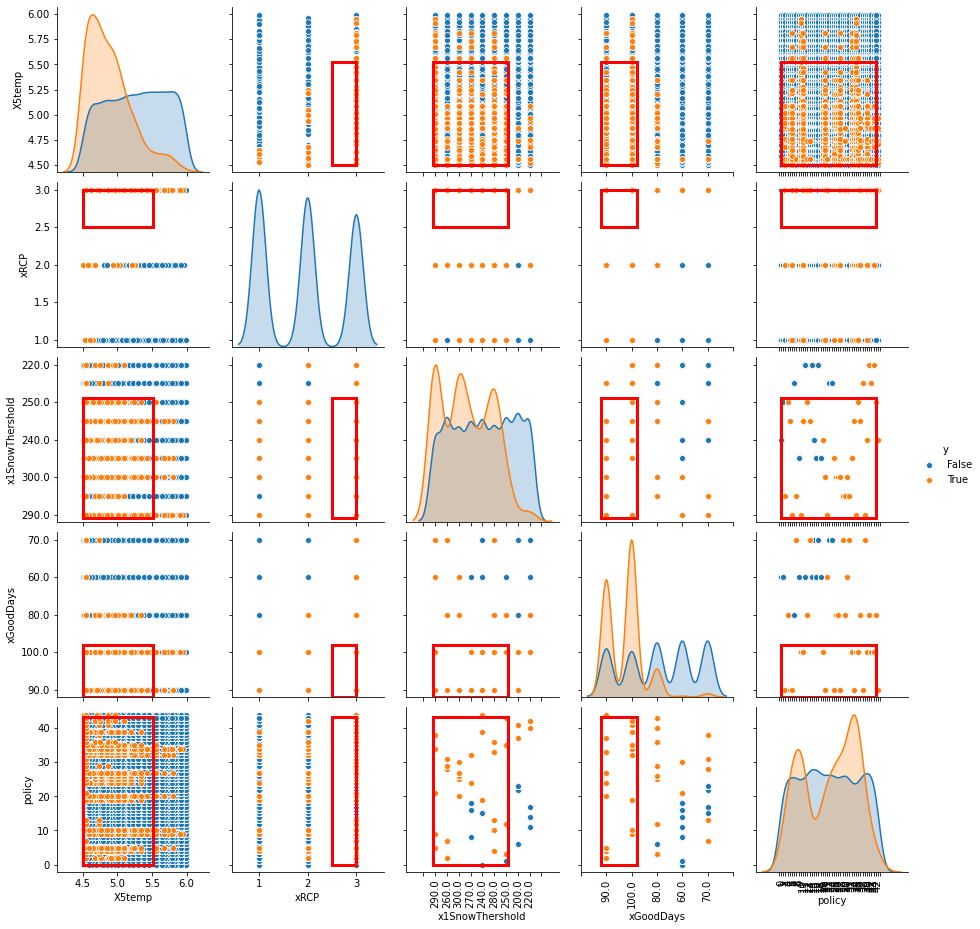

In [48]:
#fig, axs = plt.subplots()
axs3 = box4.show_pairs_scatter(15)
plt.show()
axs3.savefig(os.path.join(rootVisualization, 'multi_graphs_likehood.svg'), format='svg', dpi=600)

### Tipping points analysis

In [49]:
x = experiments
y = outcomes['tipping_points'] < 15
prim_alg = prim.Prim(x, y, threshold=0.8)
box5 = prim_alg.find_box()

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] 9000 points remaining, containing 5361 cases of interest
[MainProcess/DEBUG] peeling completed
[MainProcess/DEBUG] pasting xClimateModel
[MainProcess/DEBUG] pasting xRCP
[MainProcess/DEBUG] pasting x1SnowThershold
[MainProcess/DEBUG] pasting policy
[MainProcess/DEBUG] pasting completed
[MainProcess/INFO] mean: 1.0, mass: 0.08533333333333333, coverage: 0.14325685506435368, density: 1.0 restricted_dimensions: 4


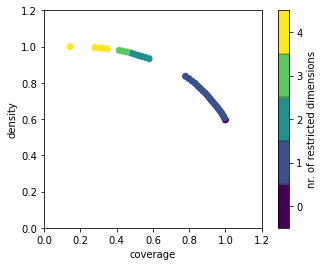

In [50]:
box5.show_tradeoff()
plt.show()
#fig.savefig(os.path.join(rootVisualization, 'box_Artificial.svg'), format='svg', dpi=600)

coverage    0.780078
density       0.8364
id                20
mass        0.555556
mean          0.8364
res_dim            1
Name: 20, dtype: object

                                                   box 20  \
                                                      min   
policy  {0, 1, 3, 6, 7, 8, 11, 12, 13, 14, 15, 16, 17,...   

                                                           \
                                                      max   
policy  {0, 1, 3, 6, 7, 8, 11, 12, 13, 14, 15, 16, 17,...   

                                         
                              qp values  
policy  [1.9829172715272336e-297, -1.0]  



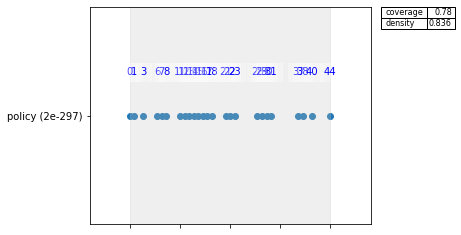

In [51]:
# Saeed : explore the inspect effect
box5.inspect(20)
box5.inspect(20, style='graph')
plt.show()

policy [0, 1, 3, 6, 7, 8, 11, 12, 13, 14, 15, 16, 17, 18, 21, 22, 23, 28, 29, 30, 31, 37, 38, 40, 44, 2, 4, 5, 9, 10, 19, 20, 24, 25, 26, 27, 32, 33, 34, 35, 36, 39, 41, 42, 43]


C:\Users\saeed\AppData\Local\Programs\Python\Python37\lib\site-packages\ema_workbench\analysis\scenario_discovery_util.py:404: UserWarning: FixedFormatter should only be used together with FixedLocator
  ax.set_yticklabels(labels)


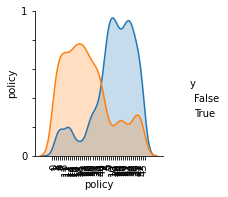

In [52]:
#fig, axs = plt.subplots()
axs5 = box5.show_pairs_scatter(20)
plt.show()

axs5.savefig(os.path.join(rootVisualization, 'multigraphs_tippingpoints.svg'), format='svg', dpi=300)

### Visualization with ema-workbench - part3

In [53]:
experiments2 = experiments
experiments2 = experiments2.pop('policy')

In [54]:
new_dict_experiments = {key:val for key, val in experiments2.items() if key != 'policy'} 

In [55]:
sns.set(font_scale=1.5)

ax6 = sns.heatmap(fs, cmap='viridis', annot=True,
                  vmin=0, linewidths=0.14,linecolor="grey",
                  cbar_kws={'label': 'features ranks','shrink': 0.1})

[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category
[MainProcess/INFO] model dropped from analysis because only a single category


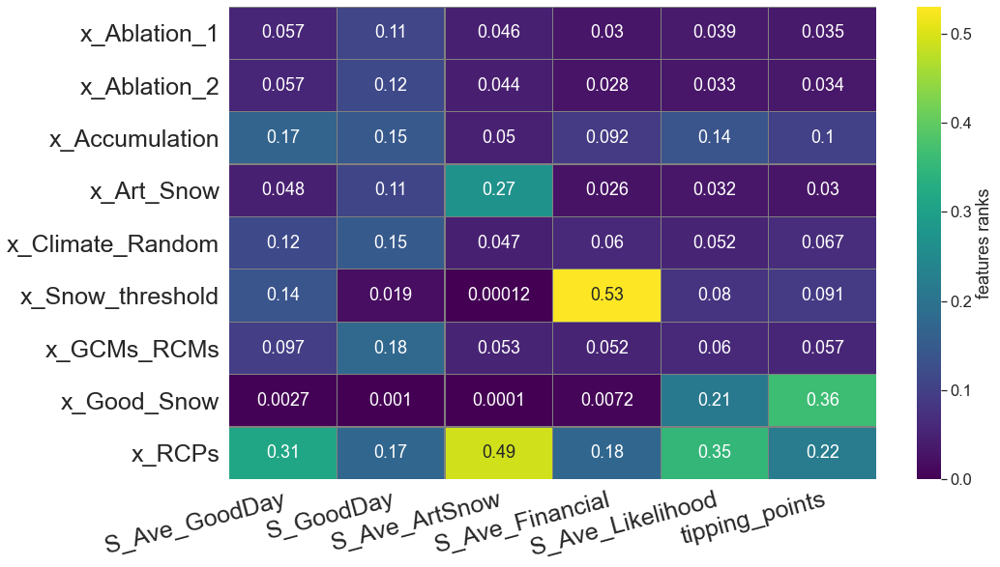

In [56]:
from ema_workbench.analysis import feature_scoring

fig6, ax6 = plt.subplots(figsize=(15,9))

x = experiments
#x = new_dict_experiments
#Y = outcomes
Y = new_dict
fs = feature_scoring.get_feature_scores_all(x, Y)
ax6 = sns.heatmap(fs, cmap='viridis', annot=True,
                  vmin=0, linewidths=0.28,linecolor="grey",
                  cbar_kws={'label': 'features ranks'})

# Rotate the tick labels and set their alignment.
plt.setp(ax6.get_xticklabels(), rotation=15, size = 25, ha="right",
         rotation_mode="anchor")

ylabels = ['x_Ablation_1', 'x_Ablation_2', 'x_Accumulation', 'x_Art_Snow', 'x_Climate_Random', 'x_Snow_threshold', 'x_GCMs_RCMs', 'x_Good_Snow', 'x_RCPs']
ax6.set_yticklabels(ylabels)
plt.setp(ax6.get_yticklabels(), rotation=0, size = 25, ha="right", rotation_mode="anchor")

#ax6.legend(size=13)

plt.show()

fig6.savefig(os.path.join(rootVisualization, 'matrix_importance.svg'), format='svg', dpi=300)
fig6.savefig(os.path.join(rootVisualization, 'matrix_importance.tiff'), format='tiff', dpi=150)
fig6.savefig(os.path.join(rootVisualization, 'matrix_importance.jpg'), format='jpg', dpi=150)

S_Ave_GoodDay: Seasonal average (1981-2100) of days with Good Snow Conditions for Skiing  (snow depth > 200 - 300 mm)

GCM_RCM: The Climate model which has been used (Should not be presented in the outcomes)

Ave_GoodDay: Seasonal (1981-2100) number of days with Good Snow Conditions for Skiing  (snow depth > 200 - 300 mm)

S_Ave_ArtSnow: Seasonal average (1981-2100) of number of days with the possibility of Artificial Snow Making (ave TEMP < -2 to -1)

S_Ave_Financial: Relative seasonal average (1981-2100) of Financial balance of Ski resort

S_Ave_Likelihood: Seasonal average (1981-2100) Likelihood of survival of a Ski resort from tipping points

tipping_points: Number of tipping points (1981-2100)

[MainProcess/INFO] model dropped from analysis because only a single category


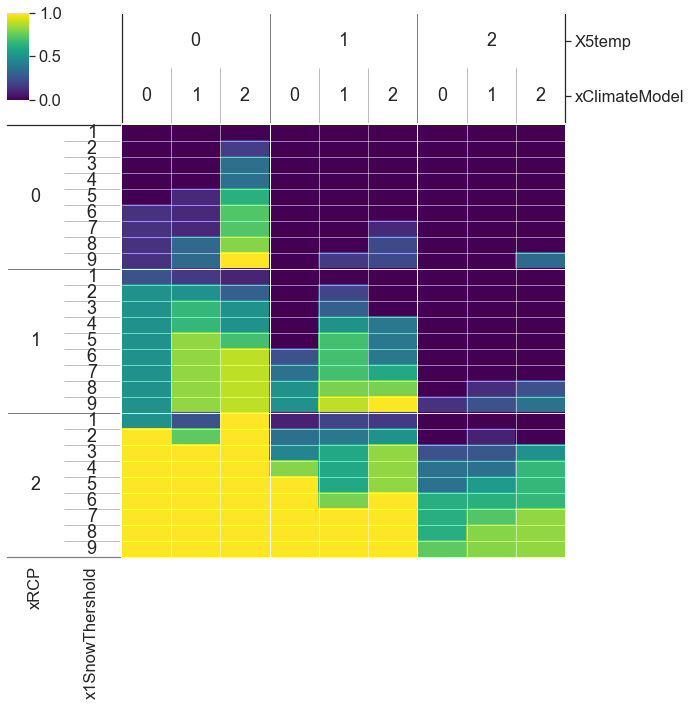

In [57]:
from ema_workbench.analysis import dimensional_stacking

x = experiments
y = outcomes['S_Ave_GoodDay'] < 70
dimensional_stacking.create_pivot_plot(x,y, 2, nbins=3)
plt.show()
#fig.savefig(os.path.join(rootVisualization, 'matrix_rel_gooddays.svg'), format='svg', dpi=600)

[MainProcess/INFO] model dropped from analysis because only a single category


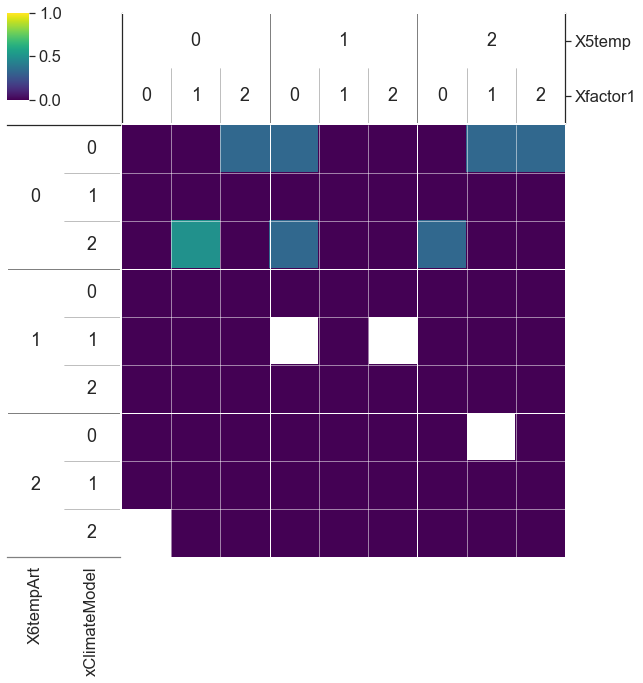

In [58]:
from ema_workbench.analysis import dimensional_stacking

x = experiments
y = outcomes['S_Ave_ArtSnow'] < 50
dimensional_stacking.create_pivot_plot(x,y, 2, nbins=3)
plt.show()
#fig.savefig(os.path.join(rootVisualization, 'matrix_rel_Artificial.svg'), format='svg', dpi=300)

[MainProcess/INFO] model dropped from analysis because only a single category


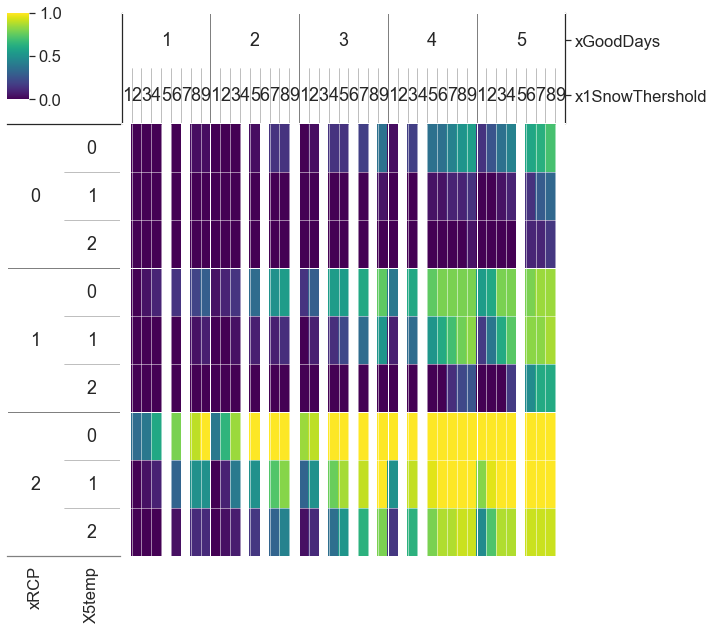

In [59]:
from ema_workbench.analysis import dimensional_stacking

x = experiments
y = outcomes['S_Ave_Likelihood'] < 0.6
dimensional_stacking.create_pivot_plot(x,y, 2, nbins=3)
plt.show()
#fig.savefig(os.path.join(rootVisualization, 'matrix_rel_Liklehood.svg'), format='svg', dpi=600)

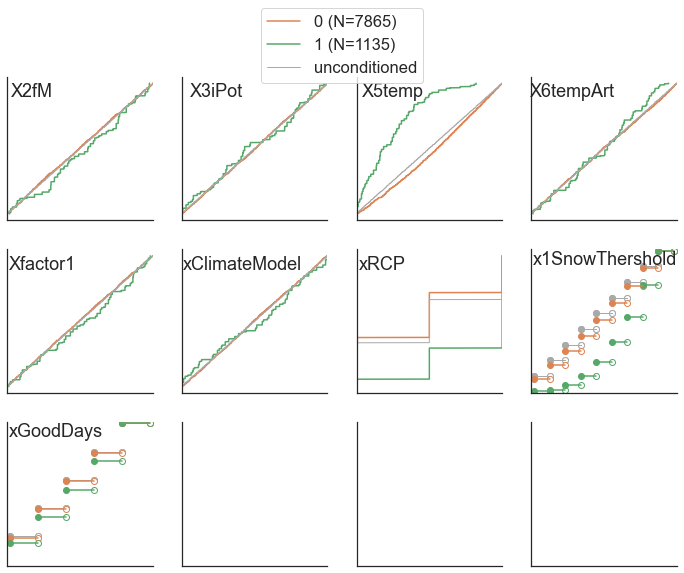

In [60]:
from ema_workbench.analysis import regional_sa
from numpy.lib import recfunctions as rf

sns.set_style('white')

# model is the same across experiments
x = experiments.copy()
x = x.drop('model', axis=1)
y = outcomes['S_Ave_GoodDay'] < 60
fig10 = regional_sa.plot_cdfs(x,y)
sns.despine()
plt.show()
fig10.savefig(os.path.join(rootVisualization, 'matrix_sensitivity_gooddays.svg'), format='svg', dpi=600)

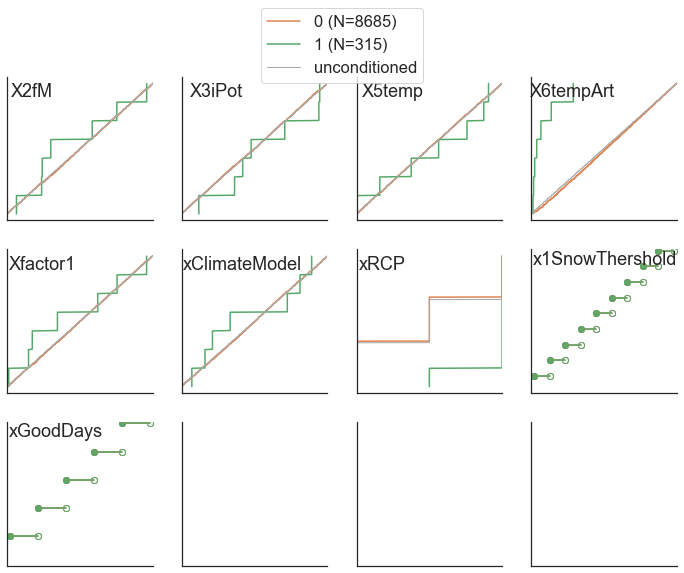

In [61]:
sns.set_style('white')

# model is the same across experiments
x = experiments.copy()
x = x.drop('model', axis=1)
y = outcomes['S_Ave_ArtSnow'] < 50
fig12 = regional_sa.plot_cdfs(x,y)
sns.despine()
plt.show()
fig12.savefig(os.path.join(rootVisualization, 'matrix_sensitivity_Artificial.svg'), format='svg', dpi=600)

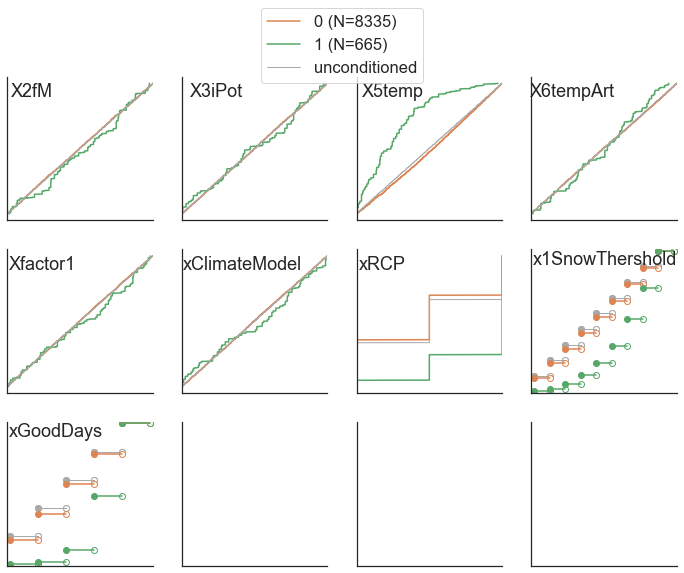

In [62]:
sns.set_style('white')

# model is the same across experiments
x = experiments.copy()
x = x.drop('model', axis=1)
y = outcomes['S_Ave_Likelihood'] < 0.5
fig11 = regional_sa.plot_cdfs(x,y)
sns.despine()
plt.show()
fig11.savefig(os.path.join(rootVisualization, 'matrix_sensitivity_Artificial.svg'), format='svg', dpi=600)

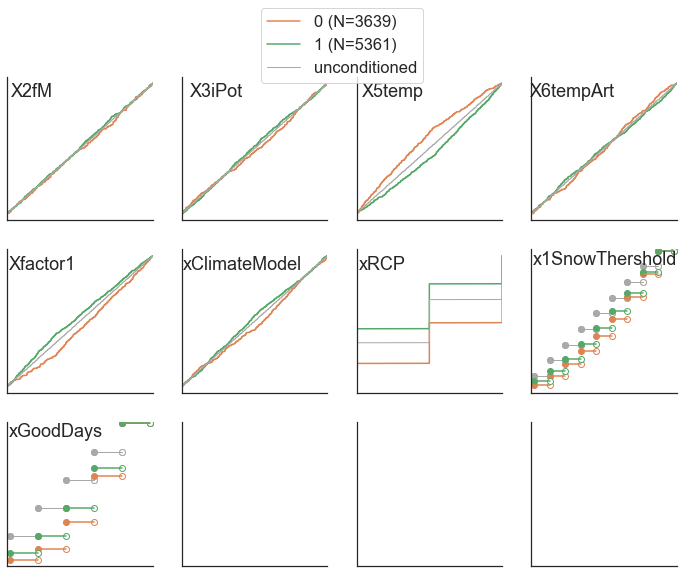

In [63]:
sns.set_style('white')

# model is the same across experiments
x = experiments.copy()
x = x.drop('model', axis=1)
y = outcomes['tipping_points'] < 15
fig11_2 = regional_sa.plot_cdfs(x,y)
sns.despine()
plt.show()
fig11_2.savefig(os.path.join(rootVisualization, 'matrix_sensitivity_tipping_points.svg'), format='svg', dpi=600)

### Scatter Plots (Inputs vs Outputs)

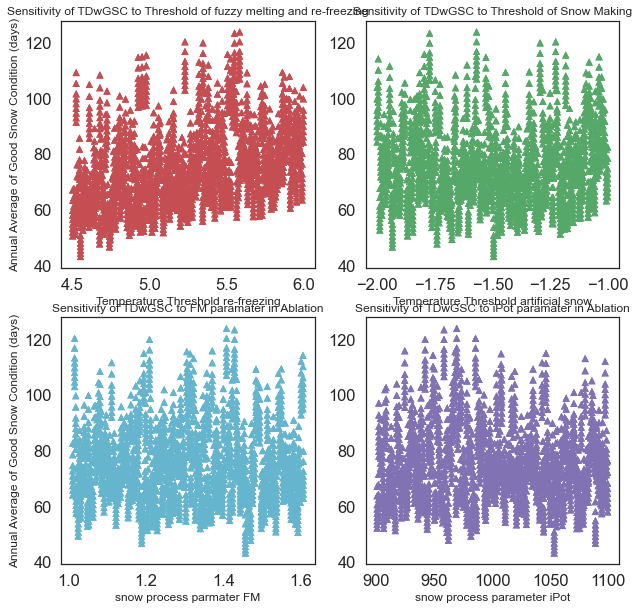

In [64]:
#fig, (ax1, ax2) = plt.subplots(1,2)
fig13, axs = plt.subplots(2, 2, figsize=(10,10))
#axs[0,0].scatter(xGoodDays, y, s = 200, c='b' , marker='o', alpha=0.7, cmap='viridis', 
 #          edgecolors='none', label='Good Days Condition')

#axs[0,1].scatter(x1SnowThershold, y, s = 200, c='orange' , marker='o', alpha=0.7, cmap='viridis', 
 #          edgecolors='none', label='Snow Threshold Condition')

axs[0,0].scatter(x5, YY, s = 50, c='r' , marker='^', alpha=0.7, cmap='viridis', 
           edgecolors='none', label='Temperature melt')

axs[0,1].scatter(x6, YY, s = 50, c='g' , marker='^', alpha=0.7, cmap='viridis', 
           edgecolors='none', label='Temperature artificial snow')

axs[1,0].scatter(x2, YY, s = 50, c='c' , marker='^', alpha=0.7, cmap='viridis', 
           edgecolors='none', label='Temperature melt')

axs[1,1].scatter(x3, YY, s = 50, c='m' , marker='^', alpha=0.7, cmap='viridis', 
           edgecolors='none', label='Temperature artificial snow')


# produce a legend with the unique colors from the scatter
#axs[0,0].set_xlabel("Good Days Condition")
#axs[0,1].set_xlabel("Snow Threshold Condition")
axs[0,0].set_xlabel("Temperature Threshold re-freezing", size = 12)
axs[0,1].set_xlabel("Temperature Threshold artificial snow", size = 12)
axs[1,0].set_xlabel("snow process parmater FM",size = 12)
axs[1,1].set_xlabel("snow process parameter iPot", size = 12)


axs[0,0].set_ylabel("Annual Average of Good Snow Condition (days)", size = 12)
#axs[0,1].set_ylabel("Frequency of Tipping points")
axs[1,0].set_ylabel("Annual Average of Good Snow Condition (days)", size = 12)
#axs[1,1].set_ylabel("Frequency of Tipping points")
#axs[2,0].set_ylabel("Annual Average of Good Snow Condition (days)")
#axs[2,1].set_ylabel("Frequency of Tipping points")

#axs[0,0].set_title('Sensitivity of TDwGSC to Policy-1 (less that 100 days)')
#axs[0,1].set_title('Sensitivity of TDwGSC to Policy-2 (300 mm)')
axs[0,0].set_title('Sensitivity of TDwGSC to Threshold of fuzzy melting and re-freezing', size = 12)
axs[0,1].set_title('Sensitivity of TDwGSC to Threshold of Snow Making', size = 12)
axs[1,0].set_title('Sensitivity of TDwGSC to FM paramater in Ablation', size = 12)
axs[1,1].set_title('Sensitivity of TDwGSC to iPot paramater in Ablation', size = 12)


#axs[0,0].text(0, 130, r'A', fontsize=15)
#axs[0,1].text(-1.9, 130, r'B', fontsize=15)
#axs[1,0].text(1.04, 130, r'C', fontsize=15)
#axs[1,1].text(920, 130, r'D', fontsize=15)

fig13.savefig(os.path.join(rootVisualization, 'SA4_All.svg'), format='svg', dpi=300)

plt.show()

## 3D Scatter Plot

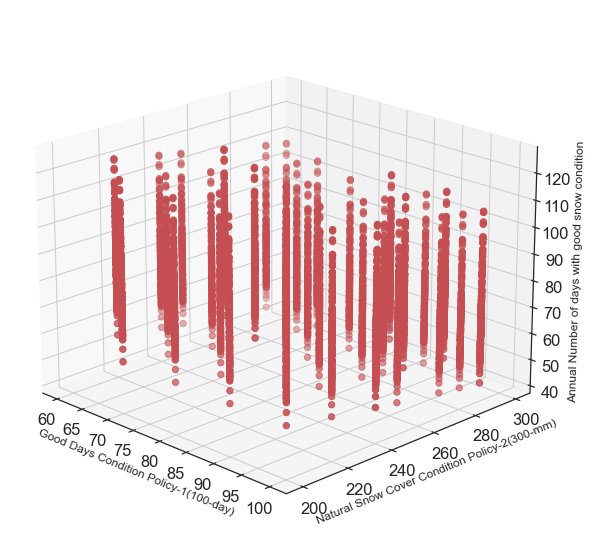

In [65]:
from mpl_toolkits.mplot3d import Axes3D 
fig14 = plt.figure(figsize=(15,10))
ax = fig14.add_subplot(111, projection='3d')

ax.scatter(xGoodDays, x1SnowThershold, YY, s = 40, c='r', marker='o')

ax.set_xlabel('Good Days Condition Policy-1(100-day)', size = 12)
ax.set_ylabel('Natural Snow Cover Condition Policy-2(300-mm)', size = 12)
ax.set_zlabel('Annual Number of days with good snow condition', size = 12)


#ax.scatter(100, 300, 40, color='green')


#x = np.linspace(75,100,5)
#y = np.linspace(220,300,16)
#X,Y = np.meshgrid(x,y)
#Z= X + Y -X - Y + 40 
#surf = ax.plot_surface(X, Y, Z, alpha = 0.2)
ax.view_init(20, -45)

fig14.savefig(os.path.join(rootVisualization, 'SA_Policy_All.svg'), format='svg', dpi=300)
plt.show()

In [66]:
df_final_ema.head()

,X2fM,X3iPot,X5temp,X6tempArt,Xfactor1,xClimateModel,xRCP,x1SnowThershold,xGoodDays,scenario,policy,model,Yout,Yout1,Yout3_0,Yout3_1,Yout3_2,Yout3_3,Yout3_4,Yout3_5,Yout3_6,Yout3_7,Yout3_8,Yout3_9,Yout3_10,Yout3_11,Yout3_12,Yout3_13,Yout3_14,Yout3_15,Yout3_16,Yout3_17,Yout3_18,Yout3_19,...,Yout3_88,Yout3_89,Yout3_90,Yout3_91,Yout3_92,Yout3_93,Yout3_94,Yout3_95,Yout3_96,Yout3_97,Yout3_98,Yout3_99,Yout3_100,Yout3_101,Yout3_102,Yout3_103,Yout3_104,Yout3_105,Yout3_106,Yout3_107,Yout3_108,Yout3_109,Yout3_110,Yout3_111,Yout3_112,Yout3_113,Yout3_114,Yout3_115,Yout3_116,Yout3_117,Yout4,Yout5,Yout6,Yout7
0,1.069688,944.174631,5.409598,-1.220357,2.046425,0.959141,1.0,240.0,60.0,0,0,UZHModel,88.134345,11,57.434333,98.105083,147.263750,88.431625,139.280875,78.900250,123.944958,102.506250,44.671958,53.047083,134.630500,81.866125,141.914292,123.204833,86.891750,100.385292,120.623542,107.361000,77.355667,82.295208,...,115.443208,19.062833,129.206583,119.479583,112.959417,115.727167,94.045750,88.010167,13.879708,43.663375,96.619333,93.945833,6.954417,27.096708,114.460125,58.401500,111.089000,140.821875,59.408000,51.823500,124.967875,41.968292,70.089500,85.322000,108.361708,22.498083,83.085583,34.392458,57.742333,10.125125,72.003814,3.701695,0.776240,1.0
1,1.048662,983.739422,4.512921,-1.986318,3.361615,0.211326,3.0,240.0,60.0,1,0,UZHModel,61.198419,43,78.550958,97.613708,122.971208,57.137708,74.836292,150.873958,132.584083,72.326042,138.117458,106.412708,124.644500,111.342833,90.388375,127.449708,70.326500,30.078000,79.711333,118.376542,13.510167,96.918583,...,23.231125,72.185375,53.231583,8.054542,30.094625,70.569958,7.963500,18.296875,8.496833,1.968500,6.923167,38.354125,90.889208,111.300917,13.629833,14.802833,7.367167,7.293875,1.380083,6.197917,5.599417,3.865125,13.609250,3.093583,6.952542,6.507833,40.683750,7.895375,2.792167,14.920292,48.583814,2.578729,0.580181,12.0
2,1.122691,977.980311,4.711553,-1.174757,1.680774,0.322348,3.0,240.0,60.0,2,0,UZHModel,61.890923,46,104.180500,141.586750,153.479583,118.076375,114.915750,127.912458,83.970667,120.416167,153.817125,85.539958,47.748583,139.200750,136.988958,113.893000,109.595125,113.575958,44.670417,96.680792,14.943833,106.423708,...,82.342375,7.589833,46.123167,13.341333,16.173417,94.929583,106.564000,40.105708,4.486000,20.778042,10.246000,21.607125,9.551042,11.700208,16.287500,19.150167,8.486833,2.379292,11.215708,13.975708,9.906958,12.542958,9.633917,70.664500,1.453542,62.113042,7.688625,25.000583,10.400375,27.373542,60.386441,2.598475,0.589929,10.0
3,1.118246,1015.935396,4.807165,-1.693693,2.782654,0.650482,1.0,240.0,60.0,3,0,UZHModel,77.649580,7,59.228917,69.783833,124.771833,103.280292,147.664708,80.608125,121.137250,96.231000,161.853500,117.570708,85.716875,143.184625,141.150250,132.248458,62.749167,10.653708,36.316500,72.778333,86.013250,92.165083,...,68.092792,71.112750,56.904042,31.805458,123.288500,51.120958,37.663833,75.486792,112.384542,35.671625,125.761667,65.891833,43.366750,28.231625,72.522250,124.046417,15.828250,47.366958,27.438167,97.643458,94.554750,29.858625,61.776333,41.983625,92.728000,116.680875,79.679833,17.347875,80.103750,86.784708,66.117458,3.288729,0.742036,2.0
4,1.530131,1059.660563,4.837406,-1.559564,1.989237,0.352432,1.0,240.0,60.0,4,0,UZHModel,83.897664,4,51.208042,96.762500,115.500250,102.415833,90.903833,132.664542,95.433833,130.009625,147.368542,74.296208,149.474250,86.705958,116.019750,106.630375,44.038333,133.483875,97.411542,70.429458,78.328250,47.630208,...,118.924333,153.385000,42.531583,14.296583,113.391250,90.284875,89.767083,129.673208,15.011292,16.186250,65.684750,74.057292,55.427250,73.587792,72.404750,95.237750,29.681958,103.879458,52.049417,104.391583,38.795958,82.250667,89.591000,116.284667,96.461333,126.817167,49.307000,106.941375,87.530375,111.079250,71.695000,3.543220,0.761890,0.0


# Taking the values
x2 = df_final_ema['X2fM'].values
x3 = df_final_ema['X3iPot'].values
x5 = df_final_ema['X5temp'].values
x6 = df_final_ema['X6tempArt'].values
xRCP = df_final_ema['xRCP'].values
xClimateModel = df_final_ema['xClimateModel'].values
x1SnowThershold = df_final_ema['x1SnowThershold'].values
xGoodDays = df_final_ema['xGoodDays'].values

YY = df_final_ema['Yout'].values
y1 = df_final_ema['Yout1'].values
y3 = df_final_ema['Yout3_95'].values
y4 = df_final_ema['Yout4'].values
y5 = df_final_ema['Yout5'].values
y6 = df_final_ema['Yout6'].values
y7 = df_final_ema['Yout7'].values

In [67]:
df_final_ema.tail()

,X2fM,X3iPot,X5temp,X6tempArt,Xfactor1,xClimateModel,xRCP,x1SnowThershold,xGoodDays,scenario,policy,model,Yout,Yout1,Yout3_0,Yout3_1,Yout3_2,Yout3_3,Yout3_4,Yout3_5,Yout3_6,Yout3_7,Yout3_8,Yout3_9,Yout3_10,Yout3_11,Yout3_12,Yout3_13,Yout3_14,Yout3_15,Yout3_16,Yout3_17,Yout3_18,Yout3_19,...,Yout3_88,Yout3_89,Yout3_90,Yout3_91,Yout3_92,Yout3_93,Yout3_94,Yout3_95,Yout3_96,Yout3_97,Yout3_98,Yout3_99,Yout3_100,Yout3_101,Yout3_102,Yout3_103,Yout3_104,Yout3_105,Yout3_106,Yout3_107,Yout3_108,Yout3_109,Yout3_110,Yout3_111,Yout3_112,Yout3_113,Yout3_114,Yout3_115,Yout3_116,Yout3_117,Yout4,Yout5,Yout6,Yout7
8995,1.565434,1073.303703,4.769804,-1.702256,3.462093,0.679762,1.0,250.0,80.0,195,44,UZHModel,70.967577,7,48.31096,60.66444,121.75632,89.94840,139.48124,72.29744,118.09892,79.76944,161.04612,115.66540,81.83988,138.11892,130.59060,120.05788,55.06212,9.18420,33.13700,66.89120,79.36848,89.46648,...,49.31352,67.22596,52.29424,17.91228,121.51832,48.03552,30.28372,67.89244,108.31936,29.97176,119.01168,54.87428,37.30692,23.90544,65.25096,123.17564,13.45060,42.75280,25.64484,77.92916,93.04036,26.96536,55.89096,32.40916,91.36668,114.98404,77.59836,15.01684,77.38508,85.90944,66.013220,2.933898,0.634447,16.0
8996,1.449928,912.800210,5.792074,-1.451177,1.739357,0.774396,1.0,250.0,80.0,196,44,UZHModel,78.531101,9,123.37424,140.05732,20.10924,56.48752,68.22056,105.03660,73.58812,145.72532,114.44004,87.36552,88.91708,98.83896,138.99868,132.19800,73.78920,77.54592,73.08880,94.73348,27.15960,103.34184,...,70.25740,53.22028,63.01936,31.25664,23.38492,103.98776,97.54396,128.97668,71.78916,80.26040,89.67780,65.55468,82.56148,36.10520,80.43500,60.54292,58.60140,26.36804,26.37372,56.54376,82.07624,70.46260,58.45928,77.20072,127.09928,47.43732,105.32956,71.37032,70.21768,58.94368,68.026356,3.254153,0.693626,9.0
8997,1.263105,950.254332,4.592112,-1.374790,3.329606,0.364034,2.0,250.0,80.0,197,44,UZHModel,62.930669,20,13.17396,109.49148,135.95304,83.52324,107.64720,60.30052,120.91000,67.89124,121.03652,31.61040,121.79708,22.80400,135.10788,63.18068,89.92192,85.04936,70.14324,62.74124,72.27616,15.84688,...,38.19424,127.27992,41.12316,107.45584,51.19528,96.24440,52.37920,66.73352,71.45400,54.99188,11.63432,21.74936,30.71976,20.83272,9.99944,47.69608,80.39716,95.93916,14.52384,12.85392,5.35268,58.71592,34.89232,8.96452,47.65592,70.66468,37.68576,33.59164,16.03776,25.62520,63.715254,2.597881,0.575774,15.0
8998,1.085210,1048.701880,5.301791,-1.001124,2.399629,0.173370,2.0,250.0,80.0,198,44,UZHModel,72.837569,15,106.59056,106.63936,122.26256,101.97448,143.97144,89.85708,144.10768,131.71608,133.33208,124.27404,66.53420,157.50500,90.27008,48.58888,100.61960,65.11472,122.54644,104.45876,73.24584,31.39412,...,58.01208,73.15460,98.99216,94.90020,62.37592,42.18432,69.26388,85.33692,124.35296,92.96280,49.07884,6.92220,52.47308,38.66964,15.17828,77.01252,20.81476,22.92076,32.57524,107.05988,97.75180,76.42868,61.62456,15.08496,55.16924,47.13568,44.09384,8.96620,58.84396,18.08916,67.451695,3.006695,0.647573,16.0
8999,1.279984,940.416854,4.798297,-1.175576,2.965018,0.345189,1.0,250.0,80.0,199,44,UZHModel,80.720734,4,25.72912,142.01948,160.51624,65.61340,98.52036,89.79008,128.30348,51.55564,85.80840,58.17856,60.05720,115.84084,105.61880,72.26448,129.01972,105.30856,136.50188,92.19180,70.73364,95.79216,...,59.50840,66.87760,58.43504,113.01608,23.55552,58.54012,96.77260,56.34032,94.09096,81.92548,21.44808,102.53996,72.34708,55.79868,70.63696,25.73880,13.80880,72.46576,7.15716,54.48968,36.87052,55.54180,62.39372,62.70404,63.27624,35.07776,116.20284,78.52724,59.57384,103.79116,74.632203,3.320678,0.700374,9.0


In [68]:
filt_S = (df_final_ema['scenario'] == 1)
x_policy = df_final_ema.loc[filt_S, 'x1SnowThershold']
y_policy = df_final_ema.loc[filt_S, 'xGoodDays']
scenarios = df_final_ema.loc[filt_S, 'policy']

In [69]:
x_policy[1]

240.0

In [70]:
df_final_ema[filt_S]

,X2fM,X3iPot,X5temp,X6tempArt,Xfactor1,xClimateModel,xRCP,x1SnowThershold,xGoodDays,scenario,policy,model,Yout,Yout1,Yout3_0,Yout3_1,Yout3_2,Yout3_3,Yout3_4,Yout3_5,Yout3_6,Yout3_7,Yout3_8,Yout3_9,Yout3_10,Yout3_11,Yout3_12,Yout3_13,Yout3_14,Yout3_15,Yout3_16,Yout3_17,Yout3_18,Yout3_19,...,Yout3_88,Yout3_89,Yout3_90,Yout3_91,Yout3_92,Yout3_93,Yout3_94,Yout3_95,Yout3_96,Yout3_97,Yout3_98,Yout3_99,Yout3_100,Yout3_101,Yout3_102,Yout3_103,Yout3_104,Yout3_105,Yout3_106,Yout3_107,Yout3_108,Yout3_109,Yout3_110,Yout3_111,Yout3_112,Yout3_113,Yout3_114,Yout3_115,Yout3_116,Yout3_117,Yout4,Yout5,Yout6,Yout7
1,1.048662,983.739422,4.512921,-1.986318,3.361615,0.211326,3.0,240.0,60.0,1,0,UZHModel,61.198419,43,78.550958,97.613708,122.971208,57.137708,74.836292,150.873958,132.584083,72.326042,138.117458,106.412708,124.644500,111.342833,90.388375,127.449708,70.326500,30.078000,79.711333,118.376542,13.510167,96.918583,...,23.231125,72.185375,53.231583,8.054542,30.094625,70.569958,7.963500,18.296875,8.496833,1.968500,6.923167,38.354125,90.889208,111.300917,13.629833,14.802833,7.367167,7.293875,1.380083,6.197917,5.599417,3.865125,13.609250,3.093583,6.952542,6.507833,40.683750,7.895375,2.792167,14.920292,48.583814,2.578729,0.580181,12.0
201,1.048662,983.739422,4.512921,-1.986318,3.361615,0.211326,3.0,250.0,60.0,1,1,UZHModel,59.673561,43,75.408920,95.426080,121.712440,54.852200,71.842840,149.121480,132.061720,69.573960,135.091680,102.700680,123.768200,110.089120,86.953880,125.548720,67.968120,28.874880,78.256640,116.527000,12.969760,94.316680,...,22.301880,69.701640,51.205400,7.732360,28.890840,69.072840,7.644960,17.565000,8.156960,1.889760,6.646240,36.819960,90.451640,109.525640,13.084640,14.210720,7.072480,7.002120,1.324880,5.950000,5.375440,3.710520,13.064880,2.969840,6.674440,6.247520,39.056400,7.579560,2.680480,14.323480,48.583814,2.456441,0.574249,12.0
401,1.048662,983.739422,4.512921,-1.986318,3.361615,0.211326,3.0,260.0,90.0,1,2,UZHModel,58.184003,43,72.508577,93.277077,120.438462,52.742500,69.079654,147.440000,131.455885,67.013423,132.269269,99.199192,122.789885,108.892654,83.662731,123.557346,65.567654,27.764308,76.692692,113.959808,12.470923,91.755385,...,21.444115,67.335808,49.248885,7.434962,27.779654,67.392654,7.350923,16.889423,7.843231,1.817077,6.390615,35.403808,89.824500,107.722654,12.581385,13.664154,6.800462,6.732808,1.273923,5.721154,5.168692,3.567808,12.562385,2.855615,6.417731,6.007231,37.554231,7.288038,2.577385,13.772577,48.583814,2.337627,0.494353,19.0
601,1.048662,983.739422,4.512921,-1.986318,3.361615,0.211326,3.0,250.0,80.0,1,3,UZHModel,59.673561,43,75.408920,95.426080,121.712440,54.852200,71.842840,149.121480,132.061720,69.573960,135.091680,102.700680,123.768200,110.089120,86.953880,125.548720,67.968120,28.874880,78.256640,116.527000,12.969760,94.316680,...,22.301880,69.701640,51.205400,7.732360,28.890840,69.072840,7.644960,17.565000,8.156960,1.889760,6.646240,36.819960,90.451640,109.525640,13.084640,14.210720,7.072480,7.002120,1.324880,5.950000,5.375440,3.710520,13.064880,2.969840,6.674440,6.247520,39.056400,7.579560,2.680480,14.323480,48.583814,2.456441,0.526515,16.0
801,1.048662,983.739422,4.512921,-1.986318,3.361615,0.211326,3.0,280.0,90.0,1,4,UZHModel,55.327725,43,67.329393,88.027179,117.990857,48.975179,64.145393,144.298107,130.231500,62.358036,127.087214,92.397607,120.558250,106.575679,77.704536,119.593179,60.923607,25.781143,73.502036,109.136321,11.580143,86.742964,...,19.912393,62.747179,45.731107,6.903893,25.795393,64.125750,6.825857,15.683036,7.283000,1.687286,5.934143,32.874964,88.296179,104.076750,11.682714,12.688143,6.314714,6.251893,1.182929,5.312500,4.799500,3.312964,11.665071,2.651643,5.959321,5.578143,34.871786,6.767464,2.393286,12.788821,48.583814,2.093559,0.478083,20.0
1001,1.048662,983.739422,4.512921,-1.986318,3.361615,0.211326,3.0,290.0,90.0,1,5,UZHModel,53.954053,43,65.007690,85.024655,116.853241,47.286379,61.933483,142.796034,129.597517,60.225000,124.706517,89.211483,119.461103,105.417897,75.0250

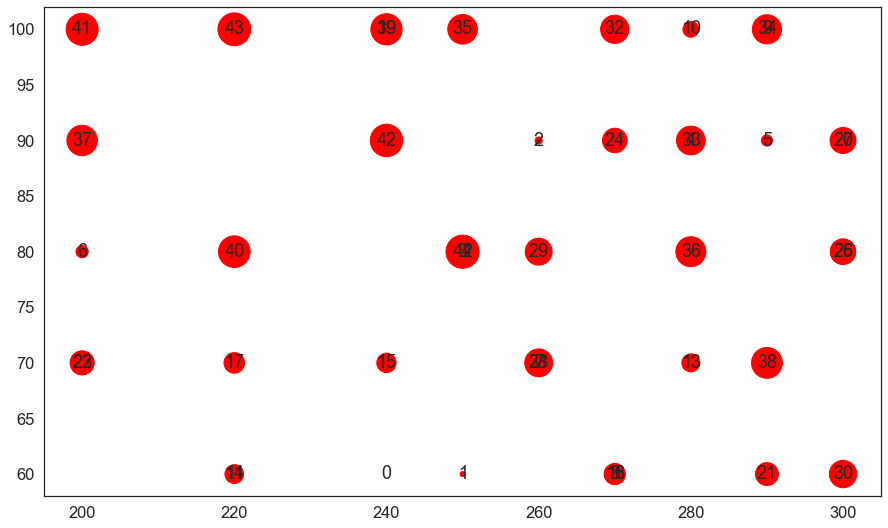

In [71]:
#x_policy = x1SnowThershold 
#y_policy = xGoodDays 

#ranking = np.random.normal(size=9000)
#scenarios = df_final_ema['policy'].values


fig, ax_n = plt.subplots(figsize=(15,9))


x_policy = df_final_ema.loc[filt_S, 'x1SnowThershold']
y_policy = df_final_ema.loc[filt_S, 'xGoodDays']
scenarios = df_final_ema.loc[filt_S, 'policy']
#colors = np.random.rand(N)


# Because the price is much too small when being provided as size for ``s``,
# we normalize it to some useful point sizes, s=0.3*(price*3)**2
ax_n.scatter(x_policy, y_policy, s = scenarios * 25, c = 'red' , cmap="Spectral")

for x_pos, y_pos, label in zip(x_policy, y_policy, scenarios):
    ax_n.annotate(label,
                xy=(x_pos, y_pos),
                xytext=(0, 0),
                textcoords='offset points',
                ha='center',
                va='center')

plt.show()

### Defining the Q0.9 and Q0.1 databases

In [72]:
print(q10_years[0])
print(q25_years[0])
print(q50_years[0])
print(q75_years[0])
print(q90_years[0])
print(q50_years.shape)

#2020/08/23
print(q10_years_fin[0])
print(q25_years_fin[0])
print(q50_years_fin[0])
print(q75_years_fin[0])
print(q90_years_fin[0])
print(q50_years_fin.shape)

print(q10_years_Art[0])
print(q25_years_Art[0])
print(q50_years_Art[0])
print(q75_years_Art[0])
print(q90_years_Art[0])
print(q50_years_Art.shape)

print(q10_years_Like[0])
print(q25_years_Like[0])
print(q50_years_Like[0])
print(q75_years_Like[0])
print(q90_years_Like[0])
print(q50_years_Like.shape)

[43.66849876]
[57.87747759]
[77.70418452]
[101.84957692]
[121.860005]
(118, 1)
[1.619]
[2.2975]
[3.22]
[4.33]
[5.221]
(118, 1)
[50.796]
[55.72]
[64.545]
[74.9875]
[83.747]
(118, 1)
[51.66366667]
[71.68548276]
[98.32013393]
[100.]
[100.]
(118, 1)


In [73]:
print("#########")
print(matrix_GoodDays26.shape)
print(matrix_GoodDays45.shape)
print(matrix_GoodDays85.shape)
print(len(matrix_GoodDays26) + len(matrix_GoodDays45) + len(matrix_GoodDays85))
print("#########")
print(matrix_fin26.shape)
print(matrix_fin45.shape)
print(matrix_fin85.shape)
print(len(matrix_fin26) + len(matrix_fin45) + len(matrix_fin85))
print("#########")
print(matrix_Art26.shape)
print(matrix_Art45.shape)
print(matrix_Art85.shape)
print(len(matrix_Art26) + len(matrix_Art45) + len(matrix_Art85))
print("#########")
print(matrix_Like26.shape)
print(matrix_Like45.shape)
print(matrix_Like85.shape)
print(len(matrix_Like26) + len(matrix_Like45) + len(matrix_Like85))

#########
(3015, 119, 2)
(2970, 119, 2)
(3015, 119, 2)
9000
#########
(3015, 119, 2)
(2970, 119, 2)
(3015, 119, 2)
9000
#########
(3015, 119, 2)
(2970, 119, 2)
(3015, 119, 2)
9000
#########
(3015, 119, 2)
(2970, 119, 2)
(3015, 119, 2)
9000


In [74]:
print(matrix_GoodDays[:, :, 1:2].shape)
print(matrix_GoodDays[3, 0, 1:2])
print(matrix_GoodDays[4].shape)

(9000, 119, 1)
['isOverSnow_sc_Ver2_26_7']
(119, 2)


## Analysis for different RCP2.6, RCP4.5, and RCP8.5
### Calculate quantiles for each RCP scenarios

In [75]:
q10_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_26 = np.quantile(matrix_GoodDays26[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_45 = np.quantile(matrix_GoodDays45[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_85 = np.quantile(matrix_GoodDays85[:, 1:, 1:2].astype(float), 0.9, axis=0)



#2020/08/13
q10_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_fin_26 = np.quantile(matrix_fin26[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_fin_45 = np.quantile(matrix_fin45[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_fin_85 = np.quantile(matrix_fin85[:, 1:, 1:2].astype(float), 0.9, axis=0)


q10_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Art_26 = np.quantile(matrix_Art26[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Art_45 = np.quantile(matrix_Art45[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Art_85 = np.quantile(matrix_Art85[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Like_26 = np.quantile(matrix_Like26[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Like_45 = np.quantile(matrix_Like45[:, 1:, 1:2].astype(float), 0.9, axis=0)

q10_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.1, axis=0)
q25_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.25, axis=0)
q50_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.5, axis=0)
q75_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.75, axis=0)
q90_years_Like_85 = np.quantile(matrix_Like85[:, 1:, 1:2].astype(float), 0.9, axis=0)


#### Make dataframes from quantiles

In [76]:
dfq50_26 = pd.DataFrame(q50_years_26)
dfq50_26.columns = ['median26']
dfq50_45 = pd.DataFrame(q50_years_45)
dfq50_45.columns = ['median45']
dfq50_85 = pd.DataFrame(q50_years_85)
dfq50_85.columns = ['median85']

dfq90_26 = pd.DataFrame(q90_years_26)
dfq90_26.columns = ['Q90_26']
dfq90_45 = pd.DataFrame(q90_years_45)
dfq90_45.columns = ['Q90_45']
dfq90_85 = pd.DataFrame(q90_years_85)
dfq90_85.columns = ['Q90_85']

dfq10_26 = pd.DataFrame(q10_years_26)
dfq10_26.columns = ['Q10_26']
dfq10_45 = pd.DataFrame(q10_years_45)
dfq10_45.columns = ['Q10_45']
dfq10_85 = pd.DataFrame(q10_years_85)
dfq10_85.columns = ['Q10_85']

### 2020/08/13
dfq50_fin_26 = pd.DataFrame(q50_years_fin_26)
dfq50_fin_26.columns = ['median26']
dfq50_fin_45 = pd.DataFrame(q50_years_fin_45)
dfq50_fin_45.columns = ['median45']
dfq50_fin_85 = pd.DataFrame(q50_years_fin_85)
dfq50_fin_85.columns = ['median85']

dfq90_fin_26 = pd.DataFrame(q90_years_fin_26)
dfq90_fin_26.columns = ['median26']
dfq90_fin_45 = pd.DataFrame(q90_years_fin_45)
dfq90_fin_45.columns = ['median45']
dfq90_fin_85 = pd.DataFrame(q90_years_fin_85)
dfq90_fin_85.columns = ['median85']

dfq10_fin_26 = pd.DataFrame(q10_years_fin_26)
dfq10_fin_26.columns = ['median26']
dfq10_fin_45 = pd.DataFrame(q10_years_fin_45)
dfq10_fin_45.columns = ['median45']
dfq10_fin_85 = pd.DataFrame(q10_years_fin_85)
dfq10_fin_85.columns = ['median85']

dfq50_Art_26 = pd.DataFrame(q50_years_Art_26)
dfq50_Art_26.columns = ['median26']
dfq50_Art_45 = pd.DataFrame(q50_years_Art_45)
dfq50_Art_45.columns = ['median45']
dfq50_Art_85 = pd.DataFrame(q50_years_Art_85)
dfq50_Art_85.columns = ['median85']

dfq90_Art_26 = pd.DataFrame(q90_years_Art_26)
dfq90_Art_26.columns = ['median26']
dfq90_Art_45 = pd.DataFrame(q90_years_Art_45)
dfq90_Art_45.columns = ['median45']
dfq90_Art_85 = pd.DataFrame(q90_years_Art_85)
dfq90_Art_85.columns = ['median85']

dfq10_Art_26 = pd.DataFrame(q10_years_Art_26)
dfq10_Art_26.columns = ['median26']
dfq10_Art_45 = pd.DataFrame(q10_years_Art_45)
dfq10_Art_45.columns = ['median45']
dfq10_Art_85 = pd.DataFrame(q10_years_Art_85)
dfq10_Art_85.columns = ['median85']

dfq50_Like_26 = pd.DataFrame(q50_years_Like_26)
dfq50_Like_26.columns = ['median26']
dfq50_Like_45 = pd.DataFrame(q50_years_Like_45)
dfq50_Like_45.columns = ['median45']
dfq50_Like_85 = pd.DataFrame(q50_years_Like_85)
dfq50_Like_85.columns = ['median85']

dfq90_Like_26 = pd.DataFrame(q90_years_Like_26)
dfq90_Like_26.columns = ['median26']
dfq90_Like_45 = pd.DataFrame(q90_years_Like_45)
dfq90_Like_45.columns = ['median45']
dfq90_Like_85 = pd.DataFrame(q90_years_Like_85)
dfq90_Like_85.columns = ['median85']

dfq10_Like_26 = pd.DataFrame(q10_years_Like_26)
dfq10_Like_26.columns = ['median26']
dfq10_Like_45 = pd.DataFrame(q10_years_Like_45)
dfq10_Like_45.columns = ['median45']
dfq10_Like_85 = pd.DataFrame(q10_years_Like_85)
dfq10_Like_85.columns = ['median85']

In [77]:
dfq50_26.head()

,median26
0,75.433036
1,98.720815
2,116.880080
3,87.832727
4,118.208682


In [78]:
dfAllAverages = pd.concat((dfq50_26, dfq50_45, dfq50_85), axis=1)
dfAllAverages_Q90 = pd.concat((dfq90_26, dfq90_45, dfq90_85), axis=1)
dfAllAverages_Q10 = pd.concat((dfq10_26, dfq10_45, dfq10_85), axis=1)

dfAllAverages_fin = pd.concat((dfq50_fin_26, dfq50_fin_45, dfq50_fin_85), axis=1)
dfAllAverages_Q90_fin = pd.concat((dfq90_fin_26, dfq90_fin_45, dfq90_fin_85), axis=1)
dfAllAverages_Q10_fin = pd.concat((dfq10_fin_26, dfq10_fin_45, dfq10_fin_85), axis=1)

dfAllAverages_Art = pd.concat((dfq50_Art_26, dfq50_Art_45, dfq50_Art_85), axis=1)
dfAllAverages_Q90_Art = pd.concat((dfq90_Art_26, dfq90_Art_45, dfq90_Art_85), axis=1)
dfAllAverages_Q10_Art = pd.concat((dfq10_Art_26, dfq10_Art_45, dfq10_Art_85), axis=1)

dfAllAverages_Like = pd.concat((dfq50_Like_26, dfq50_Like_45, dfq50_Like_85), axis=1)
dfAllAverages_Q90_Like = pd.concat((dfq90_Like_26, dfq90_Like_45, dfq90_Like_85), axis=1)
dfAllAverages_Q10_Like = pd.concat((dfq10_Like_26, dfq10_Like_45, dfq10_Like_85), axis=1)

In [79]:
dfAllAverages.head()

,median26,median45,median85
0,75.433036,80.856987,76.913600
1,98.720815,105.726713,111.722760
2,116.880080,119.373614,123.183773
3,87.832727,87.331350,100.535792
4,118.208682,117.955593,117.642111


In [80]:
print('*** All RCPs***')
print(q10_years[0])
print(q25_years[0])
print(q50_years[0])
print(q75_years[0])
print(q90_years[0])
print(q50_years.shape)
print('*** RCP2.6***')
print(q10_years_26[0])
print(q25_years_26[0])
print(q50_years_26[0])
print(q75_years_26[0])
print(q90_years_26[0])
print(q50_years_26.shape)
print('*** RCP4.5***')
print(q10_years_45[0])
print(q25_years_45[0])
print(q50_years_45[0])
print(q75_years_45[0])
print(q90_years_45[0])
print(q50_years_45.shape)
print('*** RCP8.5***')
print(q10_years_85[0])
print(q25_years_85[0])
print(q50_years_85[0])
print(q75_years_85[0])
print(q90_years_85[0])
print(q50_years_85.shape)

*** All RCPs***
[43.66849876]
[57.87747759]
[77.70418452]
[101.84957692]
[121.860005]
(118, 1)
*** RCP2.6***
[44.73237037]
[56.58636667]
[75.43303571]
[103.7036]
[125.42504167]
(118, 1)
*** RCP4.5***
[45.10314286]
[59.10711538]
[80.85698704]
[106.25721429]
[120.55954545]
(118, 1)
*** RCP8.5***
[40.56842308]
[58.41012]
[76.9136]
[98.537375]
[116.02425]
(118, 1)


In [81]:
print('*** All RCPs***')
print(q10_years_fin[0])
print(q25_years_fin[0])
print(q50_years_fin[0])
print(q75_years_fin[0])
print(q90_years_fin[0])
print(q50_years_fin.shape)
print('*** RCP2.6***')
print(q10_years_fin_26[0])
print(q25_years_fin_26[0])
print(q50_years_fin_26[0])
print(q75_years_fin_26[0])
print(q90_years_fin_26[0])
print(q50_years_fin_26.shape)
print('*** RCP4.5***')
print(q10_years_fin_45[0])
print(q25_years_fin_45[0])
print(q50_years_fin_45[0])
print(q75_years_fin_45[0])
print(q90_years_fin_45[0])
print(q50_years_fin_45.shape)
print('*** RCP8.5***')
print(q10_years_fin_85[0])
print(q25_years_fin_85[0])
print(q50_years_fin_85[0])
print(q75_years_fin_85[0])
print(q90_years_fin_85[0])
print(q50_years_fin_85.shape)

*** All RCPs***
[1.619]
[2.2975]
[3.22]
[4.33]
[5.221]
(118, 1)
*** RCP2.6***
[1.66]
[2.27]
[3.15]
[4.4]
[5.23]
(118, 1)
*** RCP4.5***
[1.67]
[2.34]
[3.385]
[4.45]
[5.31]
(118, 1)
*** RCP8.5***
[1.53]
[2.3]
[3.19]
[4.14]
[5.1]
(118, 1)


#### Set the parameters of making figure

In [82]:
p_Step = 20
alpha_Fade = 0.11

### RCP 2.6 Number of days with Good Snow Condition over the time

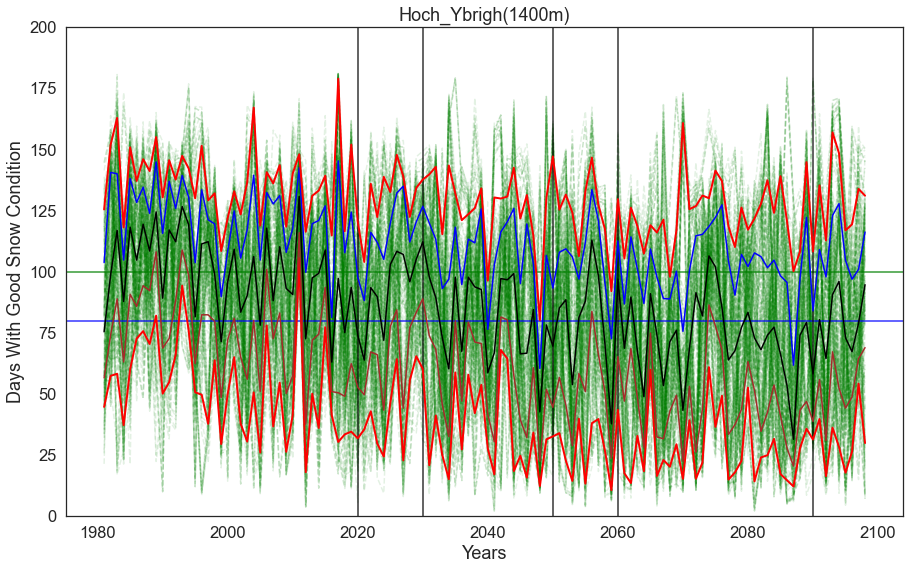

In [83]:
fig15, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)

for i in range(0, len(matrix_GoodDays26), p_Step):
    a = matrix_GoodDays26[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)

axs.axhline(y=100, color='green', alpha=0.8)
axs.axhline(y=80, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_26, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_26, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_26, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_26, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_26, color='red', linewidth = 2, alpha=1)

axs.set_ylim(bottom=0, top =200)
axs.set_title('Hoch_Ybrigh(1400m)')
axs.set_xlabel('Years')
axs.set_ylabel('Days With Good Snow Condition')

fig15.savefig(os.path.join(rootVisualization, 'RCP26.svg'), format='svg', dpi=300)
plt.show()

### RCP 4.5 Number of days with Good Snow Condition over the time

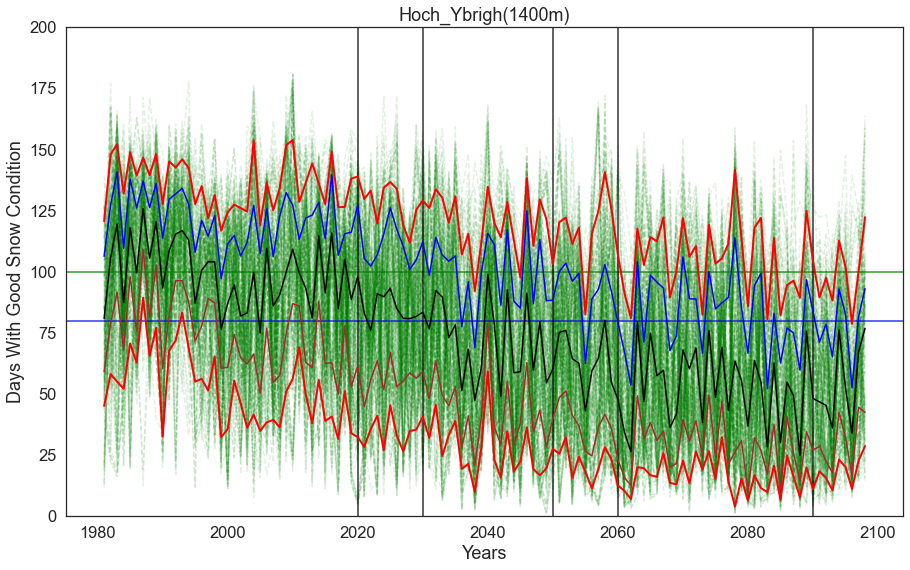

In [84]:
fig16, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)

for i in range(0, len(matrix_GoodDays45), p_Step):
    a = matrix_GoodDays45[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)

axs.axhline(y=100, color='green', alpha=0.8)
axs.axhline(y=80, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_45, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_45, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_45, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_45, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_45, color='red', linewidth = 2, alpha=1)

axs.set_ylim(bottom=0, top =200)
axs.set_title('Hoch_Ybrigh(1400m)')
axs.set_xlabel('Years')
axs.set_ylabel('Days With Good Snow Condition')

fig16.savefig(os.path.join(rootVisualization, 'RCP45.svg'), format='svg', dpi=300)

plt.show()

### RCP 8.5 Number of days with Good Snow Condition over the time

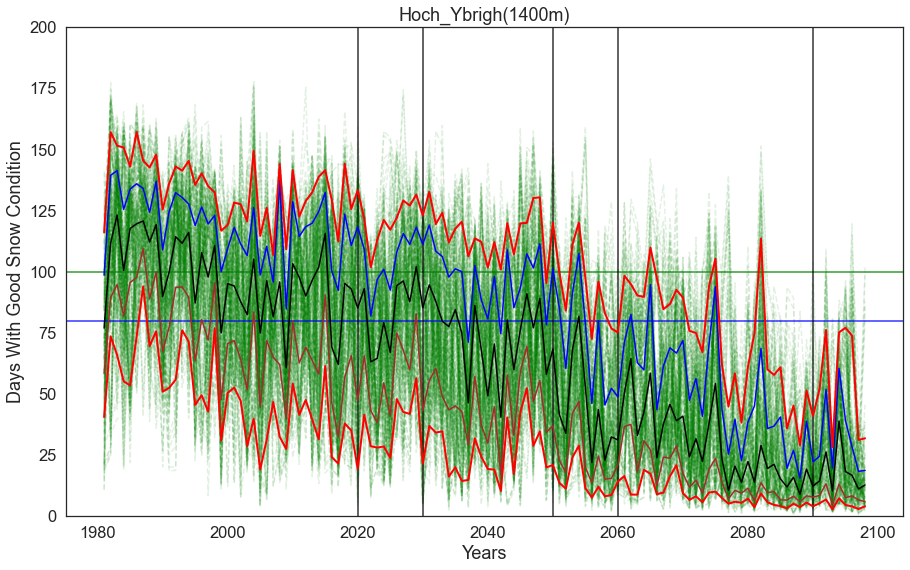

In [85]:
fig17, axs = plt.subplots(figsize=(15,9))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, len(matrix_GoodDays85), p_Step):
    a = matrix_GoodDays85[i, 1:, 1:2].astype(float)
    plt.plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)

axs.axhline(y=100, color='green', alpha=0.8)
axs.axhline(y=80, color='blue', alpha=0.8)

axs.axvline(x=2020, color='black', alpha=0.8)
axs.axvline(x=2030, color='black', alpha=0.8)
axs.axvline(x=2050, color='black', alpha=0.8)
axs.axvline(x=2060, color='black', alpha=0.8)
axs.axvline(x=2090, color='black', alpha=0.8)

plt.plot(x_axis, q10_years_85, color='red', linewidth = 2, alpha=1)
plt.plot(x_axis, q25_years_85, color='brown',linewidth = 1.5, alpha=1)
plt.plot(x_axis, q50_years_85, color='black', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q75_years_85, color='blue', linewidth = 1.5, alpha=1)
plt.plot(x_axis, q90_years_85, color='red', linewidth = 2, alpha=1)

axs.set_ylim(bottom=0, top =200)
axs.set_title('Hoch_Ybrigh(1400m)')
axs.set_xlabel('Years')
axs.set_ylabel('Days With Good Snow Condition')

fig17.savefig(os.path.join(rootVisualization, 'RCP45.svg'), format='svg', dpi=300)

plt.show()

In [86]:
title_Figs = 'case3_Hoch-Ybrig (1050-1820m), RCP2.6'

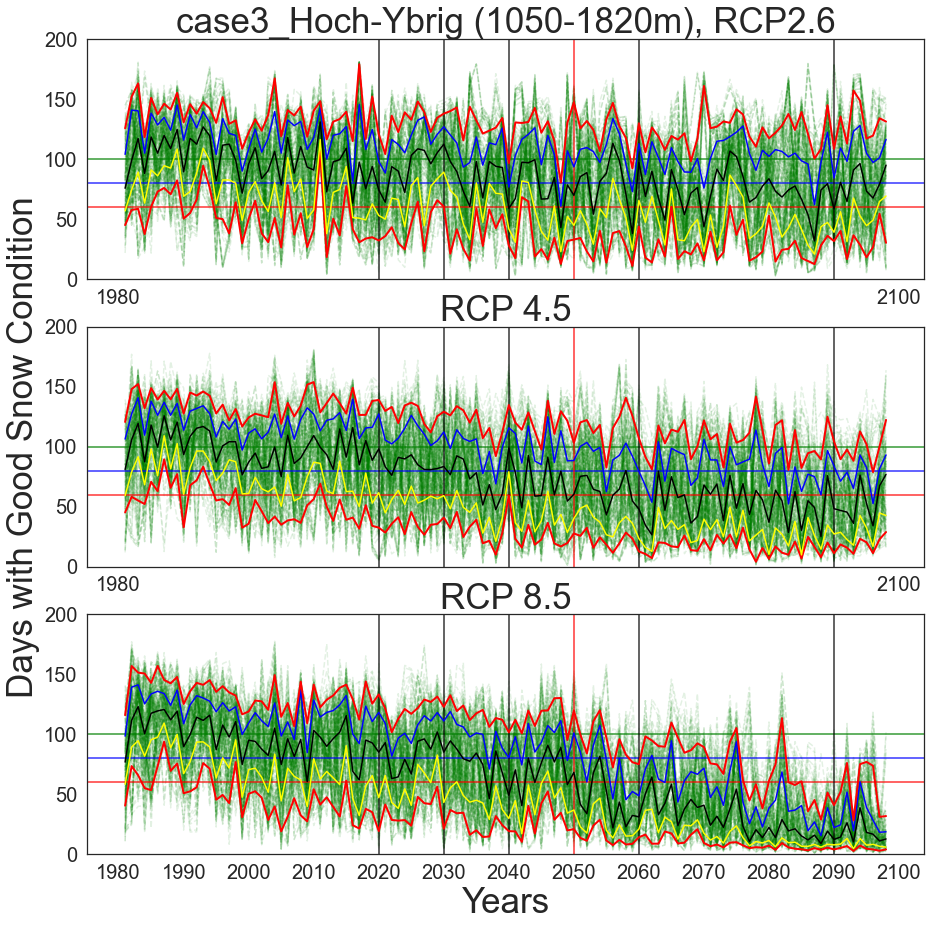

In [87]:
fig18, axs = plt.subplots(3,1, figsize=(15,15))
x_axis = np.arange(1981, 2099, step=1)

for i in range(0, len(matrix_GoodDays26), p_Step):
    a = matrix_GoodDays26[i, 1:, 1:2].astype(float)
    axs[0].plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)

for i in range(0, len(matrix_GoodDays45), p_Step):
    a = matrix_GoodDays45[i, 1:, 1:2].astype(float)
    axs[1].plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_GoodDays85), p_Step):
    a = matrix_GoodDays85[i, 1:, 1:2].astype(float)
    axs[2].plot(x_axis, a[:,0], color='green', linestyle = '--', alpha=alpha_Fade)    

    
axs[0].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[1].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[2].xaxis.set_ticks(np.arange(1980, 2101, 10))

axs[0].tick_params(axis='x', labelsize=20)
axs[1].tick_params(axis='x', labelsize=20)
axs[2].tick_params(axis='x', labelsize=20)

axs[0].tick_params(axis='y', labelsize=20)
axs[1].tick_params(axis='y', labelsize=20)
axs[2].tick_params(axis='y', labelsize=20)

axs[0].axhline(y=100, color='green', alpha=0.8)
axs[0].axhline(y=80, color='blue', alpha=0.8)
axs[0].axhline(y=60, color='red', alpha=0.8)

axs[1].axhline(y=100, color='green', alpha=0.8)
axs[1].axhline(y=80, color='blue', alpha=0.8)
axs[1].axhline(y=60, color='red', alpha=0.8)

axs[2].axhline(y=100, color='green', alpha=0.8)
axs[2].axhline(y=80, color='blue', alpha=0.8)
axs[2].axhline(y=60, color='red', alpha=0.8)


axs[0].axvline(x=2020, color='black', alpha=0.8)
axs[0].axvline(x=2030, color='black', alpha=0.8)
axs[0].axvline(x=2040, color='black', alpha=0.8)
axs[0].axvline(x=2050, color='red', alpha=0.8)
axs[0].axvline(x=2060, color='black', alpha=0.8)
axs[0].axvline(x=2090, color='black', alpha=0.8)
axs[1].axvline(x=2020, color='black', alpha=0.8)
axs[1].axvline(x=2030, color='black', alpha=0.8)
axs[1].axvline(x=2040, color='black', alpha=0.8)
axs[1].axvline(x=2050, color='red', alpha=0.8)
axs[1].axvline(x=2060, color='black', alpha=0.8)
axs[1].axvline(x=2090, color='black', alpha=0.8)
axs[2].axvline(x=2020, color='black', alpha=0.8)
axs[2].axvline(x=2030, color='black', alpha=0.8)
axs[2].axvline(x=2040, color='black', alpha=0.8)
axs[2].axvline(x=2050, color='red', alpha=0.8)
axs[2].axvline(x=2060, color='black', alpha=0.8)
axs[2].axvline(x=2090, color='black', alpha=0.8)

axs[0].plot(x_axis, q10_years_26, color='red', linewidth = 2, alpha=1)
axs[0].plot(x_axis, q25_years_26, color='yellow',linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q50_years_26, color='black', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q75_years_26, color='blue', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q90_years_26, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q10_years_45, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q25_years_45, color='yellow',linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q50_years_45, color='black', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q75_years_45, color='blue', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q90_years_45, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q10_years_85, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q25_years_85, color='yellow',linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q50_years_85, color='black', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q75_years_85, color='blue', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q90_years_85, color='red', linewidth = 2, alpha=1)

axs[0].set_ylim(bottom=0, top =200)
axs[0].set_title(title_Figs, fontsize=35)
#axs[0].set_xlabel('Years')
#axs[0].set_ylabel('Days With Good Snow Condition', fontsize=12)

axs[1].set_ylim(bottom=0, top =200)
#axs[1].set_title('case3_Hoch_Ybrigh(1400m) RCP 4.5', fontsize=25)
axs[1].set_title('RCP 4.5', fontsize=35)

#axs[1].set_xlabel('Years')
axs[1].set_ylabel('Days with Good Snow Condition', fontsize=35)

axs[2].set_ylim(bottom=0, top =200)
#axs[2].set_title('case3_Hoch_Ybrigh(1400m) RCP 8.5', fontsize=25)
axs[2].set_title('RCP 8.5', fontsize=35)

axs[2].set_xlabel('Years', fontsize=35)
#axs[2].set_ylabel('Days With Good Snow Condition', fontsize=12)

fig18.savefig(os.path.join(rootVisualization, 'RCP26_45_85_GoodDays.svg'), format='svg', dpi=300)
fig18.savefig(os.path.join(rootVisualization, 'RCP26_45_85_GoodDays.tiff'), format='tiff', dpi=150)

plt.show()

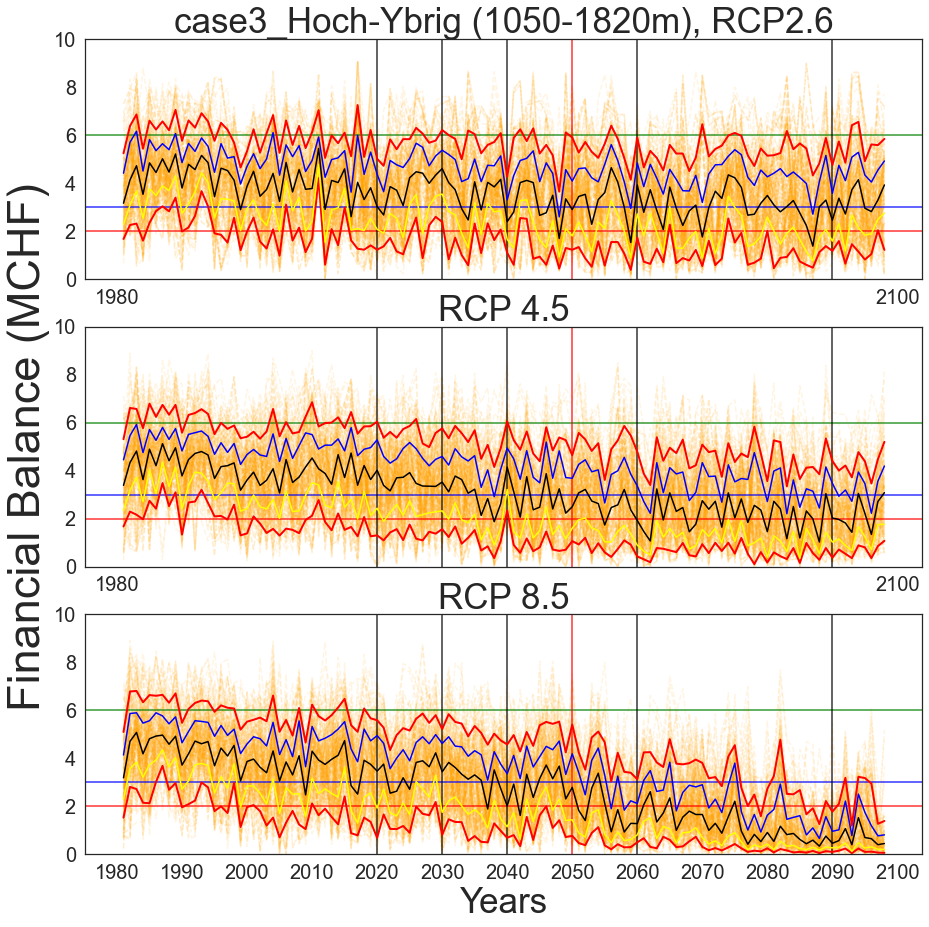

In [88]:
fig19, axs = plt.subplots(3,1, figsize=(15,15))
x_axis = np.arange(1981, 2099, step=1)

for i in range(0, len(matrix_fin26), p_Step):
    a = matrix_fin26[i, 1:, 1:2].astype(float)
    axs[0].plot(x_axis, a[:,0], color='orange', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_fin45), p_Step):
    a = matrix_fin45[i, 1:, 1:2].astype(float)
    axs[1].plot(x_axis, a[:,0], color='orange', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_fin85), p_Step):
    a = matrix_fin85[i, 1:, 1:2].astype(float)
    axs[2].plot(x_axis, a[:,0], color='orange', linestyle = '--', alpha=alpha_Fade)    

axs[0].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[1].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[2].xaxis.set_ticks(np.arange(1980, 2101, 10))

axs[0].tick_params(axis='x', labelsize=20)
axs[1].tick_params(axis='x', labelsize=20)
axs[2].tick_params(axis='x', labelsize=20)

axs[0].tick_params(axis='y', labelsize=20)
axs[1].tick_params(axis='y', labelsize=20)
axs[2].tick_params(axis='y', labelsize=20)

axs[0].axhline(y=6, color='green', alpha=0.8)
axs[0].axhline(y=3, color='blue', alpha=0.8)
axs[0].axhline(y=2, color='red', alpha=0.8)

axs[1].axhline(y=6, color='green', alpha=0.8)
axs[1].axhline(y=3, color='blue', alpha=0.8)
axs[1].axhline(y=2, color='red', alpha=0.8)

axs[2].axhline(y=6, color='green', alpha=0.8)
axs[2].axhline(y=3, color='blue', alpha=0.8)
axs[2].axhline(y=2, color='red', alpha=0.8)


axs[0].axvline(x=2020, color='black', alpha=0.8)
axs[0].axvline(x=2030, color='black', alpha=0.8)
axs[0].axvline(x=2040, color='black', alpha=0.8)
axs[0].axvline(x=2050, color='red', alpha=0.8)
axs[0].axvline(x=2060, color='black', alpha=0.8)
axs[0].axvline(x=2090, color='black', alpha=0.8)
axs[1].axvline(x=2020, color='black', alpha=0.8)
axs[1].axvline(x=2030, color='black', alpha=0.8)
axs[1].axvline(x=2040, color='black', alpha=0.8)
axs[1].axvline(x=2050, color='red', alpha=0.8)
axs[1].axvline(x=2060, color='black', alpha=0.8)
axs[1].axvline(x=2090, color='black', alpha=0.8)
axs[2].axvline(x=2020, color='black', alpha=0.8)
axs[2].axvline(x=2030, color='black', alpha=0.8)
axs[2].axvline(x=2040, color='black', alpha=0.8)
axs[2].axvline(x=2050, color='red', alpha=0.8)
axs[2].axvline(x=2060, color='black', alpha=0.8)
axs[2].axvline(x=2090, color='black', alpha=0.8)

axs[0].plot(x_axis, q10_years_fin_26, color='red', linewidth = 2, alpha=1)
axs[0].plot(x_axis, q25_years_fin_26, color='yellow',linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q50_years_fin_26, color='black', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q75_years_fin_26, color='blue', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q90_years_fin_26, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q10_years_fin_45, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q25_years_fin_45, color='yellow',linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q50_years_fin_45, color='black', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q75_years_fin_45, color='blue', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q90_years_fin_45, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q10_years_fin_85, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q25_years_fin_85, color='yellow',linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q50_years_fin_85, color='black', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q75_years_fin_85, color='blue', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q90_years_fin_85, color='red', linewidth = 2, alpha=1)


axs[0].set_ylim(bottom=0, top =10)
axs[0].set_title(title_Figs, fontsize=35)
#axs[0].set_xlabel('Years')
#axs[0].set_ylabel('Days With Good Snow Condition', fontsize=12)

axs[1].set_ylim(bottom=0, top =10)
#axs[1].set_title('case3_Hoch_Ybrigh(1400m) RCP 4.5', fontsize=25)
axs[1].set_title('RCP 4.5', fontsize=35)

#axs[1].set_xlabel('Years')
axs[1].set_ylabel('Financial Balance (MCHF)', fontsize=45)

axs[2].set_ylim(bottom=0, top =10
               )
#axs[2].set_title('case3_Hoch_Ybrigh(1400m) RCP 8.5', fontsize=25)
axs[2].set_title('RCP 8.5', fontsize=35)

axs[2].set_xlabel('Years', fontsize=35)
#axs[2].set_ylabel('Days With Good Snow Condition', fontsize=12)


fig19.savefig(os.path.join(rootVisualization, 'RCP26_45_85_Financial.svg'), format='svg', dpi=300)
fig19.savefig(os.path.join(rootVisualization, 'RCP26_45_85_Financial.tiff'), format='tiff', dpi=150)


plt.show()

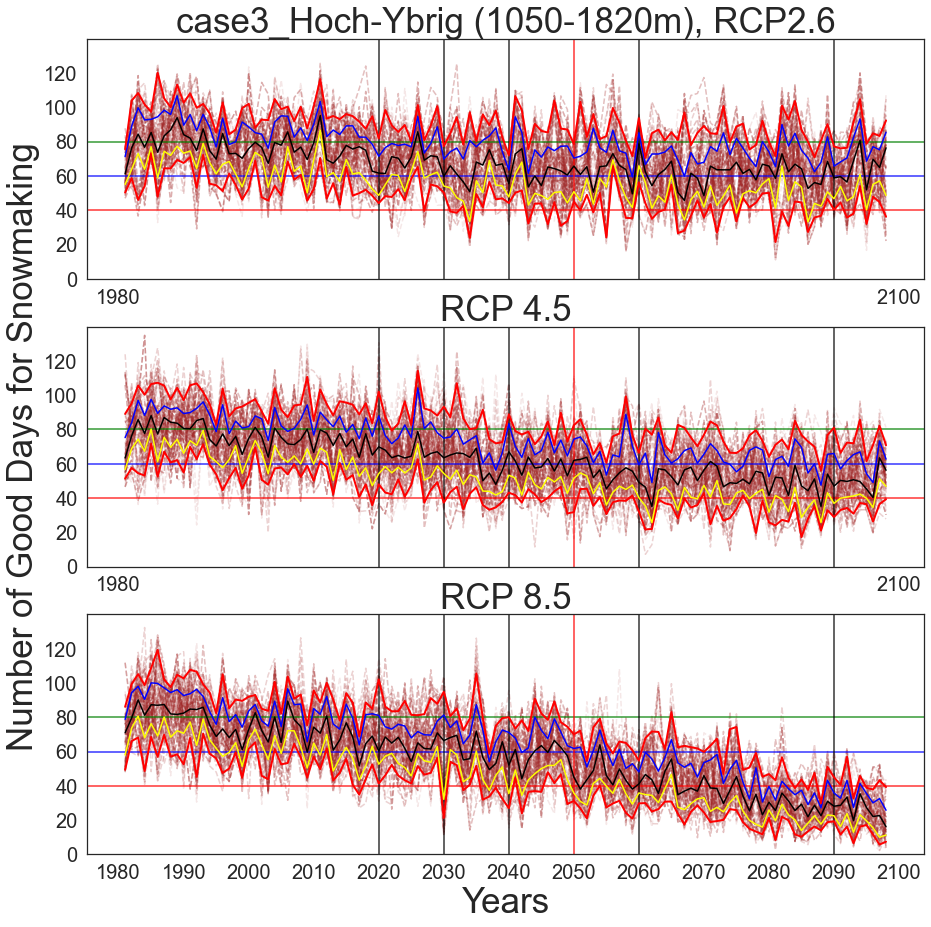

In [89]:
fig20, axs = plt.subplots(3,1, figsize=(15,15))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, len(matrix_Art26), p_Step):
    a = matrix_Art26[i, 1:, 1:2].astype(float)
    axs[0].plot(x_axis, a[:,0], color='brown', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_Art45), p_Step):
    a = matrix_Art45[i, 1:, 1:2].astype(float)
    axs[1].plot(x_axis, a[:,0], color='brown', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_Art85), p_Step):
    a = matrix_Art85[i, 1:, 1:2].astype(float)
    axs[2].plot(x_axis, a[:,0], color='brown', linestyle = '--', alpha=alpha_Fade)    

    
    
    
axs[0].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[1].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[2].xaxis.set_ticks(np.arange(1980, 2101, 10))

axs[0].yaxis.set_ticks(np.arange(0, 140, 20))
axs[1].yaxis.set_ticks(np.arange(0, 140, 20))
axs[2].yaxis.set_ticks(np.arange(0, 140, 20))

axs[0].tick_params(axis='x', labelsize=20)
axs[1].tick_params(axis='x', labelsize=20)
axs[2].tick_params(axis='x', labelsize=20)

axs[0].tick_params(axis='y', labelsize=20)
axs[1].tick_params(axis='y', labelsize=20)
axs[2].tick_params(axis='y', labelsize=20)

axs[0].axhline(y=80, color='green', alpha=0.8)
axs[0].axhline(y=60, color='blue', alpha=0.8)
axs[0].axhline(y=40, color='red', alpha=0.8)

axs[1].axhline(y=80, color='green', alpha=0.8)
axs[1].axhline(y=60, color='blue', alpha=0.8)
axs[1].axhline(y=40, color='red', alpha=0.8)

axs[2].axhline(y=80, color='green', alpha=0.8)
axs[2].axhline(y=60, color='blue', alpha=0.8)
axs[2].axhline(y=40, color='red', alpha=0.8)



axs[0].axvline(x=2020, color='black', alpha=0.8)
axs[0].axvline(x=2030, color='black', alpha=0.8)
axs[0].axvline(x=2040, color='black', alpha=0.8)
axs[0].axvline(x=2050, color='red', alpha=0.8)
axs[0].axvline(x=2060, color='black', alpha=0.8)
axs[0].axvline(x=2090, color='black', alpha=0.8)
axs[1].axvline(x=2020, color='black', alpha=0.8)
axs[1].axvline(x=2030, color='black', alpha=0.8)
axs[1].axvline(x=2040, color='black', alpha=0.8)
axs[1].axvline(x=2050, color='red', alpha=0.8)
axs[1].axvline(x=2060, color='black', alpha=0.8)
axs[1].axvline(x=2090, color='black', alpha=0.8)
axs[2].axvline(x=2020, color='black', alpha=0.8)
axs[2].axvline(x=2030, color='black', alpha=0.8)
axs[2].axvline(x=2040, color='black', alpha=0.8)
axs[2].axvline(x=2050, color='red', alpha=0.8)
axs[2].axvline(x=2060, color='black', alpha=0.8)
axs[2].axvline(x=2090, color='black', alpha=0.8)



axs[0].plot(x_axis, q10_years_Art_26, color='red', linewidth = 2, alpha=1)
axs[0].plot(x_axis, q25_years_Art_26, color='yellow',linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q50_years_Art_26, color='black', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q75_years_Art_26, color='blue', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q90_years_Art_26, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q10_years_Art_45, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q25_years_Art_45, color='yellow',linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q50_years_Art_45, color='black', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q75_years_Art_45, color='blue', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q90_years_Art_45, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q10_years_Art_85, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q25_years_Art_85, color='yellow',linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q50_years_Art_85, color='black', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q75_years_Art_85, color='blue', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q90_years_Art_85, color='red', linewidth = 2, alpha=1)



axs[0].set_ylim(bottom=0, top =140)
axs[0].set_title(title_Figs, fontsize=35)
#axs[0].set_xlabel('Years')
#axs[0].set_ylabel('Days with Artificial Snow Possibility', fontsize=12)

axs[1].set_ylim(bottom=0, top =140)
#axs[1].set_title('case3_Hoch_Ybrigh(1400m) RCP 4.5', fontsize=25)
axs[1].set_title('RCP 4.5', fontsize=35)

#axs[1].set_xlabel('Years')
axs[1].set_ylabel('Number of Good Days for Snowmaking', fontsize=35)

axs[2].set_ylim(bottom=0, top =140)
#axs[2].set_title('case3_Hoch_Ybrigh(1400m) RCP 8.5', fontsize=25)
axs[2].set_title('RCP 8.5', fontsize=35)

axs[2].set_xlabel('Years', fontsize=35)
#axs[2].set_ylabel('Days with Artificial Snow Possibility', fontsize=12)


fig20.savefig(os.path.join(rootVisualization, 'RCP26_45_85_ArtificialSnow.svg'), format='svg', dpi=300)
fig20.savefig(os.path.join(rootVisualization, 'RCP26_45_85_ArtificialSnow.tiff'), format='tiff', dpi=150)


plt.show()

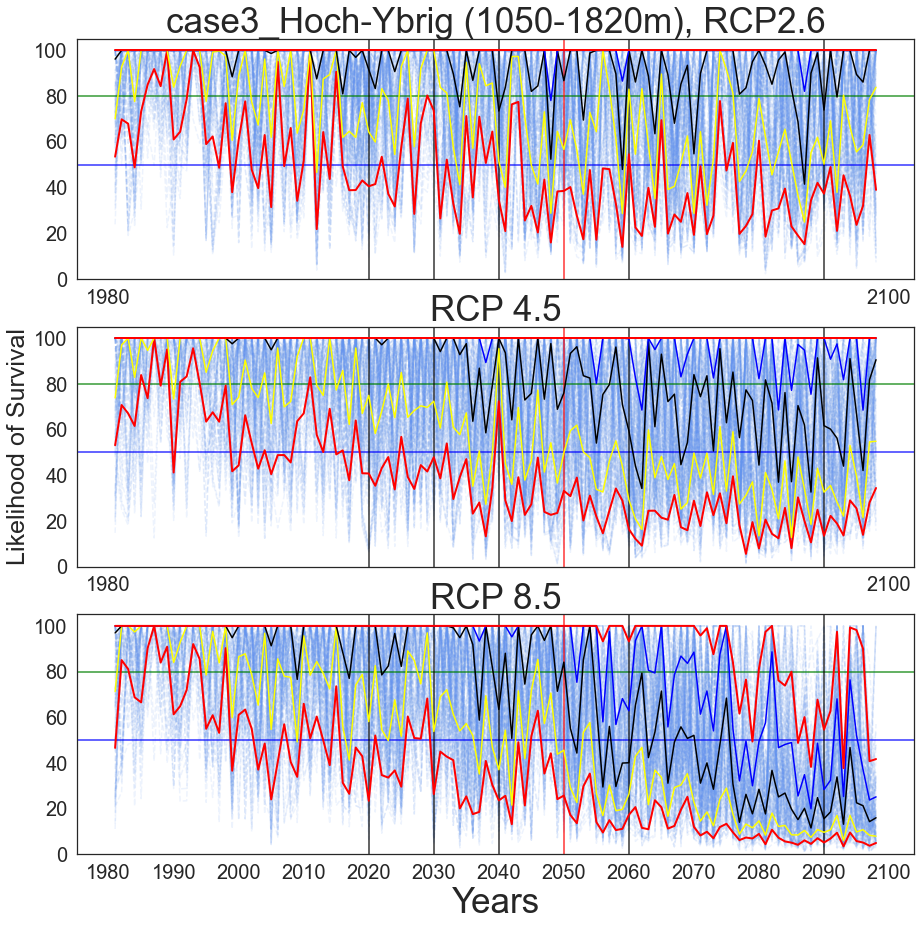

In [90]:
fig21, axs = plt.subplots(3,1, figsize=(15,15))
x_axis = np.arange(1981, 2099, step=1)


for i in range(0, len(matrix_Like26), p_Step):
    a = matrix_Like26[i, 1:, 1:2].astype(float)
    axs[0].plot(x_axis, a[:,0], color='cornflowerblue', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_Like45), p_Step):
    a = matrix_Like45[i, 1:, 1:2].astype(float)
    axs[1].plot(x_axis, a[:,0], color='cornflowerblue', linestyle = '--', alpha=alpha_Fade)


for i in range(0, len(matrix_Like85), p_Step):
    a = matrix_Like85[i, 1:, 1:2].astype(float)
    axs[2].plot(x_axis, a[:,0], color='cornflowerblue', linestyle = '--', alpha=alpha_Fade)    


axs[0].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[1].xaxis.set_ticks(np.arange(1980, 2101, 120))
axs[2].xaxis.set_ticks(np.arange(1980, 2101, 10))

axs[0].yaxis.set_ticks(np.arange(0, 140, 20))
axs[1].yaxis.set_ticks(np.arange(0, 140, 20))
axs[2].yaxis.set_ticks(np.arange(0, 140, 20))

axs[0].tick_params(axis='x', labelsize=20)
axs[1].tick_params(axis='x', labelsize=20)
axs[2].tick_params(axis='x', labelsize=20)

axs[0].tick_params(axis='y', labelsize=20)
axs[1].tick_params(axis='y', labelsize=20)
axs[2].tick_params(axis='y', labelsize=20)    
    

axs[0].axhline(y=80, color='green', alpha=0.8)
axs[0].axhline(y=50, color='blue', alpha=0.8)
axs[1].axhline(y=80, color='green', alpha=0.8)
axs[1].axhline(y=50, color='blue', alpha=0.8)
axs[2].axhline(y=80, color='green', alpha=0.8)
axs[2].axhline(y=50, color='blue', alpha=0.8)



axs[0].axvline(x=2020, color='black', alpha=0.8)
axs[0].axvline(x=2030, color='black', alpha=0.8)
axs[0].axvline(x=2040, color='black', alpha=0.8)
axs[0].axvline(x=2050, color='red', alpha=0.8)
axs[0].axvline(x=2060, color='black', alpha=0.8)
axs[0].axvline(x=2090, color='black', alpha=0.8)
axs[1].axvline(x=2020, color='black', alpha=0.8)
axs[1].axvline(x=2030, color='black', alpha=0.8)
axs[1].axvline(x=2040, color='black', alpha=0.8)
axs[1].axvline(x=2050, color='red', alpha=0.8)
axs[1].axvline(x=2060, color='black', alpha=0.8)
axs[1].axvline(x=2090, color='black', alpha=0.8)
axs[2].axvline(x=2020, color='black', alpha=0.8)
axs[2].axvline(x=2030, color='black', alpha=0.8)
axs[2].axvline(x=2040, color='black', alpha=0.8)
axs[2].axvline(x=2050, color='red', alpha=0.8)
axs[2].axvline(x=2060, color='black', alpha=0.8)
axs[2].axvline(x=2090, color='black', alpha=0.8)



axs[0].plot(x_axis, q10_years_Like_26, color='red', linewidth = 2, alpha=1)
axs[0].plot(x_axis, q25_years_Like_26, color='yellow',linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q50_years_Like_26, color='black', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q75_years_Like_26, color='blue', linewidth = 1.5, alpha=1)
axs[0].plot(x_axis, q90_years_Like_26, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q10_years_Like_45, color='red', linewidth = 2, alpha=1)
axs[1].plot(x_axis, q25_years_Like_45, color='yellow',linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q50_years_Like_45, color='black', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q75_years_Like_45, color='blue', linewidth = 1.5, alpha=1)
axs[1].plot(x_axis, q90_years_Like_45, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q10_years_Like_85, color='red', linewidth = 2, alpha=1)
axs[2].plot(x_axis, q25_years_Like_85, color='yellow',linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q50_years_Like_85, color='black', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q75_years_Like_85, color='blue', linewidth = 1.5, alpha=1)
axs[2].plot(x_axis, q90_years_Like_85, color='red', linewidth = 2, alpha=1)


axs[0].set_ylim(bottom=0, top =105)
axs[0].set_title(title_Figs, fontsize=35)
#axs[0].set_xlabel('Years')
#axs[0].set_ylabel('Likelihood of Survival', fontsize=12)

axs[1].set_ylim(bottom=0, top =105)
#axs[1].set_title('case3_Hoch_Ybrigh(1400m) RCP 4.5', fontsize=25)
axs[1].set_title('RCP 4.5', fontsize=35)

#axs[1].set_xlabel('Years')
axs[1].set_ylabel('Likelihood of Survival', fontsize=25)

axs[2].set_ylim(bottom=0, top =105)
#axs[2].set_title('case3_Hoch_Ybrigh(1400m) RCP 8.5', fontsize=25)
axs[2].set_title('RCP 8.5', fontsize=35)


axs[2].set_xlabel('Years', fontsize=35)
#axs[2].set_ylabel('Likelihood of Survival', fontsize=12)


fig21.savefig(os.path.join(rootVisualization, 'RCP26_45_85_Likelihood_Survival.svg'), format='svg', dpi=300)
fig21.savefig(os.path.join(rootVisualization, 'RCP26_45_85_Likelihood_Survival.tiff'), format='tiff', dpi=150)


plt.show()

In [91]:
dfAllAverages.head()

,median26,median45,median85
0,75.433036,80.856987,76.913600
1,98.720815,105.726713,111.722760
2,116.880080,119.373614,123.183773
3,87.832727,87.331350,100.535792
4,118.208682,117.955593,117.642111


### Worst Case: Quantile 0.10 >> 90% of the scenarios satisfy this condition

In [92]:
title_Figs2 = 'Hoch-Ybrig'

In [93]:
y_axis = np.arange(1981, 2100, step= 20)

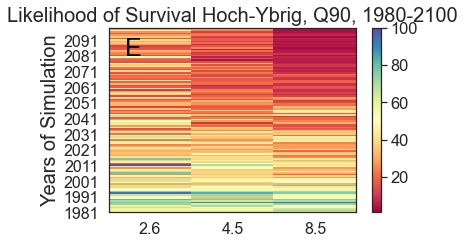

In [211]:
from matplotlib.ticker import FuncFormatter


fig22, (ax3) = plt.subplots(1, 1, figsize=(9,5))

x_axis = np.arange(0.5, 3.5, step=1)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


c3 = ax3.pcolor(dfAllAverages_Q10, cmap='Spectral', vmin=1, vmax=100, offsets = 0.35)
cb3 = fig22.colorbar(c3)

#xticks(np.arange(0, 4, step=1))
ax3.set_title('default: no edges')


#ax3.set_xlabel("Average over Climate scenarios in RCPs", fontsize=15)

ax3.set_ylabel("Years of Simulation", fontsize=20)
plt.xticks(x_axis, ('2.6', '4.5', '8.5'), fontsize=16)
plt.yticks(fontsize=16)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)
#plt.title("Likelihood of survival of the resort at Q10 level from {} untill the year {}".format(1981, 2099), fontsize=15)
plt.title("Likelihood of Survival {}, Q90, {}-{}".format(title_Figs2, 1980,2100), fontsize=20)

ax3.text(0.2, 100, 'E', color = 'Black', fontsize=25)

fig22.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q90.svg'), format='svg', dpi=300)
fig22.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q90.tiff'), format='tiff', dpi=300)


fig22.tight_layout()
plt.show()

### Median Case: Quantile 0.5 >> 50 % of the scenarios satisfy this condition

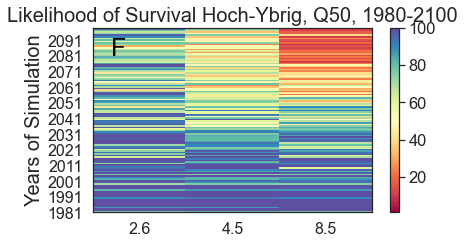

In [212]:
from matplotlib.ticker import FuncFormatter


fig23, (ax4) = plt.subplots(1, 1, figsize=(9.5,5))

x_axis = np.arange(0.5, 3.5, step=1)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


c4 = ax4.pcolor(dfAllAverages, cmap='Spectral' ,vmin=1, vmax=100, offsets = .35)
cb4 = fig23.colorbar(c4)

#xticks(np.arange(0, 4, step=1))
ax4.set_title('default: no edges')


#ax4.set_xlabel("Average over Climate scenarios in RCPs", fontsize=15)

ax4.set_ylabel("Years of Simulation", fontsize=20)
plt.xticks(x_axis, ('2.6', '4.5', '8.5'), fontsize=16)
plt.yticks(fontsize=16)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)
#plt.title("Likelihood of survival of the resort at Q10 level from {} untill the year {}".format(1981, 2099), fontsize=15)
plt.title("Likelihood of Survival {}, Q50, {}-{}".format(title_Figs2, 1980,2100), fontsize=20)

ax4.text(0.2, 100, 'F', color = 'Black', fontsize=25)


fig23.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q50.svg'), format='svg', dpi=300)
fig23.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q50.tiff'), format='tiff', dpi=300)
#fig23.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q50.jpg'), format='jpg', dpi=300)


fig23.tight_layout()
plt.show()

### Best Case: Quantile 0.9 >> Only 10 % of the scenarios satisfy this condition

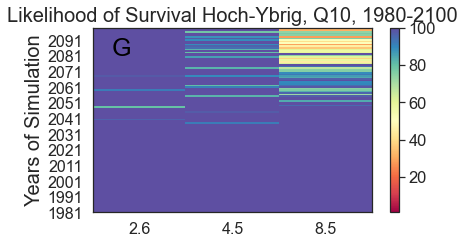

In [213]:
from matplotlib.ticker import FuncFormatter


fig24, (ax4) = plt.subplots(1, 1, figsize=(9.5,5))

x_axis = np.arange(0.5, 3.5, step=1)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


c4 = ax4.pcolor(dfAllAverages_Q90, cmap='Spectral' ,vmin=1, vmax=100)
cb4 = fig24.colorbar(c4)

#xticks(np.arange(0, 4, step=1))
ax4.set_title('default: no edges')


#ax4.set_xlabel("Average over Climate scenarios in RCPs", fontsize=15)

ax4.set_ylabel("Years of Simulation", fontsize=20)
plt.xticks(x_axis, ('2.6', '4.5', '8.5'), fontsize=16)
plt.yticks(fontsize=16)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)
#plt.title("Likelihood of survival of the resort at Q10 level from {} untill the year {}".format(1981, 2099), fontsize=15)
plt.title("Likelihood of Survival {}, Q10, {}-{}".format(title_Figs2, 1980,2100), fontsize=20)

ax4.text(0.2, 100, 'G', color = 'Black', fontsize=25)


fig24.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q10.svg'), format='svg', dpi=300)
fig24.savefig(os.path.join(rootVisualization, 'Likelihood_All_Q10.tiff'), format='tiff', dpi=300)



fig24.tight_layout()
plt.show()

### Making dataframes for all RCP2.6 , RCP4.5, and RCP8.5 scenarios

In [97]:
print(matrix_GoodDays26.shape)
print(matrix_GoodDays45.shape)
print(matrix_GoodDays85.shape)
print(matrix_GoodDays.shape)

(3015, 119, 2)
(2970, 119, 2)
(3015, 119, 2)
(9000, 119, 2)


In [98]:
pd.DataFrame((matrix_GoodDays26[0][1:,0:1]), columns=matrix_GoodDays26[0,0,0:1]).head()

,Season
0,1981-1982
1,1982-1983
2,1983-1984
3,1984-1985
4,1985-1986


In [99]:
df26_all = pd.DataFrame((matrix_GoodDays26[0][1:,0:1]), columns=matrix_GoodDays26[0,0,0:1])
for i in range(len(matrix_GoodDays26)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_GoodDays26[i,0,1:])])
    df26_all = pd.concat((df26_all, b), axis = 1)

In [100]:
df26_all.head(7)
df26_all.to_csv(os.path.join(rootVisualization, 'df26_all.csv'), index = False)

In [101]:
matrix_GoodDays45[2,0,1:]

array(['isOverSnow_SMHI-RCA-CSIRO-EUR44-RCP45-pcp'], dtype='<U47')

In [102]:
df45_all = pd.DataFrame((matrix_GoodDays45[0][1:,0:1]), columns=matrix_GoodDays45[0,0,0:1])
for i in range(len(matrix_GoodDays45)):
    #b = pd.DataFrame(matrix_GoodDays45[i][1:,1:], columns=matrix_GoodDays45[i,0,1:])
    b = pd.DataFrame(matrix_GoodDays45[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_GoodDays45[i,0,1:])])

    df45_all = pd.concat((df45_all, b), axis = 1)

In [103]:
df45_all.head(7)
df45_all.to_csv(os.path.join(rootVisualization, 'df45_all.csv'), index = False)

In [104]:
df85_all = pd.DataFrame((matrix_GoodDays85[0][1:,0:1]), columns=matrix_GoodDays85[0,0,0:1])
for i in range(len(matrix_GoodDays85)):
    #b = pd.DataFrame(matrix_GoodDays85[i][1:,1:], columns=matrix_GoodDays85[i,0,1:])
    b = pd.DataFrame(matrix_GoodDays85[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_GoodDays85[i,0,1:])])

    df85_all = pd.concat((df85_all, b), axis = 1)

In [105]:
df85_all.head(7)
df85_all.to_csv(os.path.join(rootVisualization, 'df85_all.csv'), index = False)

In [106]:
df26_all_Matrix = df26_all.to_numpy()
df45_all_Matrix = df45_all.to_numpy()
df85_all_Matrix = df85_all.to_numpy()

In [107]:
df26_all_fin = pd.DataFrame((matrix_fin26[0][1:,0:1]), columns=matrix_fin26[0,0,0:1])
for i in range(len(matrix_fin26)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_fin26[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_fin26[i,0,1:])])
    df26_all_fin = pd.concat((df26_all_fin, b), axis = 1)

In [108]:
df26_all_fin.head(7)

,Season,sc_1_['Money_sc_Ver1_26_12'],sc_2_['Money_sc_Ver2_26_7'],sc_3_['Money_sc_Ver1_26_12'],sc_4_['Money_sc_Ver2_26_8'],sc_5_['Money_sc_Ver1_26_5'],sc_6_['Money_sc_Ver1_26_11'],sc_7_['Money_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_8_['Money_sc_Ver1_26_11'],sc_9_['Money_sc_Ver2_26_5'],sc_10_['Money_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_11_['Money_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_12_['Money_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_13_['Money_sc_Ver1_26_5'],sc_14_['Money_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_15_['Money_sc_Ver2_26_10'],sc_16_['Money_DMI-HIRHAM-ECEARTH-EUR11-RCP26-pcp'],sc_17_['Money_sc_Ver2_26_4'],sc_18_['Money_sc_Ver1_26_3'],sc_19_['Money_sc_Ver1_26_10'],sc_20_['Money_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_21_['Money_sc_Ver2_26_10'],sc_22_['Money_sc_Ver1_26_7'],sc_23_['Money_SMHI-RCA-NORESM-EUR44-RCP26-pcp'],sc_24_['Money_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_25_['Money_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_26_['Money_sc_Ver2_26_10'],sc_27_['Money_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_28_['Money_sc_Ver2_26_5'],sc_29_['Money_SMHI-RCA-NORESM-EUR44-RCP26-pcp'],sc_30_['Money_sc_Ver2_26_9'],sc_31_['Money_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_32_['Money_sc_Ver2_26_1'],sc_33_['Money_sc_Ver2_26_8'],...,sc_2982_['Money_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_2983_['Money_sc_Ver1_26_5'],sc_2984_['Money_sc_Ver2_26_2'],sc_2985_['Money_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_2986_['Money_sc_Ver1_26_6'],sc_2987_['Money_sc_Ver1_26_5'],sc_2988_['Money_sc_Ver1_26_7'],sc_2989_['Money_sc_Ver1_26_10'],sc_2990_['Money_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_2991_['Money_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_2992_['Money_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_2993_['Money_sc_Ver1_26_4'],sc_2994_['Money_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_2995_['Money_sc_Ver2_26_3'],sc_2996_['Money_sc_Ver2_26_10'],sc_2997_['Money_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_2998_['Money_sc_Ver2_26_11'],sc_2999_['Money_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_3000_['Money_sc_Ver1_26_3'],sc_3001_['Money_sc_Ver1_26_10'],sc_3002_['Money_sc_Ver2_26_3'],sc_3003_['Money_sc_Ver1_26_12'],sc_3004_['Money_sc_Ver1_26_11'],sc_3005_['Money_sc_Ver2_26_6'],sc_3006_['Money_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_3007_['Money_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_3008_['Money_sc_Ver1_26_2'],sc_3009_['Money_sc_Ver1_26_7'],sc_3010_['Money_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_3011_['Money_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_3012_['Money_sc_Ver1_26_11'],sc_3013_['Money_sc_Ver2_26_8'],sc_3014_['Money_sc_Ver1_26_10'],sc_3015_['Money_sc_Ver2_26_5']
0,1981-1982,2.5099999999999985,3.290000000000001,1.8300000000000014,1.6400000000000012,1.470000000000001,2.109999999999999,2.8699999999999997,2.3499999999999988,1.9200000000000015,2.170000000000001,2.4400000000000013,4.730000000000004,1.550000000000001,1.6200000000000012,4.800000000000003,2.6699999999999986,2.86,0.9600000000000006,4.239999999999996,2.549999999999999,5.0800000000000045,4.650000000000002,4.010000000000001,2.0000000000000013,3.5099999999999967,5.130000000000005,3.669999999999997,1.8700000000000014,4.670000000000004,3.149999999999999,2.8600000000000017,1.2100000000000009,1.9200000000000015,...,4.710000000000004,1.730000000000001,2.8700000000000023,4.019999999999998,4.500000000000003,2.6599999999999984,2.6899999999999973,4.4999999999999964,2.7599999999999976,2.699999999999998,2.0000000000000013,1.420000000000001,2.340000000000001,3.419999999999997,4.6099999999999985,2.2499999999999996,5.130000000000005,2.6299999999999972,2.06,3.2599999999999993,3.2499999999999996,1.8300000000000014,2.629999999999999,3.319999999999997,2.990000000000002,1.350000000000001,2.0000000000000013,2.659999999999997,2.8300000000000014,3.430000000000001,2.0300000000000007,1.5800000000000012,4.4999999999999964,0.8600000000000005
1,1982-1983,4.109999999999997,4.300000000000003,3.0499999999999967,2.1800000000000006,2.7699999999999982,1.9600000000000015,3.4200000000000017,1.9500000000000015,6.2000000000000055,1.8800000000000014,2.17000000000

In [109]:
df45_all_fin = pd.DataFrame((matrix_fin45[0][1:,0:1]), columns=matrix_fin45[0,0,0:1])
for i in range(len(matrix_fin45)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_fin45[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_fin45[i,0,1:])])
    df45_all_fin = pd.concat((df45_all_fin, b), axis = 1)

In [110]:
df45_all_fin.head(7)

,Season,sc_1_['Money_sc_Ver2_45_11'],sc_2_['Money_sc_Ver2_45_1'],sc_3_['Money_SMHI-RCA-CSIRO-EUR44-RCP45-pcp'],sc_4_['Money_sc_Ver1_45_1'],sc_5_['Money_sc_Ver1_45_23'],sc_6_['Money_sc_Ver2_45_2'],sc_7_['Money_DMI-HIRHAM-ECEARTH-EUR44-RCP45-pcp'],sc_8_['Money_sc_Ver1_45_16'],sc_9_['Money_sc_Ver1_45_13'],sc_10_['Money_sc_Ver1_45_9'],sc_11_['Money_CLMCOM-CCLM4-MPIESM-EUR44-RCP45-pcp'],sc_12_['Money_SMHI-RCA-HADGEM-EUR11-RCP45-pcp'],sc_13_['Money_sc_Ver1_45_15'],sc_14_['Money_CLMCOM-CCLM4-MPIESM-EUR44-RCP45-pcp'],sc_15_['Money_SMHI-RCA-CSIRO-EUR44-RCP45-pcp'],sc_16_['Money_CLMCOM-CCLM4-MPIESM-EUR44-RCP45-pcp'],sc_17_['Money_sc_Ver1_45_14'],sc_18_['Money_SMHI-RCA-HADGEM-EUR11-RCP45-pcp'],sc_19_['Money_MPICSC-REMO2-MPIESM-EUR44-RCP45-pcp'],sc_20_['Money_sc_Ver1_45_24'],sc_21_['Money_sc_Ver1_45_5'],sc_22_['Money_sc_Ver2_45_1'],sc_23_['Money_sc_Ver1_45_15'],sc_24_['Money_CLMCOM-CCLM4-ECEARTH-EUR11-RCP45-pcp'],sc_25_['Money_sc_Ver2_45_18'],sc_26_['Money_sc_Ver1_45_15'],sc_27_['Money_SMHI-RCA-CCCMA-EUR44-RCP45-pcp'],sc_28_['Money_sc_Ver2_45_2'],sc_29_['Money_sc_Ver1_45_25'],sc_30_['Money_sc_Ver1_45_20'],sc_31_['Money_sc_Ver2_45_24'],sc_32_['Money_SMHI-RCA-NORESM-EUR44-RCP45-pcp'],sc_33_['Money_sc_Ver2_45_22'],...,sc_2937_['Money_sc_Ver1_45_2'],sc_2938_['Money_SMHI-RCA-CSIRO-EUR44-RCP45-pcp'],sc_2939_['Money_sc_Ver1_45_20'],sc_2940_['Money_CLMCOM-CCLM4-HADGEM-EUR11-RCP45-pcp'],sc_2941_['Money_sc_Ver2_45_14'],sc_2942_['Money_sc_Ver1_45_13'],sc_2943_['Money_sc_Ver2_45_8'],sc_2944_['Money_MPICSC-REMO2-MPIESM-EUR11-RCP45-pcp'],sc_2945_['Money_sc_Ver2_45_11'],sc_2946_['Money_sc_Ver1_45_11'],sc_2947_['Money_sc_Ver2_45_4'],sc_2948_['Money_sc_Ver2_45_17'],sc_2949_['Money_SMHI-RCA-MPIESM-EUR11-RCP45-pcp'],sc_2950_['Money_SMHI-RCA-MPIESM-EUR44-RCP45-pcp'],sc_2951_['Money_SMHI-RCA-IPSL-EUR11-RCP45-pcp'],sc_2952_['Money_KNMI-RACMO-HADGEM-EUR44-RCP45-pcp'],sc_2953_['Money_MPICSC-REMO2-MPIESM-EUR44-RCP45-pcp'],sc_2954_['Money_sc_Ver2_45_17'],sc_2955_['Money_sc_Ver2_45_20'],sc_2956_['Money_sc_Ver1_45_9'],sc_2957_['Money_sc_Ver1_45_8'],sc_2958_['Money_sc_Ver2_45_15'],sc_2959_['Money_sc_Ver2_45_17'],sc_2960_['Money_sc_Ver1_45_19'],sc_2961_['Money_sc_Ver1_45_19'],sc_2962_['Money_CLMCOM-CCLM4-MPIESM-EUR11-RCP45-pcp'],sc_2963_['Money_sc_Ver2_45_10'],sc_2964_['Money_sc_Ver1_45_19'],sc_2965_['Money_sc_Ver1_45_12'],sc_2966_['Money_sc_Ver2_45_20'],sc_2967_['Money_sc_Ver2_45_21'],sc_2968_['Money_SMHI-RCA-NORESM-EUR44-RCP45-pcp'],sc_2969_['Money_sc_Ver2_45_9'],sc_2970_['Money_sc_Ver1_45_4']
0,1981-1982,2.679999999999997,1.6800000000000013,1.1100000000000008,2.839999999999993,4.300000000000004,4.890000000000003,2.639999999999996,3.4499999999999904,4.470000000000005,3.8700000000000028,2.22,3.2799999999999936,2.639999999999998,2.11,0.5900000000000003,2.22,3.7799999999999967,1.4700000000000009,2.0600000000000014,1.300000000000001,1.8000000000000012,1.6200000000000012,3.0500000000000007,1.500000000000001,3.5099999999999922,2.9299999999999993,4.530000000000004,5.120000000000004,2.160000000000001,4.830000000000002,1.8200000000000014,2.739999999999998,2.2699999999999996,...,4.439999999999995,0.7000000000000004,4.050000000000001,2.629999999999999,3.049999999999995,4.4,4.220000000000003,1.5300000000000011,3.2999999999999994,1.320000000000001,1.8300000000000014,2.189999999999998,2.8899999999999975,1.5800000000000012,4.240000000000003,3.240000000000001,2.100000000000001,3.179999999999998,2.539999999999998,4.150000000000003,2.020000000000001,4.190000000000003,2.9799999999999973,2.709999999999999,2.689999999999999,1.7700000000000014,1.480000000000001,2.9200000000000004,3.059999999999999,2.4299999999999984,5.050000000000003,4.780000000000003,0.26000000000000006,3.6199999999999912
1,1982-1983,3.839999999999994,4.249999999999998,4.360000000000001,2.1899999999999973,3.7200000000000006,4.009999999999997,5.4200000000000035,5.200000000000004,2.5,4.500000000000001,2.980000000000001,6.600000000000005,4.049999999999996,2.8599999999999977,2.989999999999996,2.980000000000001,4.49000000000

In [111]:
df85_all_fin = pd.DataFrame((matrix_fin85[0][1:,0:1]), columns=matrix_fin85[0,0,0:1])
for i in range(len(matrix_fin85)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_fin85[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_fin85[i,0,1:])])
    df85_all_fin = pd.concat((df85_all_fin, b), axis = 1)

In [112]:
df85_all_fin.head(7)

,Season,sc_1_['Money_sc_Ver2_85_7'],sc_2_['Money_sc_Ver1_85_18'],sc_3_['Money_sc_Ver2_85_7'],sc_4_['Money_sc_Ver1_85_10'],sc_5_['Money_sc_Ver1_85_18'],sc_6_['Money_CLMCOM-CCLM5-HADGEM-EUR44-RCP85-pcp'],sc_7_['Money_sc_Ver2_85_20'],sc_8_['Money_sc_Ver1_85_2'],sc_9_['Money_CLMCOM-CCLM4-MPIESM-EUR11-RCP85-pcp'],sc_10_['Money_CLMCOM-CCLM5-MIROC-EUR44-RCP85-pcp'],sc_11_['Money_sc_Ver1_85_3'],sc_12_['Money_sc_Ver2_85_8'],sc_13_['Money_sc_Ver2_85_1'],sc_14_['Money_sc_Ver2_85_4'],sc_15_['Money_sc_Ver2_85_5'],sc_16_['Money_sc_Ver2_85_27'],sc_17_['Money_sc_Ver1_85_22'],sc_18_['Money_sc_Ver1_85_18'],sc_19_['Money_SMHI-RCA-CSIRO-EUR44-RCP85-pcp'],sc_20_['Money_sc_Ver1_85_25'],sc_21_['Money_sc_Ver2_85_1'],sc_22_['Money_sc_Ver1_85_29'],sc_23_['Money_sc_Ver2_85_20'],sc_24_['Money_SMHI-RCA-MIROC-EUR44-RCP85-pcp'],sc_25_['Money_sc_Ver2_85_14'],sc_26_['Money_sc_Ver2_85_19'],sc_27_['Money_sc_Ver1_85_1'],sc_28_['Money_SMHI-RCA-CCCMA-EUR44-RCP85-pcp'],sc_29_['Money_sc_Ver2_85_3'],sc_30_['Money_sc_Ver2_85_23'],sc_31_['Money_sc_Ver1_85_26'],sc_32_['Money_sc_Ver1_85_13'],sc_33_['Money_sc_Ver1_85_28'],...,sc_2982_['Money_sc_Ver1_85_2'],sc_2983_['Money_sc_Ver1_85_23'],sc_2984_['Money_CLMCOM-CCLM5-ECEARTH-EUR44-RCP85-pcp'],sc_2985_['Money_sc_Ver2_85_4'],sc_2986_['Money_SMHI-RCA-HADGEM-EUR11-RCP85-pcp'],sc_2987_['Money_sc_Ver1_85_12'],sc_2988_['Money_sc_Ver1_85_19'],sc_2989_['Money_sc_Ver2_85_31'],sc_2990_['Money_sc_Ver2_85_14'],sc_2991_['Money_sc_Ver1_85_8'],sc_2992_['Money_sc_Ver2_85_27'],sc_2993_['Money_SMHI-RCA-HADGEM-EUR44-RCP85-pcp'],sc_2994_['Money_KNMI-RACMO-ECEARTH-EUR44-RCP85-pcp'],sc_2995_['Money_sc_Ver1_85_9'],sc_2996_['Money_sc_Ver2_85_21'],sc_2997_['Money_sc_Ver2_85_18'],sc_2998_['Money_sc_Ver1_85_21'],sc_2999_['Money_sc_Ver2_85_16'],sc_3000_['Money_CLMCOM-CCLM5-HADGEM-EUR44-RCP85-pcp'],sc_3001_['Money_KNMI-RACMO-ECEARTH-EUR44-RCP85-pcp'],sc_3002_['Money_sc_Ver2_85_24'],sc_3003_['Money_sc_Ver2_85_2'],sc_3004_['Money_SMHI-RCA-GFDL-EUR44-RCP85-pcp'],sc_3005_['Money_sc_Ver1_85_29'],sc_3006_['Money_sc_Ver1_85_9'],sc_3007_['Money_sc_Ver2_85_9'],sc_3008_['Money_CLMCOM-CCLM4-MPIESM-EUR11-RCP85-pcp'],sc_3009_['Money_DMI-HIRHAM-ECEARTH-EUR44-RCP85-pcp'],sc_3010_['Money_CLMCOM-CCLM5-ECEARTH-EUR44-RCP85-pcp'],sc_3011_['Money_sc_Ver2_85_16'],sc_3012_['Money_sc_Ver2_85_1'],sc_3013_['Money_CLMCOM-CCLM5-MIROC-EUR44-RCP85-pcp'],sc_3014_['Money_sc_Ver2_85_15'],sc_3015_['Money_DMI-HIRHAM-ECEARTH-EUR44-RCP85-pcp']
0,1981-1982,3.500000000000001,3.289999999999992,2.3899999999999983,3.6699999999999995,2.2099999999999995,3.8799999999999986,1.5600000000000012,1.9000000000000015,1.6700000000000013,3.5799999999999983,3.73,4.910000000000004,2.1700000000000004,2.4999999999999973,1.290000000000001,1.8800000000000014,1.8400000000000012,3.0099999999999967,0.7000000000000004,4.370000000000003,2.52,0.6800000000000004,1.5500000000000012,4.850000000000004,3.3299999999999987,3.6000000000000005,2.7099999999999955,5.5400000000000045,2.8199999999999963,3.6799999999999957,2.2699999999999996,2.5899999999999967,2.6299999999999972,...,1.7900000000000014,2.3100000000000005,3.6300000000000026,2.489999999999998,3.819999999999993,2.71,4.0799999999999965,3.1399999999999997,4.110000000000002,3.5600000000000027,1.6900000000000013,2.5899999999999976,5.120000000000004,2.9199999999999995,2.879999999999997,2.8299999999999987,3.5900000000000016,1.5400000000000011,2.799999999999998,4.4,2.0400000000000005,0.7900000000000005,2.58,0.6500000000000004,2.89,1.9100000000000013,1.6700000000000013,2.7199999999999958,3.239999999999997,0.6000000000000003,2.650000000000002,3.0199999999999934,1.1700000000000008,2.5299999999999985
1,1982-1983,4.120000000000001,5.810000000000004,3.0199999999999965,5.0400000000000045,4.8199999999999985,5.9399999999999995,4.440000000000003,4.330000000000003,3.450000000000001,3.469999999999997,6.320000000000005,3.459999999999995,1.7900000000000014,3.2899999999999956,5.670000000000004,3.2200000000000024,2.130000000000001,4.980000000000005,3.2500000000000013,4.1700000000000035,2.15

In [113]:
df26_all_Art = pd.DataFrame((matrix_Art26[0][1:,0:1]), columns=matrix_Art26[0,0,0:1])
for i in range(len(matrix_Art26)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_Art26[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_Art26[i,0,1:])])
    df26_all_Art = pd.concat((df26_all_Art, b), axis = 1)

In [114]:
df26_all_Art.head(7)

,Season,sc_1_['ArtSnowPossibility_sc_Ver1_26_12'],sc_2_['ArtSnowPossibility_sc_Ver2_26_7'],sc_3_['ArtSnowPossibility_sc_Ver1_26_12'],sc_4_['ArtSnowPossibility_sc_Ver2_26_8'],sc_5_['ArtSnowPossibility_sc_Ver1_26_5'],sc_6_['ArtSnowPossibility_sc_Ver1_26_11'],sc_7_['ArtSnowPossibility_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_8_['ArtSnowPossibility_sc_Ver1_26_11'],sc_9_['ArtSnowPossibility_sc_Ver2_26_5'],sc_10_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_11_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_12_['ArtSnowPossibility_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_13_['ArtSnowPossibility_sc_Ver1_26_5'],sc_14_['ArtSnowPossibility_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_15_['ArtSnowPossibility_sc_Ver2_26_10'],sc_16_['ArtSnowPossibility_DMI-HIRHAM-ECEARTH-EUR11-RCP26-pcp'],sc_17_['ArtSnowPossibility_sc_Ver2_26_4'],sc_18_['ArtSnowPossibility_sc_Ver1_26_3'],sc_19_['ArtSnowPossibility_sc_Ver1_26_10'],sc_20_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_21_['ArtSnowPossibility_sc_Ver2_26_10'],sc_22_['ArtSnowPossibility_sc_Ver1_26_7'],sc_23_['ArtSnowPossibility_SMHI-RCA-NORESM-EUR44-RCP26-pcp'],sc_24_['ArtSnowPossibility_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_25_['ArtSnowPossibility_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_26_['ArtSnowPossibility_sc_Ver2_26_10'],sc_27_['ArtSnowPossibility_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_28_['ArtSnowPossibility_sc_Ver2_26_5'],sc_29_['ArtSnowPossibility_SMHI-RCA-NORESM-EUR44-RCP26-pcp'],sc_30_['ArtSnowPossibility_sc_Ver2_26_9'],sc_31_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_32_['ArtSnowPossibility_sc_Ver2_26_1'],sc_33_['ArtSnowPossibility_sc_Ver2_26_8'],...,sc_2982_['ArtSnowPossibility_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_2983_['ArtSnowPossibility_sc_Ver1_26_5'],sc_2984_['ArtSnowPossibility_sc_Ver2_26_2'],sc_2985_['ArtSnowPossibility_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_2986_['ArtSnowPossibility_sc_Ver1_26_6'],sc_2987_['ArtSnowPossibility_sc_Ver1_26_5'],sc_2988_['ArtSnowPossibility_sc_Ver1_26_7'],sc_2989_['ArtSnowPossibility_sc_Ver1_26_10'],sc_2990_['ArtSnowPossibility_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_2991_['ArtSnowPossibility_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_2992_['ArtSnowPossibility_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_2993_['ArtSnowPossibility_sc_Ver1_26_4'],sc_2994_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_2995_['ArtSnowPossibility_sc_Ver2_26_3'],sc_2996_['ArtSnowPossibility_sc_Ver2_26_10'],sc_2997_['ArtSnowPossibility_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_2998_['ArtSnowPossibility_sc_Ver2_26_11'],sc_2999_['ArtSnowPossibility_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_3000_['ArtSnowPossibility_sc_Ver1_26_3'],sc_3001_['ArtSnowPossibility_sc_Ver1_26_10'],sc_3002_['ArtSnowPossibility_sc_Ver2_26_3'],sc_3003_['ArtSnowPossibility_sc_Ver1_26_12'],sc_3004_['ArtSnowPossibility_sc_Ver1_26_11'],sc_3005_['ArtSnowPossibility_sc_Ver2_26_6'],sc_3006_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_3007_['ArtSnowPossibility_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_3008_['ArtSnowPossibility_sc_Ver1_26_2'],sc_3009_['ArtSnowPossibility_sc_Ver1_26_7'],sc_3010_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_3011_['ArtSnowPossibility_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_3012_['ArtSnowPossibility_sc_Ver1_26_11'],sc_3013_['ArtSnowPossibility_sc_Ver2_26_8'],sc_3014_['ArtSnowPossibility_sc_Ver1_26_10'],sc_3015_['ArtSnowPossibility_sc_Ver2_26_5']
0,1981-1982,59.53000000000001,58.26,59.53000000000001,51.330000000000005,52.73000000000001,66.75,74.75999999999998,64.53,48.480000000000004,61.17000000000001,59.589999999999996,77.73999999999998,48.470000000000006,61.97999999999999,64.94,73.35000000000001,75.54,56.06,71.30000000000001,61.33,64.1,55.040000000000006,70.81,52.55,60.75,69.62,68.72,55.53999999999999,73.23,62.210000000000015,49.160000000000004,56.83,55.45,...,83.71000000000001,50.139999999999986,87.79999999999998,60.03000000000002,75.69,57.160000000000004,54.34999999999999,73.72,57.209999999999994,61.33999

In [115]:
df45_all_Art = pd.DataFrame((matrix_Art45[0][1:,0:1]), columns=matrix_Art45[0,0,0:1])
for i in range(len(matrix_Art45)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_Art45[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_Art45[i,0,1:])])
    df45_all_Art = pd.concat((df45_all_Art, b), axis = 1)

In [116]:
df45_all_Art.head(7)

,Season,sc_1_['ArtSnowPossibility_sc_Ver2_45_11'],sc_2_['ArtSnowPossibility_sc_Ver2_45_1'],sc_3_['ArtSnowPossibility_SMHI-RCA-CSIRO-EUR44-RCP45-pcp'],sc_4_['ArtSnowPossibility_sc_Ver1_45_1'],sc_5_['ArtSnowPossibility_sc_Ver1_45_23'],sc_6_['ArtSnowPossibility_sc_Ver2_45_2'],sc_7_['ArtSnowPossibility_DMI-HIRHAM-ECEARTH-EUR44-RCP45-pcp'],sc_8_['ArtSnowPossibility_sc_Ver1_45_16'],sc_9_['ArtSnowPossibility_sc_Ver1_45_13'],sc_10_['ArtSnowPossibility_sc_Ver1_45_9'],sc_11_['ArtSnowPossibility_CLMCOM-CCLM4-MPIESM-EUR44-RCP45-pcp'],sc_12_['ArtSnowPossibility_SMHI-RCA-HADGEM-EUR11-RCP45-pcp'],sc_13_['ArtSnowPossibility_sc_Ver1_45_15'],sc_14_['ArtSnowPossibility_CLMCOM-CCLM4-MPIESM-EUR44-RCP45-pcp'],sc_15_['ArtSnowPossibility_SMHI-RCA-CSIRO-EUR44-RCP45-pcp'],sc_16_['ArtSnowPossibility_CLMCOM-CCLM4-MPIESM-EUR44-RCP45-pcp'],sc_17_['ArtSnowPossibility_sc_Ver1_45_14'],sc_18_['ArtSnowPossibility_SMHI-RCA-HADGEM-EUR11-RCP45-pcp'],sc_19_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR44-RCP45-pcp'],sc_20_['ArtSnowPossibility_sc_Ver1_45_24'],sc_21_['ArtSnowPossibility_sc_Ver1_45_5'],sc_22_['ArtSnowPossibility_sc_Ver2_45_1'],sc_23_['ArtSnowPossibility_sc_Ver1_45_15'],sc_24_['ArtSnowPossibility_CLMCOM-CCLM4-ECEARTH-EUR11-RCP45-pcp'],sc_25_['ArtSnowPossibility_sc_Ver2_45_18'],sc_26_['ArtSnowPossibility_sc_Ver1_45_15'],sc_27_['ArtSnowPossibility_SMHI-RCA-CCCMA-EUR44-RCP45-pcp'],sc_28_['ArtSnowPossibility_sc_Ver2_45_2'],sc_29_['ArtSnowPossibility_sc_Ver1_45_25'],sc_30_['ArtSnowPossibility_sc_Ver1_45_20'],sc_31_['ArtSnowPossibility_sc_Ver2_45_24'],sc_32_['ArtSnowPossibility_SMHI-RCA-NORESM-EUR44-RCP45-pcp'],sc_33_['ArtSnowPossibility_sc_Ver2_45_22'],...,sc_2937_['ArtSnowPossibility_sc_Ver1_45_2'],sc_2938_['ArtSnowPossibility_SMHI-RCA-CSIRO-EUR44-RCP45-pcp'],sc_2939_['ArtSnowPossibility_sc_Ver1_45_20'],sc_2940_['ArtSnowPossibility_CLMCOM-CCLM4-HADGEM-EUR11-RCP45-pcp'],sc_2941_['ArtSnowPossibility_sc_Ver2_45_14'],sc_2942_['ArtSnowPossibility_sc_Ver1_45_13'],sc_2943_['ArtSnowPossibility_sc_Ver2_45_8'],sc_2944_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR11-RCP45-pcp'],sc_2945_['ArtSnowPossibility_sc_Ver2_45_11'],sc_2946_['ArtSnowPossibility_sc_Ver1_45_11'],sc_2947_['ArtSnowPossibility_sc_Ver2_45_4'],sc_2948_['ArtSnowPossibility_sc_Ver2_45_17'],sc_2949_['ArtSnowPossibility_SMHI-RCA-MPIESM-EUR11-RCP45-pcp'],sc_2950_['ArtSnowPossibility_SMHI-RCA-MPIESM-EUR44-RCP45-pcp'],sc_2951_['ArtSnowPossibility_SMHI-RCA-IPSL-EUR11-RCP45-pcp'],sc_2952_['ArtSnowPossibility_KNMI-RACMO-HADGEM-EUR44-RCP45-pcp'],sc_2953_['ArtSnowPossibility_MPICSC-REMO2-MPIESM-EUR44-RCP45-pcp'],sc_2954_['ArtSnowPossibility_sc_Ver2_45_17'],sc_2955_['ArtSnowPossibility_sc_Ver2_45_20'],sc_2956_['ArtSnowPossibility_sc_Ver1_45_9'],sc_2957_['ArtSnowPossibility_sc_Ver1_45_8'],sc_2958_['ArtSnowPossibility_sc_Ver2_45_15'],sc_2959_['ArtSnowPossibility_sc_Ver2_45_17'],sc_2960_['ArtSnowPossibility_sc_Ver1_45_19'],sc_2961_['ArtSnowPossibility_sc_Ver1_45_19'],sc_2962_['ArtSnowPossibility_CLMCOM-CCLM4-MPIESM-EUR11-RCP45-pcp'],sc_2963_['ArtSnowPossibility_sc_Ver2_45_10'],sc_2964_['ArtSnowPossibility_sc_Ver1_45_19'],sc_2965_['ArtSnowPossibility_sc_Ver1_45_12'],sc_2966_['ArtSnowPossibility_sc_Ver2_45_20'],sc_2967_['ArtSnowPossibility_sc_Ver2_45_21'],sc_2968_['ArtSnowPossibility_SMHI-RCA-NORESM-EUR44-RCP45-pcp'],sc_2969_['ArtSnowPossibility_sc_Ver2_45_9'],sc_2970_['ArtSnowPossibility_sc_Ver1_45_4']
0,1981-1982,75.24999999999999,54.98,61.96000000000001,56.04,89.09999999999997,123.89000000000001,74.86999999999999,58.28000000000001,89.04,55.15,68.81000000000002,56.629999999999995,57.86999999999999,70.28,50.67000000000001,78.08999999999999,78.56,47.099999999999994,56.719999999999985,60.28000000000001,54.75000000000001,54.54000000000001,53.07,58.4,77.77999999999999,59.22,112.05,121.38000000000001,58.57,87.87,60.32,65.58000000000001,71.87,...,63.4,61.96000000000001,87.87,61.96,68.86000000000001,85.25,49.77,46.40999999999999,68.96999999999998,46.48,65.38,70.21000000000001,60.24000000000001,55.15000000000001,66.79,57.1900000

In [117]:
df85_all_Art = pd.DataFrame((matrix_Art85[0][1:,0:1]), columns=matrix_Art85[0,0,0:1])
for i in range(len(matrix_Art85)):
    #b = pd.DataFrame(matrix_GoodDays26[i][1:,1:], columns=matrix_GoodDays26[i,0,1:])
    b = pd.DataFrame(matrix_Art85[i][1:,1:], columns=['sc_'+ str(i+1) + '_'+ str(matrix_Art85[i,0,1:])])
    df85_all_Art = pd.concat((df85_all_Art, b), axis = 1)

In [118]:
df85_all_Art.head(7)

,Season,sc_1_['ArtSnowPossibility_sc_Ver2_85_7'],sc_2_['ArtSnowPossibility_sc_Ver1_85_18'],sc_3_['ArtSnowPossibility_sc_Ver2_85_7'],sc_4_['ArtSnowPossibility_sc_Ver1_85_10'],sc_5_['ArtSnowPossibility_sc_Ver1_85_18'],sc_6_['ArtSnowPossibility_CLMCOM-CCLM5-HADGEM-EUR44-RCP85-pcp'],sc_7_['ArtSnowPossibility_sc_Ver2_85_20'],sc_8_['ArtSnowPossibility_sc_Ver1_85_2'],sc_9_['ArtSnowPossibility_CLMCOM-CCLM4-MPIESM-EUR11-RCP85-pcp'],sc_10_['ArtSnowPossibility_CLMCOM-CCLM5-MIROC-EUR44-RCP85-pcp'],sc_11_['ArtSnowPossibility_sc_Ver1_85_3'],sc_12_['ArtSnowPossibility_sc_Ver2_85_8'],sc_13_['ArtSnowPossibility_sc_Ver2_85_1'],sc_14_['ArtSnowPossibility_sc_Ver2_85_4'],sc_15_['ArtSnowPossibility_sc_Ver2_85_5'],sc_16_['ArtSnowPossibility_sc_Ver2_85_27'],sc_17_['ArtSnowPossibility_sc_Ver1_85_22'],sc_18_['ArtSnowPossibility_sc_Ver1_85_18'],sc_19_['ArtSnowPossibility_SMHI-RCA-CSIRO-EUR44-RCP85-pcp'],sc_20_['ArtSnowPossibility_sc_Ver1_85_25'],sc_21_['ArtSnowPossibility_sc_Ver2_85_1'],sc_22_['ArtSnowPossibility_sc_Ver1_85_29'],sc_23_['ArtSnowPossibility_sc_Ver2_85_20'],sc_24_['ArtSnowPossibility_SMHI-RCA-MIROC-EUR44-RCP85-pcp'],sc_25_['ArtSnowPossibility_sc_Ver2_85_14'],sc_26_['ArtSnowPossibility_sc_Ver2_85_19'],sc_27_['ArtSnowPossibility_sc_Ver1_85_1'],sc_28_['ArtSnowPossibility_SMHI-RCA-CCCMA-EUR44-RCP85-pcp'],sc_29_['ArtSnowPossibility_sc_Ver2_85_3'],sc_30_['ArtSnowPossibility_sc_Ver2_85_23'],sc_31_['ArtSnowPossibility_sc_Ver1_85_26'],sc_32_['ArtSnowPossibility_sc_Ver1_85_13'],sc_33_['ArtSnowPossibility_sc_Ver1_85_28'],...,sc_2982_['ArtSnowPossibility_sc_Ver1_85_2'],sc_2983_['ArtSnowPossibility_sc_Ver1_85_23'],sc_2984_['ArtSnowPossibility_CLMCOM-CCLM5-ECEARTH-EUR44-RCP85-pcp'],sc_2985_['ArtSnowPossibility_sc_Ver2_85_4'],sc_2986_['ArtSnowPossibility_SMHI-RCA-HADGEM-EUR11-RCP85-pcp'],sc_2987_['ArtSnowPossibility_sc_Ver1_85_12'],sc_2988_['ArtSnowPossibility_sc_Ver1_85_19'],sc_2989_['ArtSnowPossibility_sc_Ver2_85_31'],sc_2990_['ArtSnowPossibility_sc_Ver2_85_14'],sc_2991_['ArtSnowPossibility_sc_Ver1_85_8'],sc_2992_['ArtSnowPossibility_sc_Ver2_85_27'],sc_2993_['ArtSnowPossibility_SMHI-RCA-HADGEM-EUR44-RCP85-pcp'],sc_2994_['ArtSnowPossibility_KNMI-RACMO-ECEARTH-EUR44-RCP85-pcp'],sc_2995_['ArtSnowPossibility_sc_Ver1_85_9'],sc_2996_['ArtSnowPossibility_sc_Ver2_85_21'],sc_2997_['ArtSnowPossibility_sc_Ver2_85_18'],sc_2998_['ArtSnowPossibility_sc_Ver1_85_21'],sc_2999_['ArtSnowPossibility_sc_Ver2_85_16'],sc_3000_['ArtSnowPossibility_CLMCOM-CCLM5-HADGEM-EUR44-RCP85-pcp'],sc_3001_['ArtSnowPossibility_KNMI-RACMO-ECEARTH-EUR44-RCP85-pcp'],sc_3002_['ArtSnowPossibility_sc_Ver2_85_24'],sc_3003_['ArtSnowPossibility_sc_Ver2_85_2'],sc_3004_['ArtSnowPossibility_SMHI-RCA-GFDL-EUR44-RCP85-pcp'],sc_3005_['ArtSnowPossibility_sc_Ver1_85_29'],sc_3006_['ArtSnowPossibility_sc_Ver1_85_9'],sc_3007_['ArtSnowPossibility_sc_Ver2_85_9'],sc_3008_['ArtSnowPossibility_CLMCOM-CCLM4-MPIESM-EUR11-RCP85-pcp'],sc_3009_['ArtSnowPossibility_DMI-HIRHAM-ECEARTH-EUR44-RCP85-pcp'],sc_3010_['ArtSnowPossibility_CLMCOM-CCLM5-ECEARTH-EUR44-RCP85-pcp'],sc_3011_['ArtSnowPossibility_sc_Ver2_85_16'],sc_3012_['ArtSnowPossibility_sc_Ver2_85_1'],sc_3013_['ArtSnowPossibility_CLMCOM-CCLM5-MIROC-EUR44-RCP85-pcp'],sc_3014_['ArtSnowPossibility_sc_Ver2_85_15'],sc_3015_['ArtSnowPossibility_DMI-HIRHAM-ECEARTH-EUR44-RCP85-pcp']
0,1981-1982,70.05000000000001,54.27999999999998,70.05000000000001,51.76,54.27999999999998,67.31999999999998,80.23000000000002,53.86,75.19000000000001,64.78,69.88,82.05,86.66999999999999,54.669999999999995,48.71999999999999,76.16,62.940000000000005,65.55,53.220000000000006,77.59,91.52,48.790000000000006,81.63,78.79,72.59,76.28000000000002,80.4,111.72000000000001,64.56,76.44000000000001,85.57,64.01,111.91,...,57.97,65.41,77.75,49.38,54.25,79.50000000000001,65.25,72.68,63.12000000000001,73.64999999999998,77.32999999999998,50.81,79.06000000000002,78.3,63.53999999999999,73.8,95.09999999999997,47.93,69.63000000000004,86.11000000000003,48.46999999999999,51.0,75.94,52.96000000000001,82.55,70.97,72.21000

### Survival Map CH2018 RCP2.6

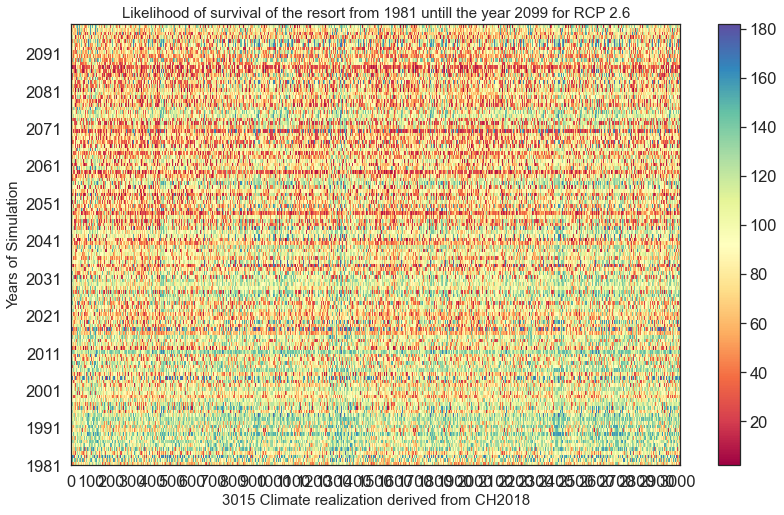

In [119]:
fig25, (ax3) = plt.subplots(1, 1, figsize=(12,7.5))

Z = list(df26_all_Matrix[:,1:].astype('float'))
#Z = 100*((np.random.rand(900, 118)).T)

c3 = ax3.pcolor(Z, cmap='Spectral')
cb3 = fig25.colorbar(c3)
ax3.set_title('default: no edges')

x_axis = np.arange(0, len(matrix_GoodDays26), step=100)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


plt.xticks(x_axis, x_axis)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)

ax3.set_xlabel("{} Climate realization derived from CH2018".format(len(matrix_GoodDays26)), fontsize=15)
ax3.set_ylabel("Years of Simulation", fontsize=15)
plt.title("Likelihood of survival of the resort from {} untill the year {} for RCP {}".format(1981, 2099, 2.6), fontsize=15)

fig25.tight_layout()
plt.show()

### Survival AMap CH2018 RCP4.5

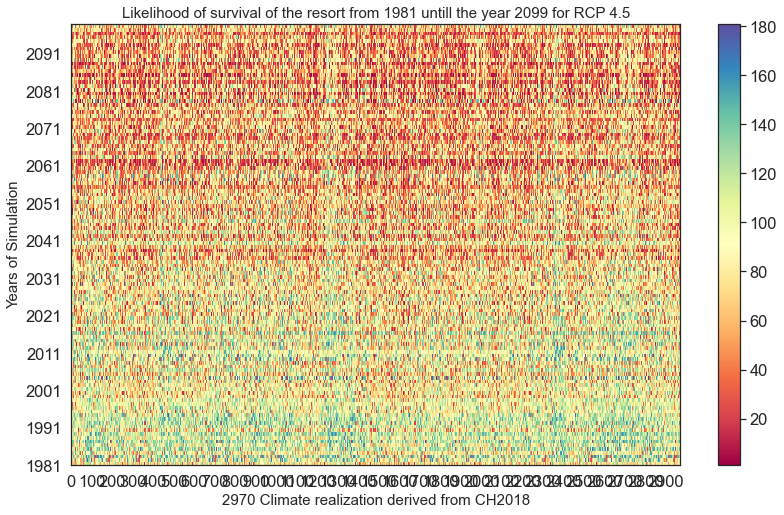

In [120]:
fig26, (ax3) = plt.subplots(1, 1, figsize=(12,7.5))

Z = list(df45_all_Matrix[:,1:].astype('float'))
#Z = 100*((np.random.rand(900, 118)).T)

#c3 = ax3.pcolor(Z)
c3 = ax3.pcolor(Z, cmap='Spectral')
cb3 = fig26.colorbar(c3)
ax3.set_title('default: no edges')

x_axis = np.arange(0, len(matrix_GoodDays45), step=100)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


plt.xticks(x_axis, x_axis)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)

ax3.set_xlabel("{} Climate realization derived from CH2018".format(len(matrix_GoodDays45)), fontsize=15)
ax3.set_ylabel("Years of Simulation", fontsize=15)
plt.title("Likelihood of survival of the resort from {} untill the year {} for RCP {}".format(1981, 2099, 4.5), fontsize=15)

fig26.tight_layout()
plt.show()

### Survival Map CH2018 RCP8.5

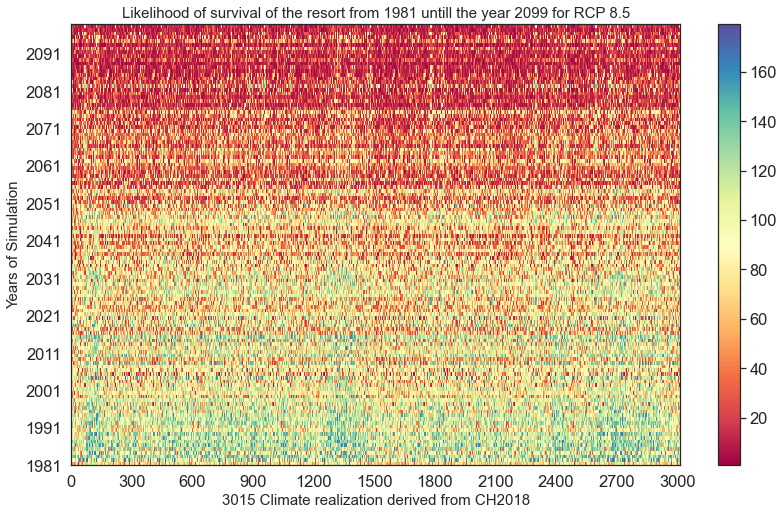

In [121]:
fig27, (ax3) = plt.subplots(1, 1, figsize=(12,7.5))

Z = list(df85_all_Matrix[:,1:].astype('float'))
#Z = 100*((np.random.rand(900, 118)).T)

#c3 = ax3.pcolor(Z)
c3 = ax3.pcolor(Z, cmap='Spectral')

cb3 = fig27.colorbar(c3)
ax3.set_title('default: no edges')

x_axis = np.arange(0, len(matrix_GoodDays85), step=300)
y_axis = np.arange(0, 118, step= 10)
y_axis_new = np.arange(1981, 2100, step= 10)


plt.xticks(x_axis, x_axis)
#plt.ylim(1981, 2100)
plt.yticks(y_axis, y_axis_new)

ax3.set_xlabel("{} Climate realization derived from CH2018".format(len(matrix_GoodDays85)), fontsize=15)
ax3.set_ylabel("Years of Simulation", fontsize=15)
plt.title("Likelihood of survival of the resort from {} untill the year {} for RCP {}".format(1981, 2099, 8.5), fontsize=15)

fig27.tight_layout()
plt.show()

## 3 years of not having good snow days in 10 years

### version 1: fixed threshold

In [122]:
def tipping_points_freq(df):
    """
    This function, calculates the frequency of tipping points for each individual resort
    """
    dfColumns= df.columns
    
    scenarios_length= len(dfColumns)
    simulations_Length = len(df[dfColumns[1]])
    tipping_freq = np.zeros(scenarios_length)
    
    for i in range (1, scenarios_length, 1):
        m = 0
        for j in range (1 , simulations_Length, 1):
            #df26_all[df26_allColumns[1]].iloc[0]
            if float(df[dfColumns[i]].iloc[j]) < 100.0:
                m += 1
                if m == 3:
                    tipping_freq[i] += 1
                    m = 0
            else:
                #if m >= 3:
                #if m == 3:
                    #tipping_freq[i] += 1
                m = 0
                continue    
                #break
    return tipping_freq

### version 2: dynamic threshold

In [123]:
def tipping_points_freq2(df2, threshold):
    """
    This function, calculates the frequency of tipping points for each individual resort
    """
    df2Columns= df2.columns
    
    scenarios_length= len(df2Columns)
    simulations_Length = len(df2[df2Columns[1]])
    tipping_freq = np.zeros(scenarios_length)
    
    for i in range (1, scenarios_length, 1):
        m = 0
        mm = 0
        for j in range (1 , simulations_Length, 1):
            #df26_all[df26_allColumns[1]].iloc[0]
            if float(df2[df2Columns[i]].iloc[j]) < threshold[i-1] -10:
                m += 1
                mm += 1
                if m == 3:
                    if mm <= 10:
                        tipping_freq[i] += 1
                        m = 0
                        mm = 0
                else:
                    if mm > 10:
                        m = 0
                        mm = 0
            else:
                #if m >= 3:
                #if m == 3:
                    #tipping_freq[i] += 1
                m = 0
                mm = 0
                continue    
                #break
    return tipping_freq

### version 3: Time rolling and policy selection added

In [124]:
def tipping_points_freq3(df3, threshold, beginningYear, endYear, policy, tippingpoint_threshold, scenario):
    """
    This function, calculates the frequency of tipping points for each individual resort
    """
    df3Columns= df3.columns
    
    scenarios_length= len(df3Columns)
    #simulations_Length = len(df3[df3Columns[1]])
    simulations_Length = endYear - beginningYear + 1
    statring_year = beginningYear - 1981 
    tipping_freq = np.zeros(scenarios_length)
    goodPolicy = []
    goodScenario = []
    goodTippingPoint = []
    
    for i in range (1, scenarios_length, 1):
        m = 0
        mm = 0
        for j in range (1 + statring_year, statring_year + simulations_Length + 1, 1):
            #df26_all[df26_allColumns[1]].iloc[0]
            mm += 1
            if float(df3[df3Columns[i]].iloc[j]) < threshold[i-1]:
                m += 1
                if m == 3:
                    if mm <= 10:
                        tipping_freq[i] += 1
                        m = 0
                        mm = 0
                else:
                    if mm > 10:
                        m = 0
                        mm = 0
            else:
                #if m >= 3:
                #if m == 3:
                    #tipping_freq[i] += 1
                if mm > 10:
                    m = 0
                    mm = 0
                #continue    
                #break
                
        if tipping_freq[i] < tippingpoint_threshold:
            goodPolicy.append(policy[i-1])
            goodScenario.append(scenario[i-1])
            goodTippingPoint.append(tipping_freq[i])
        else:
            continue
            
    return tipping_freq, goodTippingPoint, goodPolicy, goodScenario

In [125]:
df26_all.shape

(118, 3016)

In [126]:
filt_S26 = (df_final_ema['xRCP'] == 1)
thresholds_26 = df_final_ema.loc[filt_S26, 'xGoodDays']
thresholds_26_m = thresholds_26.to_numpy()
thresholds_26_pol = df_final_ema.loc[filt_S26, 'policy']
thresholds_26_pol_m = thresholds_26_pol.to_numpy()
thresholds_26_sce = df_final_ema.loc[filt_S26, 'scenario']
thresholds_26_sce_m = thresholds_26_sce.to_numpy()

filt_S45 = (df_final_ema['xRCP'] == 2)
thresholds_45 = df_final_ema.loc[filt_S45, 'xGoodDays']
thresholds_45_m = thresholds_45.to_numpy()
thresholds_45_pol = df_final_ema.loc[filt_S45, 'policy']
thresholds_45_pol_m = thresholds_45_pol.to_numpy()
thresholds_45_sce = df_final_ema.loc[filt_S45, 'scenario']
thresholds_45_sce_m = thresholds_45_sce.to_numpy()

filt_S85 = (df_final_ema['xRCP'] == 3)
thresholds_85 = df_final_ema.loc[filt_S85, 'xGoodDays']
thresholds_85_m = thresholds_85.to_numpy()
thresholds_85_pol = df_final_ema.loc[filt_S85, 'policy']
thresholds_85_pol_m = thresholds_85_pol.to_numpy()
thresholds_85_sce = df_final_ema.loc[filt_S85, 'scenario']
thresholds_85_sce_m = thresholds_85_sce.to_numpy()


In [127]:
type(df26_all)

pandas.core.frame.DataFrame

In [128]:
thresholds_85_sce_m

array([  1,   2,  10, ..., 187, 188, 192], dtype=int64)

In [129]:
thresholds_45_sce_m

array([  6,   8,  20, ..., 191, 197, 198], dtype=int64)

In [130]:
df26_allColumns = df26_all.columns

In [131]:
df26_all[df26_allColumns[1]].iloc[0]

'57.43433333333335'

In [132]:
df26_all.head()

,Season,sc_1_['isOverSnow_sc_Ver1_26_12'],sc_2_['isOverSnow_sc_Ver2_26_7'],sc_3_['isOverSnow_sc_Ver1_26_12'],sc_4_['isOverSnow_sc_Ver2_26_8'],sc_5_['isOverSnow_sc_Ver1_26_5'],sc_6_['isOverSnow_sc_Ver1_26_11'],sc_7_['isOverSnow_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_8_['isOverSnow_sc_Ver1_26_11'],sc_9_['isOverSnow_sc_Ver2_26_5'],sc_10_['isOverSnow_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_11_['isOverSnow_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_12_['isOverSnow_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_13_['isOverSnow_sc_Ver1_26_5'],sc_14_['isOverSnow_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_15_['isOverSnow_sc_Ver2_26_10'],sc_16_['isOverSnow_DMI-HIRHAM-ECEARTH-EUR11-RCP26-pcp'],sc_17_['isOverSnow_sc_Ver2_26_4'],sc_18_['isOverSnow_sc_Ver1_26_3'],sc_19_['isOverSnow_sc_Ver1_26_10'],sc_20_['isOverSnow_SMHI-RCA-ECEARTH-EUR11-RCP26-pcp'],sc_21_['isOverSnow_sc_Ver2_26_10'],sc_22_['isOverSnow_sc_Ver1_26_7'],sc_23_['isOverSnow_SMHI-RCA-NORESM-EUR44-RCP26-pcp'],sc_24_['isOverSnow_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_25_['isOverSnow_SMHI-RCA-ECEARTH-EUR44-RCP26-pcp'],sc_26_['isOverSnow_sc_Ver2_26_10'],sc_27_['isOverSnow_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_28_['isOverSnow_sc_Ver2_26_5'],sc_29_['isOverSnow_SMHI-RCA-NORESM-EUR44-RCP26-pcp'],sc_30_['isOverSnow_sc_Ver2_26_9'],sc_31_['isOverSnow_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_32_['isOverSnow_sc_Ver2_26_1'],sc_33_['isOverSnow_sc_Ver2_26_8'],...,sc_2982_['isOverSnow_SMHI-RCA-MIROC-EUR44-RCP26-pcp'],sc_2983_['isOverSnow_sc_Ver1_26_5'],sc_2984_['isOverSnow_sc_Ver2_26_2'],sc_2985_['isOverSnow_KNMI-RACMO-HADGEM-EUR44-RCP26-pcp'],sc_2986_['isOverSnow_sc_Ver1_26_6'],sc_2987_['isOverSnow_sc_Ver1_26_5'],sc_2988_['isOverSnow_sc_Ver1_26_7'],sc_2989_['isOverSnow_sc_Ver1_26_10'],sc_2990_['isOverSnow_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_2991_['isOverSnow_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_2992_['isOverSnow_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_2993_['isOverSnow_sc_Ver1_26_4'],sc_2994_['isOverSnow_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_2995_['isOverSnow_sc_Ver2_26_3'],sc_2996_['isOverSnow_sc_Ver2_26_10'],sc_2997_['isOverSnow_MPICSC-REMO1-MPIESM-EUR44-RCP26-pcp'],sc_2998_['isOverSnow_sc_Ver2_26_11'],sc_2999_['isOverSnow_SMHI-RCA-HADGEM-EUR44-RCP26-pcp'],sc_3000_['isOverSnow_sc_Ver1_26_3'],sc_3001_['isOverSnow_sc_Ver1_26_10'],sc_3002_['isOverSnow_sc_Ver2_26_3'],sc_3003_['isOverSnow_sc_Ver1_26_12'],sc_3004_['isOverSnow_sc_Ver1_26_11'],sc_3005_['isOverSnow_sc_Ver2_26_6'],sc_3006_['isOverSnow_MPICSC-REMO2-MPIESM-EUR11-RCP26-pcp'],sc_3007_['isOverSnow_SMHI-RCA-MPIESM-EUR44-RCP26-pcp'],sc_3008_['isOverSnow_sc_Ver1_26_2'],sc_3009_['isOverSnow_sc_Ver1_26_7'],sc_3010_['isOverSnow_MPICSC-REMO2-MPIESM-EUR44-RCP26-pcp'],sc_3011_['isOverSnow_MPICSC-REMO1-MPIESM-EUR11-RCP26-pcp'],sc_3012_['isOverSnow_sc_Ver1_26_11'],sc_3013_['isOverSnow_sc_Ver2_26_8'],sc_3014_['isOverSnow_sc_Ver1_26_10'],sc_3015_['isOverSnow_sc_Ver2_26_5']
0,1981-1982,57.43433333333335,76.88950000000006,47.531862068965516,49.01703448275866,42.37906896551724,56.87117241379309,78.79675862068966,64.17606896551726,42.14608333333335,60.524482758620714,67.33013793103444,120.40786206896549,46.650655172413806,45.34493103448275,124.75462068965518,75.06368965517244,64.65487500000002,28.12044827586207,116.67441379310351,72.83189655172418,129.90955172413794,107.11204166666668,103.91982758620688,57.31362068965517,93.53362068965517,130.77262068965518,102.32058620689651,54.180206896551724,118.57565517241378,70.73295833333336,78.68575862068967,33.08524137931035,55.5811724137931,...,118.81421428571429,48.88046428571429,75.35924999999999,106.64742857142863,115.65774999999998,68.6355714285714,62.383625,116.79200000000004,70.77271428571427,68.97021428571429,52.11917857142853,38.165142857142826,62.02807142857142,90.94535714285715,117.43117857142857,57.70400000000003,130.13296428571428,71.8855,47.265916666666634,87.54957142857147,84.50067857142855,47.393785714285706,71.4929642857143,93.69050000000003,80.30746428571427,38.142678571428576,52.57482142857142,69.60578571

In [133]:
thresholds_45_sce_m.shape

(2970,)

In [134]:
#print(thresholds_85.shape)
print(type(thresholds_85_m))
print(thresholds_85_m[1])
print(thresholds_85_pol_m[20])
print(thresholds_85_sce_m[20])

<class 'numpy.ndarray'>
60.0
0
55


In [135]:
T1RCP26 = tipping_points_freq(df26_all)
T1RCP45 = tipping_points_freq(df45_all)
T1RCP85 = tipping_points_freq(df85_all)

In [136]:
T1RCP26_m = tipping_points_freq2(df26_all, thresholds_26_m)
T1RCP45_m = tipping_points_freq2(df45_all, thresholds_45_m)
T1RCP85_m = tipping_points_freq2(df85_all, thresholds_85_m)

In [137]:
T1RCP26_m_3 , tipping26_3, scenario26_3, policy26_3= tipping_points_freq3(df26_all, thresholds_26_m, 1981, 2097, thresholds_26_pol_m, 10, thresholds_26_sce_m)
T1RCP45_m_3 , tipping45_3, scenario45_3, policy45_3= tipping_points_freq3(df45_all, thresholds_45_m, 1981, 2097, thresholds_45_pol_m, 10, thresholds_45_sce_m)
T1RCP85_m_3 , tipping85_3, scenario85_3, policy85_3= tipping_points_freq3(df85_all, thresholds_85_m, 1981, 2097, thresholds_85_pol_m, 10, thresholds_85_sce_m)

In [138]:
print(len( policy26_3))
print(len( policy45_3))
print(len( policy85_3))

882
319
29


In [139]:
print(len(scenario26_3))
print(len(scenario45_3))
print(len(scenario85_3))

882
319
29


In [140]:
print(len(tipping26_3))
print(len(tipping45_3))
print(len(tipping85_3))

882
319
29


In [141]:
print(len(T1RCP26_m_3))
print(len(T1RCP45_m_3))
print(len(T1RCP85_m_3))

3016
2971
3016


In [142]:
print(len(T1RCP26[1:]))
print(len(T1RCP45[1:]))
print(len(T1RCP85[1:]))

3015
2970
3015


In [143]:
type(T1RCP85)

numpy.ndarray

In [144]:
T1RCP85.shape

(3016,)

In [145]:
print(type(T1RCP85_m_3))
print(type(scenario85_3))
print(type(policy85_3))

<class 'numpy.ndarray'>
<class 'list'>
<class 'list'>


In [146]:
tipping26_3_df = pd.DataFrame(tipping26_3, columns =['tippingPoint26'])
tipping45_3_df = pd.DataFrame(tipping45_3, columns =['tippingPoint45'])
tipping85_3_df = pd.DataFrame(tipping85_3, columns =['tippingPoint85'])

scenario26_m_3 = pd.DataFrame(scenario26_3, columns =['Scenario26'])
scenario45_m_3 = pd.DataFrame(scenario45_3, columns =['Scenario45'])
scenario85_m_3 = pd.DataFrame(scenario85_3, columns =['Scenario85'])

policy26_m_3 = pd.DataFrame(policy26_3, columns =['Policy26'])
policy45_m_3 = pd.DataFrame(policy45_3, columns =['Policy45'])
policy85_m_3 = pd.DataFrame(policy85_3, columns =['Policy85'])

In [147]:
df_final_tipping_point = pd.concat((tipping26_3_df, scenario26_m_3, policy26_m_3, 
                                    tipping45_3_df, scenario45_m_3, policy45_m_3,
                                    tipping85_3_df, scenario85_m_3, policy85_m_3), axis = 1)

df_final_tipping_point.head(38)

,tippingPoint26,Scenario26,Policy26,tippingPoint45,Scenario45,Policy45,tippingPoint85,Scenario85,Policy85
0,5.0,0,0,3.0,0.0,29.0,8.0,0.0,160.0
1,4.0,0,3,3.0,0.0,40.0,9.0,1.0,156.0
2,9.0,0,4,3.0,0.0,47.0,8.0,1.0,157.0
3,3.0,0,12,3.0,0.0,62.0,9.0,1.0,162.0
4,4.0,0,14,5.0,0.0,67.0,4.0,1.0,173.0
5,3.0,0,19,8.0,0.0,72.0,9.0,1.0,178.0
6,2.0,0,22,8.0,0.0,130.0,8.0,7.0,94.0
7,7.0,0,31,8.0,0.0,140.0,8.0,7.0,151.0
8,7.0,0,35,9.0,0.0,149.0,8.0,8.0,126.0
9,7.0,0,39,6.0,0.0,168.0,7.0,8.0,173.0


### Specify the number of runs
for instance : number_Simulations = 9000

In [148]:
number_Simulations = 9000
x_axis = np.arange(1,number_Simulations + 2)

In [149]:
print("The lengthe of Y is: {}".format(len(T1RCP26[1:])))
print("The lengthe of X is: {}".format(len(matrix_GoodDays26) + 1 -1))
print('***')
print("The lengthe of Y is: {}".format(len(T1RCP45[1:])))
print("The lengthe of X is: {}".format((len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1) -(len(matrix_GoodDays26) + 1)))
print('***')
print("The lengthe of Y is: {}".format(len(T1RCP85[1:])))
print("The lengthe of X is: {}".format(number_Simulations+1 - (len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1)))

The lengthe of Y is: 3015
The lengthe of X is: 3015
***
The lengthe of Y is: 2970
The lengthe of X is: 2970
***
The lengthe of Y is: 3015
The lengthe of X is: 3015


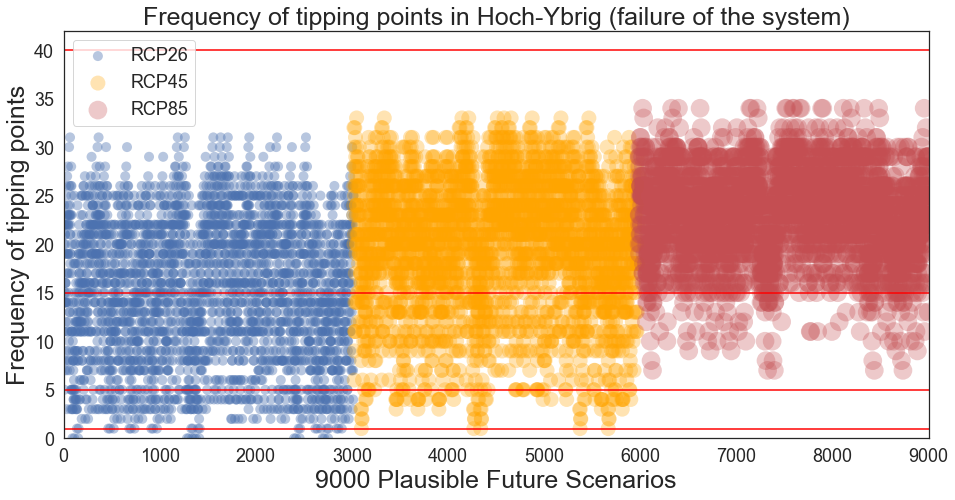

In [150]:
fig28, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (failure of the system)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency of tipping points", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =42)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=15, color='red')
ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig28.savefig(os.path.join(rootVisualization, 'tipping_point_All.svg'), format='svg', dpi=1200)
fig28.savefig(os.path.join(rootVisualization, 'tipping_point_All.tiff'), format='tiff', dpi=150)

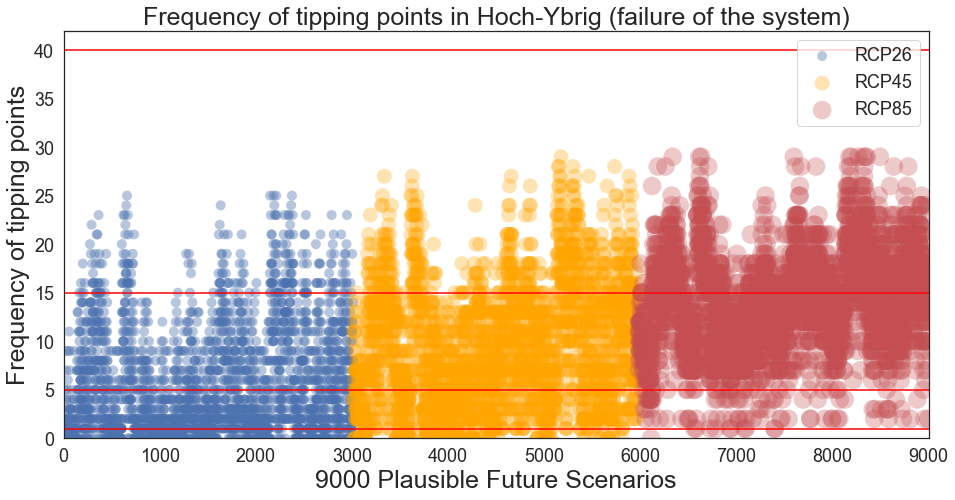

In [151]:
fig29, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26_m[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45_m[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85_m[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (failure of the system)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency of tipping points", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =42)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=15, color='red')
ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig29.savefig(os.path.join(rootVisualization, 'tipping_point_All_new.svg'), format='svg', dpi=1200)
fig29.savefig(os.path.join(rootVisualization, 'tipping_point_All_new.tiff'), format='tiff', dpi=150)

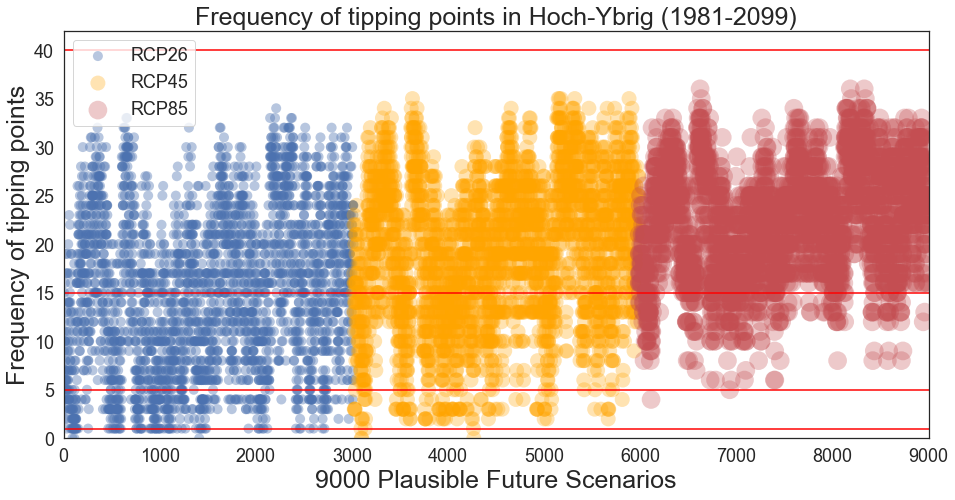

In [152]:
fig30, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26_m_3[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45_m_3[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85_m_3[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (1981-2099)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency of tipping points", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =42)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=15, color='red')
ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig30.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3.svg'), format='svg', dpi=1200)
fig30.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3.tiff'), format='tiff', dpi=150)

# Check the 45 policies

In [153]:
df_final_ema[filt_S]

,X2fM,X3iPot,X5temp,X6tempArt,Xfactor1,xClimateModel,xRCP,x1SnowThershold,xGoodDays,scenario,policy,model,Yout,Yout1,Yout3_0,Yout3_1,Yout3_2,Yout3_3,Yout3_4,Yout3_5,Yout3_6,Yout3_7,Yout3_8,Yout3_9,Yout3_10,Yout3_11,Yout3_12,Yout3_13,Yout3_14,Yout3_15,Yout3_16,Yout3_17,Yout3_18,Yout3_19,...,Yout3_88,Yout3_89,Yout3_90,Yout3_91,Yout3_92,Yout3_93,Yout3_94,Yout3_95,Yout3_96,Yout3_97,Yout3_98,Yout3_99,Yout3_100,Yout3_101,Yout3_102,Yout3_103,Yout3_104,Yout3_105,Yout3_106,Yout3_107,Yout3_108,Yout3_109,Yout3_110,Yout3_111,Yout3_112,Yout3_113,Yout3_114,Yout3_115,Yout3_116,Yout3_117,Yout4,Yout5,Yout6,Yout7
1,1.048662,983.739422,4.512921,-1.986318,3.361615,0.211326,3.0,240.0,60.0,1,0,UZHModel,61.198419,43,78.550958,97.613708,122.971208,57.137708,74.836292,150.873958,132.584083,72.326042,138.117458,106.412708,124.644500,111.342833,90.388375,127.449708,70.326500,30.078000,79.711333,118.376542,13.510167,96.918583,...,23.231125,72.185375,53.231583,8.054542,30.094625,70.569958,7.963500,18.296875,8.496833,1.968500,6.923167,38.354125,90.889208,111.300917,13.629833,14.802833,7.367167,7.293875,1.380083,6.197917,5.599417,3.865125,13.609250,3.093583,6.952542,6.507833,40.683750,7.895375,2.792167,14.920292,48.583814,2.578729,0.580181,12.0
201,1.048662,983.739422,4.512921,-1.986318,3.361615,0.211326,3.0,250.0,60.0,1,1,UZHModel,59.673561,43,75.408920,95.426080,121.712440,54.852200,71.842840,149.121480,132.061720,69.573960,135.091680,102.700680,123.768200,110.089120,86.953880,125.548720,67.968120,28.874880,78.256640,116.527000,12.969760,94.316680,...,22.301880,69.701640,51.205400,7.732360,28.890840,69.072840,7.644960,17.565000,8.156960,1.889760,6.646240,36.819960,90.451640,109.525640,13.084640,14.210720,7.072480,7.002120,1.324880,5.950000,5.375440,3.710520,13.064880,2.969840,6.674440,6.247520,39.056400,7.579560,2.680480,14.323480,48.583814,2.456441,0.574249,12.0
401,1.048662,983.739422,4.512921,-1.986318,3.361615,0.211326,3.0,260.0,90.0,1,2,UZHModel,58.184003,43,72.508577,93.277077,120.438462,52.742500,69.079654,147.440000,131.455885,67.013423,132.269269,99.199192,122.789885,108.892654,83.662731,123.557346,65.567654,27.764308,76.692692,113.959808,12.470923,91.755385,...,21.444115,67.335808,49.248885,7.434962,27.779654,67.392654,7.350923,16.889423,7.843231,1.817077,6.390615,35.403808,89.824500,107.722654,12.581385,13.664154,6.800462,6.732808,1.273923,5.721154,5.168692,3.567808,12.562385,2.855615,6.417731,6.007231,37.554231,7.288038,2.577385,13.772577,48.583814,2.337627,0.494353,19.0
601,1.048662,983.739422,4.512921,-1.986318,3.361615,0.211326,3.0,250.0,80.0,1,3,UZHModel,59.673561,43,75.408920,95.426080,121.712440,54.852200,71.842840,149.121480,132.061720,69.573960,135.091680,102.700680,123.768200,110.089120,86.953880,125.548720,67.968120,28.874880,78.256640,116.527000,12.969760,94.316680,...,22.301880,69.701640,51.205400,7.732360,28.890840,69.072840,7.644960,17.565000,8.156960,1.889760,6.646240,36.819960,90.451640,109.525640,13.084640,14.210720,7.072480,7.002120,1.324880,5.950000,5.375440,3.710520,13.064880,2.969840,6.674440,6.247520,39.056400,7.579560,2.680480,14.323480,48.583814,2.456441,0.526515,16.0
801,1.048662,983.739422,4.512921,-1.986318,3.361615,0.211326,3.0,280.0,90.0,1,4,UZHModel,55.327725,43,67.329393,88.027179,117.990857,48.975179,64.145393,144.298107,130.231500,62.358036,127.087214,92.397607,120.558250,106.575679,77.704536,119.593179,60.923607,25.781143,73.502036,109.136321,11.580143,86.742964,...,19.912393,62.747179,45.731107,6.903893,25.795393,64.125750,6.825857,15.683036,7.283000,1.687286,5.934143,32.874964,88.296179,104.076750,11.682714,12.688143,6.314714,6.251893,1.182929,5.312500,4.799500,3.312964,11.665071,2.651643,5.959321,5.578143,34.871786,6.767464,2.393286,12.788821,48.583814,2.093559,0.478083,20.0
1001,1.048662,983.739422,4.512921,-1.986318,3.361615,0.211326,3.0,290.0,90.0,1,5,UZHModel,53.954053,43,65.007690,85.024655,116.853241,47.286379,61.933483,142.796034,129.597517,60.225000,124.706517,89.211483,119.461103,105.417897,75.0250

In [214]:
df_final_ema[filt_S].to_csv(os.path.join(rootVisualization, 'df_policies.csv'), index = False)

In [154]:
T1RCP26_m_3_1980 , tipping26_3_1980, scenario26_3_1980, policy26_3_1980= tipping_points_freq3(df26_all, thresholds_26_m, 1981, 2010, thresholds_26_pol_m, 30, thresholds_26_sce_m)
T1RCP45_m_3_1980 , tipping45_3_1980, scenario45_3_1980, policy45_3_1980= tipping_points_freq3(df45_all, thresholds_45_m, 1981, 2010, thresholds_45_pol_m, 30, thresholds_45_sce_m)
T1RCP85_m_3_1980 , tipping85_3_1980, scenario85_3_1980, policy85_3_1980= tipping_points_freq3(df85_all, thresholds_85_m, 1981, 2010, thresholds_85_pol_m, 30, thresholds_85_sce_m)

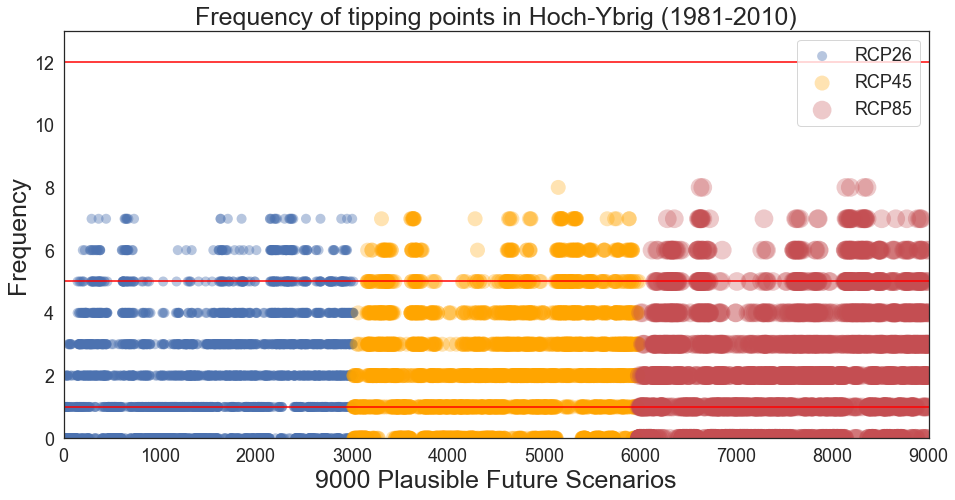

In [155]:
fig31, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26_m_3_1980[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45_m_3_1980[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85_m_3_1980[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (1981-2010)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =13)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=12, color='red')
#ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig31.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_1981.svg'), format='svg', dpi=600)
fig31.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_1981.tiff'), format='tiff', dpi=150)

In [156]:
type(T1RCP85_m_3_1980)

numpy.ndarray

In [157]:
T1RCP26_m_3_1980_df = pd.DataFrame(T1RCP26_m_3_1980, columns =['tippingPoint26_1980'])
tipping26_3_1980_df = pd.DataFrame(tipping26_3_1980, columns =['tippingPoint26_1_1980'])
scenario26_3_1980_df = pd.DataFrame(scenario26_3_1980, columns =['scenario26_1980'])
policy26_3_1980_df = pd.DataFrame(policy26_3_1980, columns =['policy26_1980'])

T1RCP45_m_3_1980_df = pd.DataFrame(T1RCP45_m_3_1980, columns =['tippingPoint45_1980'])
tipping45_3_1980_df = pd.DataFrame(tipping45_3_1980, columns =['tippingPoint45_1_1980'])
scenario45_3_1980_df = pd.DataFrame(scenario45_3_1980, columns =['scenario45_1980'])
policy45_3_1980_df = pd.DataFrame(policy45_3_1980, columns =['policy45_1980'])

T1RCP85_m_3_1980_df = pd.DataFrame(T1RCP85_m_3_1980, columns =['tippingPoint85_1980'])
tipping85_3_1980_df = pd.DataFrame(tipping85_3_1980, columns =['tippingPoint85_1_1980'])
scenario85_3_1980_df = pd.DataFrame(scenario85_3_1980, columns =['scenario85_1980'])
policy85_3_1980_df = pd.DataFrame(policy85_3_1980, columns =['policy85_1980'])

In [215]:
df_final_tipping_point_1980 = pd.concat((T1RCP26_m_3_1980_df, tipping26_3_1980_df, scenario26_3_1980_df, policy26_3_1980_df,
                                         T1RCP45_m_3_1980_df, tipping45_3_1980_df, scenario45_3_1980_df, policy45_3_1980_df,
                                         T1RCP85_m_3_1980_df, tipping85_3_1980_df, scenario85_3_1980_df, policy85_3_1980_df), axis = 1)
df_final_tipping_point_1980.to_csv(os.path.join(rootVisualization, 'df_final_tipping_point_1980.csv'), index = False)

In [159]:
print(T1RCP26_m_3_1980_df['tippingPoint26_1980'].value_counts())
print(T1RCP45_m_3_1980_df['tippingPoint45_1980'].value_counts())
print(T1RCP85_m_3_1980_df['tippingPoint85_1980'].value_counts())

0.0    871
1.0    540
2.0    483
3.0    478
4.0    294
5.0    198
6.0    119
7.0     33
Name: tippingPoint26_1980, dtype: int64
0.0    724
1.0    590
2.0    526
3.0    435
4.0    344
5.0    181
6.0    125
7.0     45
8.0      1
Name: tippingPoint45_1980, dtype: int64
0.0    700
1.0    640
2.0    532
3.0    410
4.0    305
5.0    249
6.0    125
7.0     49
8.0      6
Name: tippingPoint85_1980, dtype: int64


In [160]:
print(tipping26_3_1980_df['tippingPoint26_1_1980'].value_counts())
print(tipping45_3_1980_df['tippingPoint45_1_1980'].value_counts())
print(tipping85_3_1980_df['tippingPoint85_1_1980'].value_counts())

0.0    870
1.0    540
2.0    483
3.0    478
4.0    294
5.0    198
6.0    119
7.0     33
Name: tippingPoint26_1_1980, dtype: int64
0.0    723
1.0    590
2.0    526
3.0    435
4.0    344
5.0    181
6.0    125
7.0     45
8.0      1
Name: tippingPoint45_1_1980, dtype: int64
0.0    699
1.0    640
2.0    532
3.0    410
4.0    305
5.0    249
6.0    125
7.0     49
8.0      6
Name: tippingPoint85_1_1980, dtype: int64


In [161]:
print(scenario26_3_1980_df['scenario26_1980'].value_counts())
print(scenario45_3_1980_df['scenario45_1980'].value_counts())
print(scenario85_3_1980_df['scenario85_1980'].value_counts())

43    67
42    67
38    67
36    67
34    67
32    67
30    67
28    67
26    67
24    67
22    67
20    67
18    67
16    67
14    67
12    67
10    67
8     67
6     67
4     67
2     67
40    67
44    67
41    67
1     67
39    67
37    67
35    67
33    67
31    67
29    67
27    67
25    67
23    67
21    67
19    67
17    67
15    67
13    67
11    67
9     67
7     67
5     67
3     67
0     67
Name: scenario26_1980, dtype: int64
43    66
42    66
38    66
36    66
34    66
32    66
30    66
28    66
26    66
24    66
22    66
20    66
18    66
16    66
14    66
12    66
10    66
8     66
6     66
4     66
2     66
40    66
44    66
41    66
1     66
39    66
37    66
35    66
33    66
31    66
29    66
27    66
25    66
23    66
21    66
19    66
17    66
15    66
13    66
11    66
9     66
7     66
5     66
3     66
0     66
Name: scenario45_1980, dtype: int64
43    67
42    67
38    67
36    67
34    67
32    67
30    67
28    67
26    67
24    67
22    67
20    67
18    67
1

In [162]:
print(policy26_3_1980_df['policy26_1980'].value_counts())
print(policy45_3_1980_df['policy45_1980'].value_counts())
print(policy85_3_1980_df['policy85_1980'].value_counts())

199    45
100    45
154    45
152    45
144    45
138    45
136    45
134    45
132    45
128    45
124    45
120    45
116    45
114    45
110    45
104    45
92     45
184    45
88     45
76     45
60     45
58     45
50     45
48     45
46     45
34     45
28     45
24     45
22     45
14     45
12     45
4      45
166    45
194    45
195    45
103    45
193    45
179    45
165    45
159    45
155    45
153    45
147    45
127    45
123    45
119    45
113    45
111    45
109    45
107    45
101    45
196    45
99     45
95     45
79     45
65     45
61     45
39     45
35     45
31     45
19     45
13     45
9      45
7      45
5      45
3      45
0      45
Name: policy26_1980, dtype: int64
197    45
82     45
170    45
168    45
150    45
142    45
140    45
130    45
122    45
118    45
112    45
108    45
102    45
96     45
90     45
84     45
80     45
191    45
78     45
74     45
72     45
70     45
68     45
64     45
62     45
44     45
40     45
38     45
30     45
26    

In [163]:
T1RCP26_m_3_2020 , tipping26_3_2020, scenario26_3_2020, policy26_3_2020= tipping_points_freq3(df26_all, thresholds_26_m, 2020, 2049, thresholds_26_pol_m, 5, thresholds_26_sce_m)
T1RCP45_m_3_2020 , tipping45_3_2020, scenario45_3_2020, policy45_3_2020= tipping_points_freq3(df45_all, thresholds_45_m, 2020, 2049, thresholds_45_pol_m, 5, thresholds_45_sce_m)
T1RCP85_m_3_2020 , tipping85_3_2020, scenario85_3_2020, policy85_3_2020= tipping_points_freq3(df85_all, thresholds_85_m, 2020, 2049, thresholds_85_pol_m, 5, thresholds_85_sce_m)

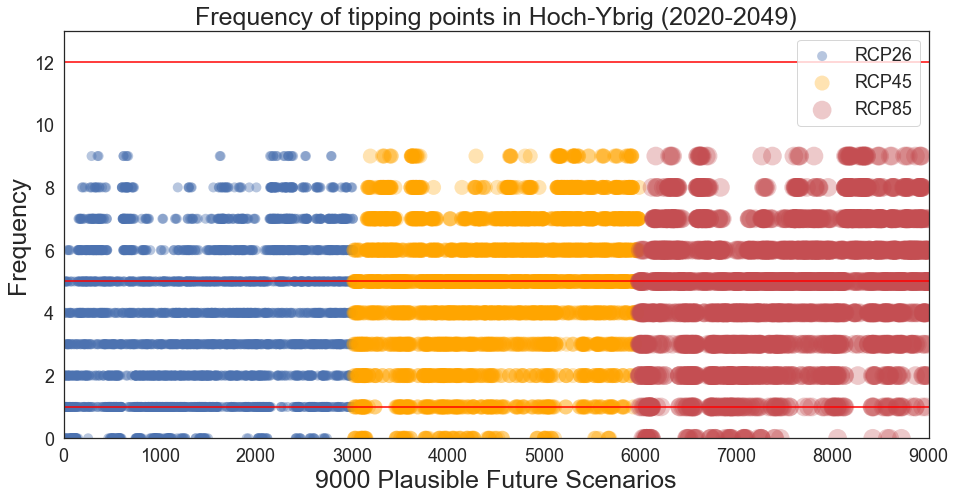

In [164]:
fig32, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26_m_3_2020[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45_m_3_2020[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85_m_3_2020[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (2020-2049)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =13)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=12, color='red')
#ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig32.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_2020.svg'), format='svg', dpi=600)
fig32.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_2020.tiff'), format='tiff', dpi=150)

In [165]:
T1RCP26_m_3_2020_df = pd.DataFrame(T1RCP26_m_3_2020, columns =['tippingPoint26_2020'])
tipping26_3_2020_df = pd.DataFrame(tipping26_3_2020, columns =['tippingPoint26_1_2020'])
scenario26_3_2020_df = pd.DataFrame(scenario26_3_2020, columns =['scenario26_2020'])
policy26_3_2020_df = pd.DataFrame(policy26_3_2020, columns =['policy26_2020'])

T1RCP45_m_3_2020_df = pd.DataFrame(T1RCP45_m_3_2020, columns =['tippingPoint45_2020'])
tipping45_3_2020_df = pd.DataFrame(tipping45_3_2020, columns =['tippingPoint45_1_2020'])
scenario45_3_2020_df = pd.DataFrame(scenario45_3_2020, columns =['scenario45_2020'])
policy45_3_2020_df = pd.DataFrame(policy45_3_2020, columns =['policy45_2020'])

T1RCP85_m_3_2020_df = pd.DataFrame(T1RCP85_m_3_2020, columns =['tippingPoint85_2020'])
tipping85_3_2020_df = pd.DataFrame(tipping85_3_2020, columns =['tippingPoint85_1_2020'])
scenario85_3_2020_df = pd.DataFrame(scenario85_3_2020, columns =['scenario85_2020'])
policy85_3_2020_df = pd.DataFrame(policy85_3_2020, columns =['policy85_2020'])

In [216]:
df_final_tipping_point_2020 = pd.concat((T1RCP26_m_3_2020_df, tipping26_3_2020_df, scenario26_3_2020_df, policy26_3_2020_df,
                                         T1RCP45_m_3_2020_df, tipping45_3_2020_df, scenario45_3_2020_df, policy45_3_2020_df,
                                         T1RCP85_m_3_2020_df, tipping85_3_2020_df, scenario85_3_2020_df, policy85_3_2020_df), axis = 1)
df_final_tipping_point_2020.to_csv(os.path.join(rootVisualization, 'df_final_tipping_point_2020.csv'), index = False)

In [167]:
print(T1RCP26_m_3_2020_df['tippingPoint26_2020'].value_counts())
print(T1RCP45_m_3_2020_df['tippingPoint45_2020'].value_counts())
print(T1RCP85_m_3_2020_df['tippingPoint85_2020'].value_counts())

1.0    491
5.0    402
2.0    394
3.0    392
6.0    351
4.0    342
7.0    272
0.0    201
8.0    143
9.0     28
Name: tippingPoint26_2020, dtype: int64
5.0    488
7.0    478
6.0    466
4.0    357
3.0    297
8.0    247
1.0    228
2.0    227
0.0    102
9.0     81
Name: tippingPoint45_2020, dtype: int64
6.0    564
5.0    550
7.0    421
4.0    391
3.0    347
2.0    261
8.0    192
1.0    165
9.0     63
0.0     62
Name: tippingPoint85_2020, dtype: int64


In [168]:
print(tipping26_3_2020_df['tippingPoint26_1_2020'].value_counts())
print(tipping45_3_2020_df['tippingPoint45_1_2020'].value_counts())
print(tipping85_3_2020_df['tippingPoint85_1_2020'].value_counts())

1.0    491
2.0    394
3.0    392
4.0    342
0.0    200
Name: tippingPoint26_1_2020, dtype: int64
4.0    357
3.0    297
1.0    228
2.0    227
0.0    101
Name: tippingPoint45_1_2020, dtype: int64
4.0    391
3.0    347
2.0    261
1.0    165
0.0     61
Name: tippingPoint85_1_2020, dtype: int64


In [169]:
print(scenario26_3_2020_df['scenario26_2020'].value_counts())
print(scenario45_3_2020_df['scenario45_2020'].value_counts())
print(scenario85_3_2020_df['scenario85_2020'].value_counts())

1     64
11    63
14    62
16    62
21    60
7     60
8     60
30    58
0     57
38    56
18    56
13    56
40    54
31    51
15    50
20    50
36    48
23    46
17    46
22    46
28    46
29    45
26    42
6     41
12    40
42    39
3     39
44    38
2     34
25    33
19    31
39    28
27    27
10    27
33    27
41    23
35    22
37    20
5     20
4     19
43    18
24    17
9     14
34    14
32    10
Name: scenario26_2020, dtype: int64
1     63
11    55
14    53
8     53
16    49
7     48
30    48
21    48
18    47
38    43
13    43
0     42
40    42
15    38
36    38
31    33
20    29
28    27
6     27
22    26
29    26
17    25
23    25
3     24
26    24
12    23
44    20
25    19
42    17
2     16
19    15
10    13
39    12
27    11
33    11
35    11
41    11
4      9
43     9
24     9
5      8
37     8
34     6
32     4
9      2
Name: scenario45_2020, dtype: int64
1     66
11    64
8     61
14    59
21    57
30    56
16    56
7     54
13    53
18    49
38    49
0     48
40    45
1

In [170]:
print(policy26_3_2020_df['policy26_2020'].value_counts())
print(policy45_3_2020_df['policy45_2020'].value_counts())
print(policy85_3_2020_df['policy85_2020'].value_counts())

154    35
5      33
0      32
196    32
50     32
155    31
103    31
48     31
144    31
134    31
193    31
28     30
39     30
61     30
46     30
124    30
120    30
100    29
95     29
128    29
119    28
101    28
79     28
58     28
7      28
13     28
14     28
132    28
99     28
136    28
166    28
147    28
31     28
60     27
76     27
3      27
22     27
199    27
109    27
138    27
165    27
194    26
113    26
159    26
12     26
19     26
110    26
114    25
116    25
111    25
153    25
24     25
107    25
127    24
9      24
179    24
4      23
195    23
104    23
152    23
92     23
35     23
65     22
88     22
34     22
184    20
123    20
Name: policy26_2020, dtype: int64
181    26
21     24
90     24
51     21
149    21
75     21
172    21
81     21
122    21
129    21
143    21
44     20
64     20
67     20
68     20
72     20
82     20
6      20
182    20
189    20
108    19
112    19
80     19
170    19
33     19
96     19
102    19
74     19
142    19
30    

In [171]:
T1RCP26_m_3_2050 , tipping26_3_2050, scenario26_3_2050, policy26_3_2050= tipping_points_freq3(df26_all, thresholds_26_m, 2050, 2079, thresholds_26_pol_m, 5, thresholds_26_sce_m)
T1RCP45_m_3_2050 , tipping45_3_2050, scenario45_3_2050, policy45_3_2050= tipping_points_freq3(df45_all, thresholds_45_m, 2050, 2079, thresholds_45_pol_m, 5, thresholds_45_sce_m)
T1RCP85_m_3_2050 , tipping85_3_2050, scenario85_3_2050, policy85_3_2050= tipping_points_freq3(df85_all, thresholds_85_m, 2050, 2079, thresholds_85_pol_m, 5, thresholds_85_sce_m)

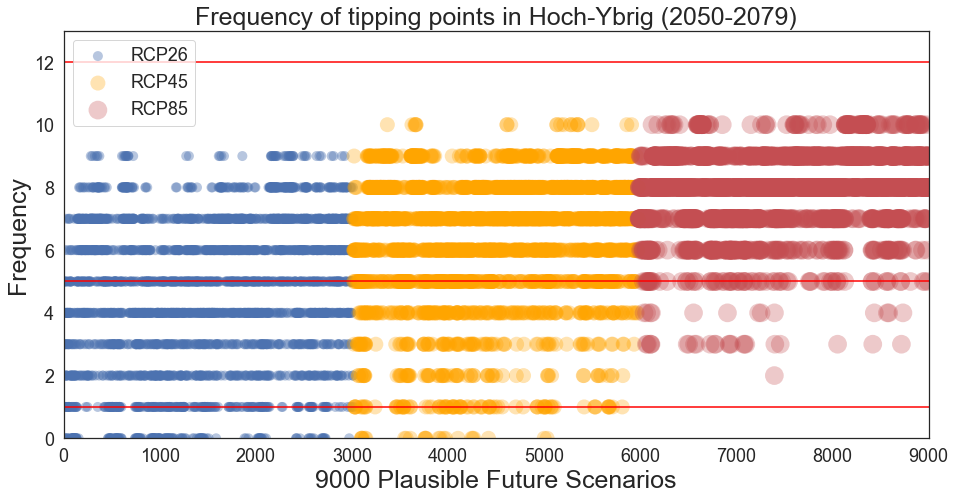

In [172]:
fig33, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26_m_3_2050[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45_m_3_2050[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85_m_3_2050[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (2050-2079)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =13)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=12, color='red')
#ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig33.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_2050.svg'), format='svg', dpi=600)
fig33.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_2050.tiff'), format='tiff', dpi=150)

In [173]:
T1RCP26_m_3_2050_df = pd.DataFrame(T1RCP26_m_3_2050, columns =['tippingPoint26_2050'])
tipping26_3_2050_df = pd.DataFrame(tipping26_3_2050, columns =['tippingPoint26_1_2050'])
scenario26_3_2050_df = pd.DataFrame(scenario26_3_2050, columns =['scenario26_2050'])
policy26_3_2050_df = pd.DataFrame(policy26_3_2050, columns =['policy26_2050'])

T1RCP45_m_3_2050_df = pd.DataFrame(T1RCP45_m_3_2050, columns =['tippingPoint45_2050'])
tipping45_3_2050_df = pd.DataFrame(tipping45_3_2050, columns =['tippingPoint45_1_2050'])
scenario45_3_2050_df = pd.DataFrame(scenario45_3_2050, columns =['scenario45_2050'])
policy45_3_2050_df = pd.DataFrame(policy45_3_2050, columns =['policy45_2050'])

T1RCP85_m_3_2050_df = pd.DataFrame(T1RCP85_m_3_2050, columns =['tippingPoint85_2050'])
tipping85_3_2050_df = pd.DataFrame(tipping85_3_2050, columns =['tippingPoint85_1_2050'])
scenario85_3_2050_df = pd.DataFrame(scenario85_3_2050, columns =['scenario85_2050'])
policy85_3_2050_df = pd.DataFrame(policy85_3_2050, columns =['policy85_2050'])

In [217]:
df_final_tipping_point_2050 = pd.concat((T1RCP26_m_3_2050_df, tipping26_3_2050_df, scenario26_3_2050_df, policy26_3_2050_df,
                                         T1RCP45_m_3_2050_df, tipping45_3_2050_df, scenario45_3_2050_df, policy45_3_2050_df,
                                         T1RCP85_m_3_2050_df, tipping85_3_2050_df, scenario85_3_2050_df, policy85_3_2050_df), axis = 1)
df_final_tipping_point_2050.to_csv(os.path.join(rootVisualization, 'df_final_tipping_point_2050.csv'), index = False)

In [175]:
print(T1RCP26_m_3_2050_df['tippingPoint26_2050'].value_counts())
print(T1RCP45_m_3_2050_df['tippingPoint45_2050'].value_counts())
print(T1RCP85_m_3_2050_df['tippingPoint85_2050'].value_counts())

7.0    514
4.0    461
6.0    431
5.0    403
2.0    259
3.0    244
8.0    238
1.0    229
0.0    180
9.0     57
Name: tippingPoint26_2050, dtype: int64
7.0     643
8.0     593
6.0     485
9.0     410
5.0     328
4.0     199
3.0     101
1.0      92
2.0      73
0.0      25
10.0     22
Name: tippingPoint45_2050, dtype: int64
9.0     1012
8.0     1005
7.0      525
6.0      216
10.0     141
5.0       79
3.0       23
4.0       13
2.0        1
0.0        1
Name: tippingPoint85_2050, dtype: int64


In [176]:
print(tipping26_3_2050_df['tippingPoint26_1_2050'].value_counts())
print(tipping45_3_2050_df['tippingPoint45_1_2050'].value_counts())
print(tipping85_3_2050_df['tippingPoint85_1_2050'].value_counts())

4.0    461
2.0    259
3.0    244
1.0    229
0.0    179
Name: tippingPoint26_1_2050, dtype: int64
4.0    199
3.0    101
1.0     92
2.0     73
0.0     24
Name: tippingPoint45_1_2050, dtype: int64
3.0    23
4.0    13
2.0     1
Name: tippingPoint85_1_2050, dtype: int64


In [177]:
print(scenario26_3_2050_df['scenario26_2050'].value_counts())
print(scenario45_3_2050_df['scenario45_2050'].value_counts())
print(scenario85_3_2050_df['scenario85_2050'].value_counts())

11    61
14    59
1     57
21    56
16    54
8     52
30    52
0     51
7     51
40    51
18    49
38    47
13    44
36    41
15    39
31    39
22    35
23    34
28    33
29    31
17    31
20    29
12    28
3     27
26    27
6     25
42    23
44    22
19    19
2     19
25    19
33    18
10    17
39    17
27    15
41    13
37    12
4     12
24    12
43    11
5     10
35    10
9      7
34     7
32     6
Name: scenario26_2050, dtype: int64
1     40
11    32
14    29
8     27
16    27
21    21
18    20
30    19
7     19
40    17
36    15
13    14
0     14
15    13
38    13
31    13
17    10
23    10
22    10
20    10
6      9
28     9
42     8
3      8
12     8
29     8
25     8
26     8
19     6
35     6
33     5
2      5
44     5
10     4
39     4
4      3
37     2
43     2
24     2
41     2
5      2
27     2
Name: scenario45_2050, dtype: int64
1     8
21    4
16    3
14    3
11    3
8     3
40    2
38    2
36    2
18    2
7     2
30    1
13    1
0     1
Name: scenario85_2050, dtype: int

In [178]:
print(policy26_3_2050_df['policy26_2050'].value_counts())
print(policy45_3_2050_df['policy45_2050'].value_counts())
print(policy85_3_2050_df['policy85_2050'].value_counts())

196    26
5      26
103    26
39     26
193    25
22     25
48     24
113    24
114    24
119    24
138    24
0      24
14     24
92     23
147    23
24     23
79     23
132    23
128    23
58     23
99     22
166    22
101    22
154    22
95     22
107    22
144    22
61     21
28     21
13     21
104    21
136    21
111    21
134    21
9      20
155    20
100    20
110    20
124    20
127    20
50     20
31     19
19     19
194    19
46     19
165    19
76     19
123    19
4      19
3      19
159    19
152    18
34     18
195    17
179    17
199    17
88     17
120    17
116    17
35     16
60     16
153    15
12     15
65     15
7      15
109    15
184    13
Name: policy26_2050, dtype: int64
189    13
172    13
186    11
142    11
150    10
161    10
21     10
72     10
180    10
75     10
78     10
80      9
102     9
198     9
44      9
20      9
74      9
90      9
168     9
191     9
190     9
81      8
38      8
62      8
33      8
64      8
29      8
130     8
133     8
8     

In [179]:
T1RCP26_m_3_2070 , tipping26_3_2070, scenario26_3_2070, policy26_3_2070= tipping_points_freq3(df26_all, thresholds_26_m, 2070, 2097, thresholds_26_pol_m, 5, thresholds_26_sce_m)
T1RCP45_m_3_2070 , tipping45_3_2070, scenario45_3_2070, policy45_3_2070= tipping_points_freq3(df45_all, thresholds_45_m, 2070, 2097, thresholds_45_pol_m, 5, thresholds_45_sce_m)
T1RCP85_m_3_2070 , tipping85_3_2070, scenario85_3_2070, policy85_3_2070= tipping_points_freq3(df85_all, thresholds_85_m, 2070, 2097, thresholds_85_pol_m, 5, thresholds_85_sce_m)

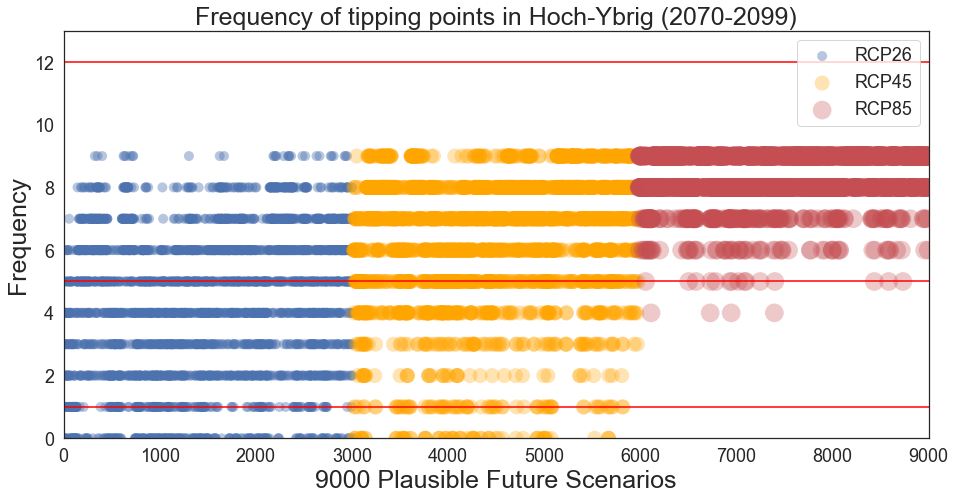

In [180]:
fig34, ax1 = plt.subplots(figsize=(15.5,7.5))
ax1.scatter(x_axis[1:(len(matrix_GoodDays26) + 1)], T1RCP26_m_3_2070[1:], s = 100, c='b' , marker='o', alpha=0.4, cmap='viridis', 
           edgecolors='none', label='RCP26')

ax1.scatter(x_axis[len(matrix_GoodDays26) + 1 : len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1], T1RCP45_m_3_2070[1:], s = 225, c='orange' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP45')

ax1.scatter(x_axis[len(matrix_GoodDays26) + len(matrix_GoodDays45) + 1 : number_Simulations+1], T1RCP85_m_3_2070[1:], s = 350, c='r' , marker='o', alpha=0.3, cmap='viridis', 
           edgecolors='none', label='RCP85')


ax1.set_title("Frequency of tipping points in {} (2070-2099)".format(title_Figs2), fontsize=25)
ax1.set_ylabel("Frequency", fontsize=25)
ax1.set_xlabel("9000 Plausible Future Scenarios", fontsize=25)
ax1.set_ylim(bottom=0, top =13)
ax1.set_xlim(left=0, right =9000)
ax1.axhline(y=1, color='red')
ax1.axhline(y=5, color='red')
ax1.axhline(y=12, color='red')
#ax1.axhline(y=40, color='red')
plt.yticks(fontsize=18)
plt.xticks(fontsize=18)

ax1.legend(fontsize=18)


fig34.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_2070.svg'), format='svg', dpi=600)
fig34.savefig(os.path.join(rootVisualization, 'tipping_point_All_new_3_2070.tiff'), format='tiff', dpi=150)

In [181]:
T1RCP26_m_3_2070_df = pd.DataFrame(T1RCP26_m_3_2070, columns =['tippingPoint26_2070'])
tipping26_3_2070_df = pd.DataFrame(tipping26_3_2070, columns =['tippingPoint26_1_2070'])
scenario26_3_2070_df = pd.DataFrame(scenario26_3_2070, columns =['scenario26_2070'])
policy26_3_2070_df = pd.DataFrame(policy26_3_2070, columns =['policy26_2070'])

T1RCP45_m_3_2070_df = pd.DataFrame(T1RCP45_m_3_2070, columns =['tippingPoint45_2070'])
tipping45_3_2070_df = pd.DataFrame(tipping45_3_2070, columns =['tippingPoint45_1_2070'])
scenario45_3_2070_df = pd.DataFrame(scenario45_3_2070, columns =['scenario45_2070'])
policy45_3_2070_df = pd.DataFrame(policy45_3_2070, columns =['policy45_2070'])

T1RCP85_m_3_2070_df = pd.DataFrame(T1RCP85_m_3_2070, columns =['tippingPoint85_2070'])
tipping85_3_2070_df = pd.DataFrame(tipping85_3_2070, columns =['tippingPoint85_1_2070'])
scenario85_3_2070_df = pd.DataFrame(scenario85_3_2070, columns =['scenario85_2070'])
policy85_3_2070_df = pd.DataFrame(policy85_3_2070, columns =['policy85_2070'])

In [218]:
df_final_tipping_point_2070 = pd.concat((T1RCP26_m_3_2070_df, tipping26_3_2070_df, scenario26_3_2070_df, policy26_3_2070_df,
                                         T1RCP45_m_3_2070_df, tipping45_3_2070_df, scenario45_3_2070_df, policy45_3_2070_df,
                                         T1RCP85_m_3_2070_df, tipping85_3_2070_df, scenario85_3_2070_df, policy85_3_2070_df), axis = 1)
df_final_tipping_point_2070.to_csv(os.path.join(rootVisualization, 'df_final_tipping_point_2070.csv'), index = False)

In [183]:
print(T1RCP26_m_3_2070_df['tippingPoint26_2070'].value_counts())
print(T1RCP45_m_3_2070_df['tippingPoint45_2070'].value_counts())
print(T1RCP85_m_3_2070_df['tippingPoint85_2070'].value_counts())

6.0    527
5.0    414
4.0    399
7.0    391
2.0    348
3.0    280
0.0    224
1.0    214
8.0    188
9.0     31
Name: tippingPoint26_2070, dtype: int64
8.0    745
7.0    670
6.0    443
5.0    314
9.0    298
4.0    218
3.0     97
1.0     76
0.0     69
2.0     41
Name: tippingPoint45_2070, dtype: int64
9.0    1671
8.0    1068
7.0     191
6.0      66
5.0      15
4.0       4
0.0       1
Name: tippingPoint85_2070, dtype: int64


In [184]:
print(tipping26_3_2070_df['tippingPoint26_1_2070'].value_counts())
print(tipping45_3_2070_df['tippingPoint45_1_2070'].value_counts())
print(tipping85_3_2070_df['tippingPoint85_1_2070'].value_counts())

4.0    399
2.0    348
3.0    280
0.0    223
1.0    214
Name: tippingPoint26_1_2070, dtype: int64
4.0    218
3.0     97
1.0     76
0.0     68
2.0     41
Name: tippingPoint45_1_2070, dtype: int64
4.0    4
Name: tippingPoint85_1_2070, dtype: int64


In [185]:
print(scenario26_3_2070_df['scenario26_2070'].value_counts())
print(scenario45_3_2070_df['scenario45_2070'].value_counts())
print(scenario85_3_2070_df['scenario85_2070'].value_counts())

11    61
1     60
14    60
8     59
16    58
21    56
7     55
30    54
0     52
18    52
38    50
40    48
13    48
36    41
15    40
31    40
22    37
23    36
28    36
29    34
17    32
26    31
20    29
12    29
3     28
6     27
42    25
25    22
44    21
19    21
39    20
2     19
33    18
10    17
4     16
37    16
41    15
27    15
24    14
35    14
34    13
9     12
5     12
43    11
32    10
Name: scenario26_2070, dtype: int64
1     37
11    31
8     28
14    26
16    24
7     23
21    22
30    21
13    20
18    19
0     17
40    16
15    15
38    15
36    14
31    12
20    11
22    10
17     9
6      9
2      8
23     8
12     8
26     7
29     7
28     7
25     6
10     6
3      6
42     6
44     6
33     5
35     5
39     5
19     5
27     4
43     4
5      4
4      4
24     4
37     3
41     3
Name: scenario45_2070, dtype: int64
14    1
21    1
11    1
1     1
Name: scenario85_2070, dtype: int64


In [186]:
print(policy26_3_2070_df['policy26_2070'].value_counts())
print(policy45_3_2070_df['policy45_2070'].value_counts())
print(policy85_3_2070_df['policy85_2070'].value_counts())

14     29
103    28
48     28
39     27
5      26
193    26
196    26
50     25
119    25
0      25
22     25
166    25
138    25
113    24
128    24
134    24
46     24
120    24
147    24
13     24
114    23
58     23
101    23
100    23
61     23
79     23
124    23
92     23
152    23
24     23
154    23
136    22
110    22
155    22
28     21
9      21
4      21
31     21
104    21
95     21
194    21
165    21
111    21
123    21
127    20
3      20
195    20
7      20
144    20
34     20
132    20
107    20
199    20
88     19
153    19
179    19
76     19
99     19
35     18
116    18
159    18
19     18
60     17
65     17
184    16
109    15
12     15
Name: policy26_2070, dtype: int64
161    13
142    13
172    12
189    11
29     11
180    11
82     11
150    11
198    10
191    10
21     10
44     10
51     10
72     10
102     9
71      9
78      9
75      9
133     9
64      9
130     9
90      9
186     9
190     8
140     8
112     8
38      8
168     8
80      8
135   

### Tables of the paper: Uncertainty analysis of CH2018 randomness scenarios


In [187]:
from scipy.integrate import simps

def area_max_min_df (df, a, b, lengthSim):

    max_scenario = np.array(df.max(axis=1))
    min_scenario = np.array(df.min(axis=1))
    
    # Compute the area using the composite trapezoidal rule.
    areamax1 = trapz(max_scenario[a:b], dx=1)
    areamin1 = trapz(min_scenario[a:b], dx=1)
    Uncertainty1 = ((areamax1 + areamin1)/2 )/ lengthSim
    
    # Compute the area using the composite Simpson's rule.
    areamax2 = simps(max_scenario[a:b], dx=1)
    areamin2 = simps(min_scenario[a:b], dx=1)
    Uncertainty2 = ((areamax2 + areamin2)/2 )/ lengthSim
    
    print("Start" + "**" * 30)
    print("Uncertainty Band1 ={} {}".format(Decimal(str(Uncertainty1)).quantize(Decimal('.01'), rounding=ROUND_UP), "days"))
    print("Uncertainty Band2 ={} {}".format(Decimal(str(Uncertainty2)).quantize(Decimal('.01'), rounding=ROUND_UP), "days"))
    print("**" * 20 +"End" + "\n")

    return
    #return    max_scenario, min_scenario, Uncertainty1, Uncertainty2

In [188]:
max_scenario = df26_all.max(axis=1)
min_scenario = df26_all.min(axis=1)

In [189]:
max_scenario.to_numpy()

array([99.7732    , 99.92513793, 99.94951724, 99.87655   , 99.83446429,
       99.85196   , 99.80804   , 99.99985185, 99.909     , 99.78077273,
       99.56965385, 99.7945    , 99.98896   , 99.70153333, 99.89235714,
       99.8       , 99.82133333, 99.98025   , 99.55355   , 99.90230769,
       99.862     , 99.76513636, 99.73068966, 99.88075   , 99.98342308,
       99.26883333, 99.82018182, 99.97736364, 99.91434615, 99.96288462,
       99.73541379, 99.75268182, 99.33415   , 99.79634615, 99.96006667,
       99.75841667, 99.84125   , 99.8515    , 99.8694    , 99.88495   ,
       99.85207692, 99.628625  , 99.81581481, 99.87255   , 99.95785714,
       99.99722727, 99.9265    , 99.92857143, 99.89114815, 99.95776   ,
       99.91904545, 99.63115   , 99.8942    , 99.99174074, 99.89503571,
       99.86088   , 99.99396667, 99.93276923, 99.98995455, 99.537     ,
       99.98708333, 99.857     , 99.8799    , 99.41683333, 99.84122222,
       99.44103448, 99.90423077, 97.98792857, 99.39136   , 99.77

In [190]:
min_scenario.to_numpy()

array([100.05054545, 100.09469231, 100.0645    , 100.0635    ,
       100.19040741, 100.0081    , 100.4005    , 100.02507407,
       100.19096552,  10.00513793, 100.21976923, 100.382125  ,
       100.34848276, 100.03945833, 100.01935714,  10.22756   ,
       100.16296296, 100.16072727, 100.95020833, 100.22596   ,
       100.73558621,  10.5522    , 100.16075   ,  10.2343    ,
        10.23677778, 100.14748148, 100.3132    , 100.15989655,
       100.18308333, 100.15531818, 100.20889286,  10.17496296,
       100.30524138, 100.19765385, 100.09956   , 100.3824    ,
       100.03746154,  10.96176667,  10.10872414, 100.11944444,
        10.24496   , 100.08008   , 100.01809091,  10.1495    ,
       100.21585   , 100.08592308,  10.28585185, 100.04553333,
       100.1515    , 100.19303846,  10.39354167, 100.12703846,
       100.075625  ,  10.12242857, 100.18914815, 100.9328    ,
       100.03322222,  10.35019231, 100.371     , 100.64506897,
        10.25677778,  10.18386207, 100.05726923,  10.01

In [191]:
max_scenario.shape

(118,)

## Changes in Good Days

In [192]:
max_scenario.to_numpy()

array([99.7732    , 99.92513793, 99.94951724, 99.87655   , 99.83446429,
       99.85196   , 99.80804   , 99.99985185, 99.909     , 99.78077273,
       99.56965385, 99.7945    , 99.98896   , 99.70153333, 99.89235714,
       99.8       , 99.82133333, 99.98025   , 99.55355   , 99.90230769,
       99.862     , 99.76513636, 99.73068966, 99.88075   , 99.98342308,
       99.26883333, 99.82018182, 99.97736364, 99.91434615, 99.96288462,
       99.73541379, 99.75268182, 99.33415   , 99.79634615, 99.96006667,
       99.75841667, 99.84125   , 99.8515    , 99.8694    , 99.88495   ,
       99.85207692, 99.628625  , 99.81581481, 99.87255   , 99.95785714,
       99.99722727, 99.9265    , 99.92857143, 99.89114815, 99.95776   ,
       99.91904545, 99.63115   , 99.8942    , 99.99174074, 99.89503571,
       99.86088   , 99.99396667, 99.93276923, 99.98995455, 99.537     ,
       99.98708333, 99.857     , 99.8799    , 99.41683333, 99.84122222,
       99.44103448, 99.90423077, 97.98792857, 99.39136   , 99.77

In [193]:
max_scenario.shape

(118,)

In [194]:
min_scenario.to_numpy()

array([100.05054545, 100.09469231, 100.0645    , 100.0635    ,
       100.19040741, 100.0081    , 100.4005    , 100.02507407,
       100.19096552,  10.00513793, 100.21976923, 100.382125  ,
       100.34848276, 100.03945833, 100.01935714,  10.22756   ,
       100.16296296, 100.16072727, 100.95020833, 100.22596   ,
       100.73558621,  10.5522    , 100.16075   ,  10.2343    ,
        10.23677778, 100.14748148, 100.3132    , 100.15989655,
       100.18308333, 100.15531818, 100.20889286,  10.17496296,
       100.30524138, 100.19765385, 100.09956   , 100.3824    ,
       100.03746154,  10.96176667,  10.10872414, 100.11944444,
        10.24496   , 100.08008   , 100.01809091,  10.1495    ,
       100.21585   , 100.08592308,  10.28585185, 100.04553333,
       100.1515    , 100.19303846,  10.39354167, 100.12703846,
       100.075625  ,  10.12242857, 100.18914815, 100.9328    ,
       100.03322222,  10.35019231, 100.371     , 100.64506897,
        10.25677778,  10.18386207, 100.05726923,  10.01

In [195]:
df26_all_1 = df26_all.iloc[:, 1:]
df45_all_1 = df45_all.iloc[:, 1:]
df85_all_1 = df85_all.iloc[:, 1:]

In [196]:
print("1981-2010")
area_max_min_df(df26_all_1, 0, 30, 30)
area_max_min_df(df45_all_1, 0, 30, 30)
area_max_min_df(df85_all_1, 0, 30, 30)

#area_max_min_df(df26_all, 118)
#area_max_min_df(df45_all, 118)
#area_max_min_df(df85_all, 118)

1981-2010
Start************************************************************
Uncertainty Band1 =89.20 days
Uncertainty Band2 =89.20 days
****************************************End

Start************************************************************
Uncertainty Band1 =95.95 days
Uncertainty Band2 =96.08 days
****************************************End

Start************************************************************
Uncertainty Band1 =86.96 days
Uncertainty Band2 =86.96 days
****************************************End



In [197]:
print("2021-2050")
area_max_min_df(df26_all_1, 40, 70, 30)
area_max_min_df(df45_all_1, 40, 70, 30)
area_max_min_df(df85_all_1, 40, 70, 30)

#area_max_min_df(df26_all, 118)
#area_max_min_df(df45_all, 118)
#area_max_min_df(df85_all, 118)

2021-2050
Start************************************************************
Uncertainty Band1 =80.91 days
Uncertainty Band2 =81.03 days
****************************************End

Start************************************************************
Uncertainty Band1 =70.96 days
Uncertainty Band2 =70.95 days
****************************************End

Start************************************************************
Uncertainty Band1 =79.27 days
Uncertainty Band2 =79.14 days
****************************************End



In [198]:
print("2051-2080")
area_max_min_df(df26_all_1, 70, 100, 30)
area_max_min_df(df45_all_1, 70, 100, 30)
area_max_min_df(df85_all_1, 70, 100, 30)

#area_max_min_df(df26_all, 118)
#area_max_min_df(df45_all, 118)
#area_max_min_df(df85_all, 118)

2051-2080
Start************************************************************
Uncertainty Band1 =71.16 days
Uncertainty Band2 =70.91 days
****************************************End

Start************************************************************
Uncertainty Band1 =58.85 days
Uncertainty Band2 =58.98 days
****************************************End

Start************************************************************
Uncertainty Band1 =53.81 days
Uncertainty Band2 =53.79 days
****************************************End



In [199]:
print("2071-2100")
area_max_min_df(df26_all_1, 90, 119, 30)
area_max_min_df(df45_all_1, 90, 119, 30)
area_max_min_df(df85_all_1, 90, 119, 30)

#area_max_min_df(df26_all, 118)
#area_max_min_df(df45_all, 118)

2071-2100
Start************************************************************
Uncertainty Band1 =68.23 days
Uncertainty Band2 =68.23 days
****************************************End

Start************************************************************
Uncertainty Band1 =52.97 days
Uncertainty Band2 =53.11 days
****************************************End

Start************************************************************
Uncertainty Band1 =38.02 days
Uncertainty Band2 =37.89 days
****************************************End



## Changes in Financial situation

In [200]:
df26_all_fin_1 = df26_all_fin.iloc[:, 1:]
df45_all_fin_1 = df45_all_fin.iloc[:, 1:]
df85_all_fin_1 = df85_all_fin.iloc[:, 1:]

In [201]:
max_scenario = df26_all_fin_1.max(axis=1)
min_scenario = df26_all_fin_1.min(axis=1)

In [202]:
print("1981-2010")
area_max_min_df(df26_all_fin_1, 0, 30, 30)
area_max_min_df(df45_all_fin_1, 0, 30, 30)
area_max_min_df(df85_all_fin_1, 0, 30, 30)

1981-2010
Start************************************************************
Uncertainty Band1 =4.28 days
Uncertainty Band2 =4.28 days
****************************************End

Start************************************************************
Uncertainty Band1 =4.29 days
Uncertainty Band2 =4.29 days
****************************************End

Start************************************************************
Uncertainty Band1 =4.22 days
Uncertainty Band2 =4.22 days
****************************************End



In [203]:
print("2021-2050")
area_max_min_df(df26_all_fin_1, 40, 70, 30)
area_max_min_df(df45_all_fin_1, 40, 70, 30)
area_max_min_df(df85_all_fin_1, 40, 70, 30)

2021-2050
Start************************************************************
Uncertainty Band1 =4.03 days
Uncertainty Band2 =4.03 days
****************************************End

Start************************************************************
Uncertainty Band1 =3.86 days
Uncertainty Band2 =3.86 days
****************************************End

Start************************************************************
Uncertainty Band1 =3.73 days
Uncertainty Band2 =3.73 days
****************************************End



In [204]:
print("2051-2080")
area_max_min_df(df26_all_fin_1, 70, 100, 30)
area_max_min_df(df45_all_fin_1, 70, 100, 30)
area_max_min_df(df85_all_fin_1, 70, 100, 30)


2051-2080
Start************************************************************
Uncertainty Band1 =3.89 days
Uncertainty Band2 =3.89 days
****************************************End

Start************************************************************
Uncertainty Band1 =3.61 days
Uncertainty Band2 =3.61 days
****************************************End

Start************************************************************
Uncertainty Band1 =3.12 days
Uncertainty Band2 =3.12 days
****************************************End



In [205]:
print("2071-2100")
area_max_min_df(df26_all_fin_1, 90, 119, 30)
area_max_min_df(df45_all_fin_1, 90, 119, 30)
area_max_min_df(df85_all_fin_1, 90, 119, 30)

2071-2100
Start************************************************************
Uncertainty Band1 =3.70 days
Uncertainty Band2 =3.71 days
****************************************End

Start************************************************************
Uncertainty Band1 =3.22 days
Uncertainty Band2 =3.22 days
****************************************End

Start************************************************************
Uncertainty Band1 =2.42 days
Uncertainty Band2 =2.42 days
****************************************End



## Changes in Artificial Snow

In [206]:
df26_all_Art_1 = df26_all_Art.iloc[:, 1:]
df45_all_Art_1 = df45_all_Art.iloc[:, 1:]
df85_all_Art_1 = df85_all_Art.iloc[:, 1:]

In [207]:
print("1981-2010")
area_max_min_df(df26_all_Art_1, 0, 30, 30)
area_max_min_df(df45_all_Art_1, 0, 30, 30)
area_max_min_df(df85_all_Art_1, 0, 30, 30)

1981-2010
Start************************************************************
Uncertainty Band1 =91.85 days
Uncertainty Band2 =91.86 days
****************************************End

Start************************************************************
Uncertainty Band1 =92.12 days
Uncertainty Band2 =92.12 days
****************************************End

Start************************************************************
Uncertainty Band1 =89.77 days
Uncertainty Band2 =89.65 days
****************************************End



In [208]:
print("2021-2050")
area_max_min_df(df26_all_Art_1, 40, 70, 30)
area_max_min_df(df45_all_Art_1, 40, 70, 30)
area_max_min_df(df85_all_Art_1, 40, 70, 30)

2021-2050
Start************************************************************
Uncertainty Band1 =81.90 days
Uncertainty Band2 =81.89 days
****************************************End

Start************************************************************
Uncertainty Band1 =76.77 days
Uncertainty Band2 =76.63 days
****************************************End

Start************************************************************
Uncertainty Band1 =68.81 days
Uncertainty Band2 =68.70 days
****************************************End



In [209]:
print("2051-2080")
area_max_min_df(df26_all_Art_1, 70, 100, 30)
area_max_min_df(df45_all_Art_1, 70, 100, 30)
area_max_min_df(df85_all_Art_1, 70, 100, 30)

2051-2080
Start************************************************************
Uncertainty Band1 =76.08 days
Uncertainty Band2 =76.08 days
****************************************End

Start************************************************************
Uncertainty Band1 =56.81 days
Uncertainty Band2 =56.86 days
****************************************End

Start************************************************************
Uncertainty Band1 =44.60 days
Uncertainty Band2 =44.54 days
****************************************End



In [210]:
print("2071-2100")
area_max_min_df(df26_all_Art_1, 90, 119, 30)
area_max_min_df(df45_all_Art_1, 90, 119, 30)
area_max_min_df(df85_all_Art_1, 90, 119, 30)

2071-2100
Start************************************************************
Uncertainty Band1 =69.39 days
Uncertainty Band2 =69.26 days
****************************************End

Start************************************************************
Uncertainty Band1 =49.90 days
Uncertainty Band2 =49.93 days
****************************************End

Start************************************************************
Uncertainty Band1 =20.01 days
Uncertainty Band2 =20.02 days
****************************************End



## End